# Installs

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [2]:
!pip3 install --upgrade pip

  Using cached pip-24.2-py3-none-any.whl.metadata (3.6 kB)
Using cached pip-24.2-py3-none-any.whl (1.8 MB)
  Attempting uninstall: pip
    Found existing installation: pip 23.3.2
    Uninstalling pip-23.3.2:
      Successfully uninstalled pip-23.3.2


In [3]:
#
# FAISS has to be installed from conda: we need CondaColab
#
!pip install -q condacolab
import condacolab
condacolab.install()

✨🍰✨ Everything looks OK!


In [4]:
#
# Install FAISS
#
!conda install pytorch::faiss-gpu

Channels:
 - conda-forge
 - pytorch
Platform: linux-64
Solving environment: | / - done


==> WARNING: A newer version of conda exists. <==
    current version: 23.11.0
    latest version: 24.9.2

Please update conda by running

    $ conda update -n base -c conda-forge conda



# All requested packages already installed.



In [5]:
#
# cd to the DiRe install directory
#
%cd drive/MyDrive/Colab\ Notebooks/DiRe-JAX

/content/drive/MyDrive/Colab Notebooks/DiRe-JAX


In [6]:
#
# Installing DiRe requirements
#
!pip install -r requirements_gpu.txt

In [7]:
#
# Doing some maintenance work (remove when becomes obsolete)
#
!pip install --upgrade cffi==1.17.1

In [8]:
#
# Benchmark-specific installs
#
!pip install CytofDR
!pip install PyCytoData
!pip install umap-learn
!git clone https://github.com/rapidsai/rapidsai-csp-utils.git
!python rapidsai-csp-utils/colab/pip-install.py

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 647.5/647.5 kB 26.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.0/3.0 MB 10.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.7/3.7 MB 82.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 602.6/602.6 kB 24.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.3/12.3 MB 136.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.9/43.9 MB 76.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 MB 5.4 MB/s eta 0:00:00
  Created wheel for annoy: filename=annoy-1.17.3-cp310-cp310-linux_x86_64.whl size=78472 sha256=19ffb8963192bb43d4809d2299c4b849ef71b9f3282ee6ffed40a6c61140f714
  Stored in directory: /root/.cache/pip/wheels/64/8a/da/f714bcf46c5efdcfcac0559e63370c21abe961c48e3992465a
Successfully built annoy
  Attempting uninstall: pandas
    Found existing installation: pandas 2.2.3
    Uninstalling pandas-2.2.3:
     

# Imports

In [9]:
#
# cd to the DiRe install directory
#
%cd /content/drive/MyDrive/Colab Notebooks/DiRe-JAX

/content/drive/MyDrive/Colab Notebooks/DiRe-JAX


In [10]:
#
# Imports
#
from dire_jax.dire import *
from dire_jax.dire_utils import *
from jax import random
import numpy as np

In [11]:
#
# Benchmark-specific imports
#
from umap import UMAP
from cuml import UMAP as cUMAP
from cuml import TSNE as cTSNE
from PyCytoData import DataLoader

No 'saucie' implementation.
No 'ZIFA' implementation.
No 'Grandprix' implementation.


In [12]:
#
# Plotly settings: either interactive images or stills
#
import plotly.io as pio
#pio.renderers.default = 'colab' # interactive plots
pio.renderers.default = 'png'    # stills

In [14]:
#
# Suppress non-essential warnings
#
import warnings
warnings.filterwarnings('ignore', category=UserWarning)
warnings.filterwarnings('ignore', category=FutureWarning)
warnings.filterwarnings('ignore', category=DeprecationWarning)

# Benchmarking

## Dataset: "Blobs"

### DiRe reducer

In [14]:
from sklearn.datasets import make_blobs
#
# Generate point blobs
#
n_samples  = 100_000
n_features = 1_000
n_centers  = 12
features_blobs, labels_blobs = make_blobs(n_samples=n_samples, n_features=n_features, centers=n_centers, random_state=42)
#

In [15]:
reducer_blobs = DiRe(dimension=2,
                     n_neighbors=16,
                     init_embedding_type='pca',
                     max_iter_layout=32,
                     min_dist=1e-4,
                     spread=1.0,
                     cutoff=4.0,
                     n_sample_dirs=8,
                     sample_size=16,
                     neg_ratio=32,
                     verbose=False,)

100%|██████████| 32/32 [00:06<00:00,  5.14it/s]


Embedding time: 11.4047 seconds


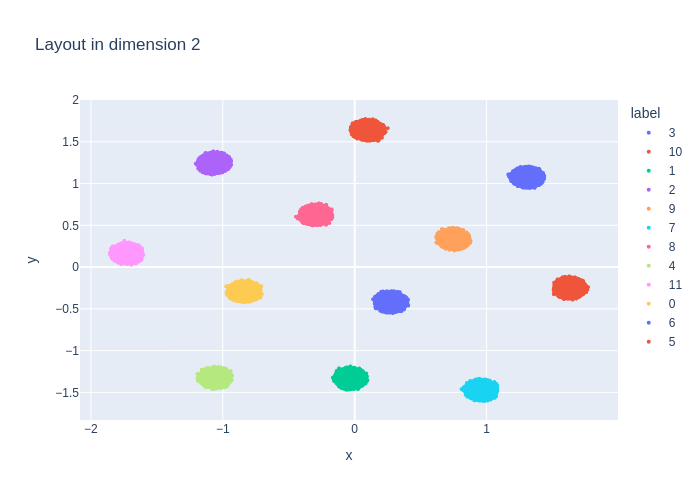

Computing persistence up to dimension 1 and global metrics
done


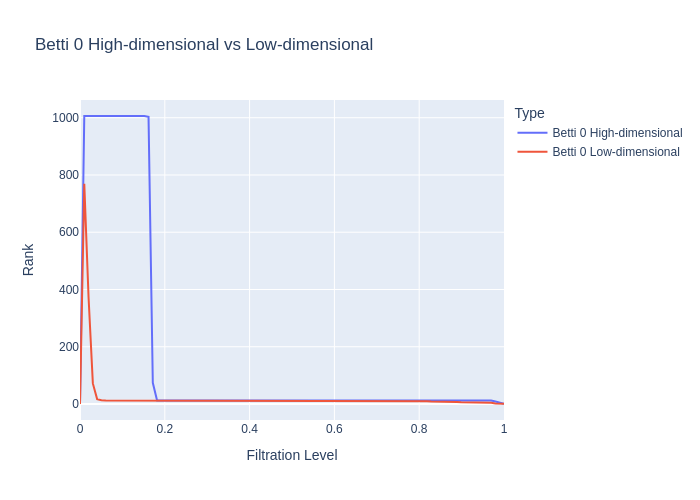

Distance `DTW` for dimension 0: 1.7110033710883756
Distance `TWED` for dimension 0: 0.11651545092223925
Distance `EMD` for dimension 0: 0.021888851246270682
Distance `Wasserstein` for dimension 0: 3.2052814454022096
Distance `bottleneck` for dimension 0: 126.6282958984375


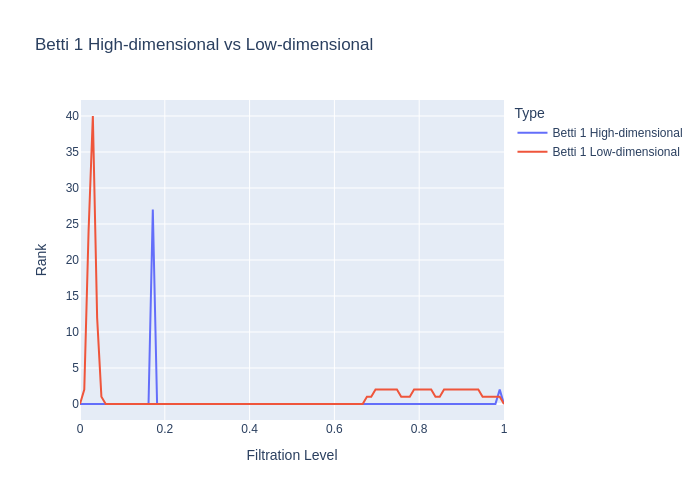

Distance `DTW` for dimension 1: 1.288205005434219
Distance `TWED` for dimension 1: 0.014966662673704877
Distance `EMD` for dimension 1: 0.026344242655525225
Distance `Wasserstein` for dimension 1: 0.02132665767421032
Distance `bottleneck` for dimension 1: 0.9532089233398438
Computing kNN graphs and local metrics
done
Embedding stress (scaling adjusted): 2.804774063419237
Neighborhood preservation score (mean, std): [0.001771267270669341, 0.010589919053018093]
Computing context measures
done
Context preservation score (SVM): [1.0, 1.0, 0.0]
Context preservation score (kNN): [1.0, 1.0, 0.0]


In [16]:
viz_benchmark(reducer_blobs,
              features_blobs,
              labels=labels_blobs,
              dimension=1,
              subsample_threshold=0.1,
              rng_key=random.PRNGKey(42),
              point_size=4)

### Defining benchmark dictionary

In [17]:
benchmarks_blobs = {}

In [18]:
benchmark = run_benchmark(reducer_blobs,
                          features_blobs,
                          labels=labels_blobs,
                          dimension=1,
                          subsample_threshold=0.1,
                          rng_key=random.PRNGKey(42),
                          num_trials=1,
                          only_stats=True,)
#
#
#
benchmarks_blobs['dire-jax'] =  {
    'Embedding time': benchmark['timing'][0],
    'Embedding stress': benchmark['stress'][0],
    'Neighborhood preservation score': benchmark['neighbor'][0][0],
    'Context preservation score (SVM)': benchmark['svm'][0][2],
    'Context preservation score (kNN)': benchmark['knn'][0][2],
    'Distance DTW for dimension 0': benchmark['dtw'][0][0],
    'Distance TWED for dimension 0': benchmark['twed'][0][0],
    'Distance EMD for dimension 0': benchmark['emd'][0][0],
    'Distance Wasserstein for dimension 0': benchmark['wass'][0][0],
    'Distance bottleneck for dimension 0': benchmark['bott'][0][0],
    'Distance DTW for dimension 1': benchmark['dtw'][0][1],
    'Distance TWED for dimension 1': benchmark['twed'][0][1],
    'Distance EMD for dimension 1': benchmark['emd'][0][1],
    'Distance Wasserstein for dimension 1': benchmark['wass'][0][1],
    'Distance bottleneck for dimension 1': benchmark['bott'][0][1],
    }

100%|██████████| 32/32 [00:02<00:00, 12.56it/s]


### CuML tSNE reducer

[W] [22:11:32.568019] # of Nearest Neighbors should be at least 3 * perplexity. Your results might be a bit strange...
Embedding time: 10.7342 seconds


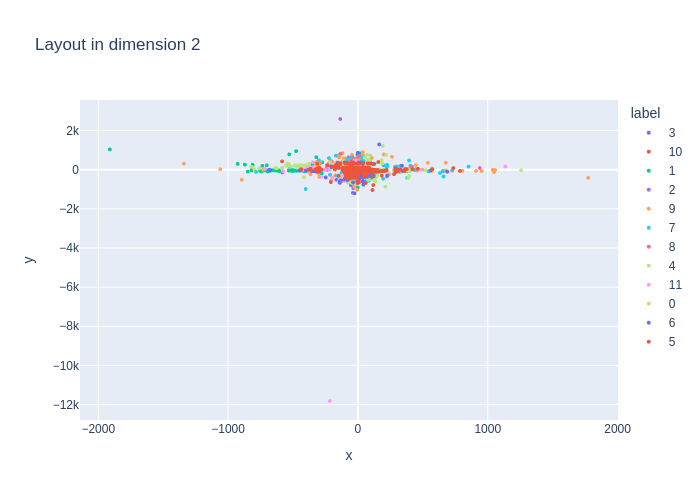

Computing persistence up to dimension 1 and global metrics
done


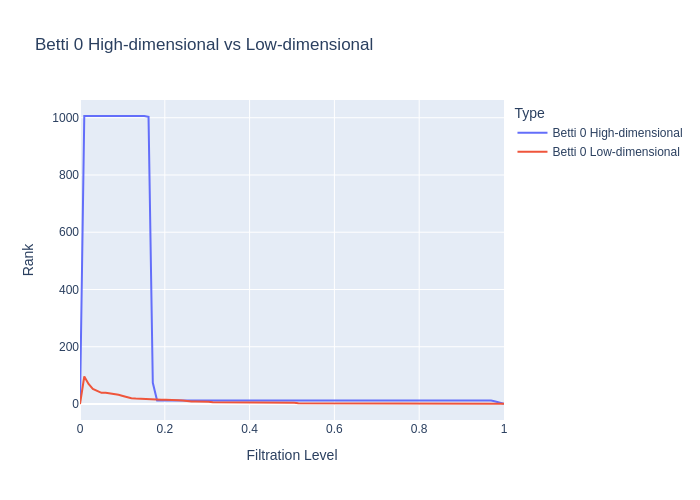

Distance `DTW` for dimension 0: 1.7662082051694723
Distance `TWED` for dimension 0: 0.2117456515885626
Distance `EMD` for dimension 0: 0.08757405274281924
Distance `Wasserstein` for dimension 0: 3.1021089500777763
Distance `bottleneck` for dimension 0: 129.40890502929688


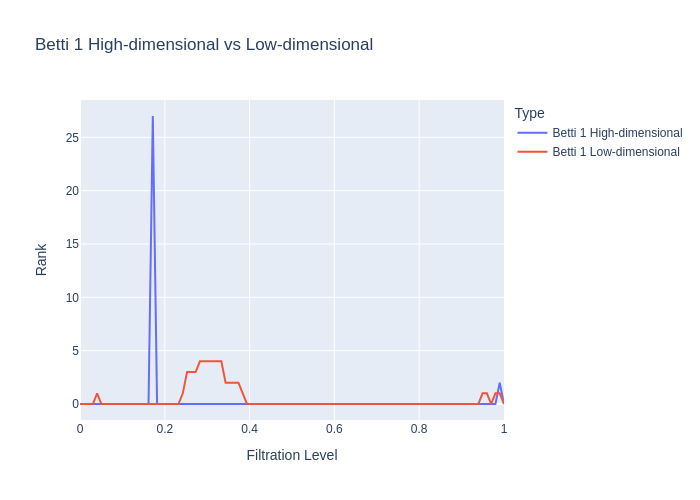

Distance `DTW` for dimension 1: 0.05174697807993172
Distance `TWED` for dimension 1: 0.01014324246495483
Distance `EMD` for dimension 1: 0.004251609154813777
Distance `Wasserstein` for dimension 1: 0.02876814693983376
Distance `bottleneck` for dimension 1: 16.06850814819336
Computing kNN graphs and local metrics
done
Embedding stress (scaling adjusted): 3.9905235844279825
Neighborhood preservation score (mean, std): [0.0006200034986250103, 0.004607698414474726]
Computing context measures
done
Context preservation score (SVM): [1.0, 0.32719356999330207, -1.117203326056353]
Context preservation score (kNN): [1.0, 0.8344666666666667, -0.1809624807563236]


In [19]:
tred_blobs = cTSNE(n_components=2,
                   method='fft',
                   perplexity=reducer_blobs.n_neighbors,
                   n_neighbors=3*reducer_blobs.n_neighbors+1)
#
viz_benchmark(tred_blobs,
              features_blobs,
              labels=labels_blobs,
              dimension=1,
              subsample_threshold=0.1,
              rng_key=random.PRNGKey(42),
              point_size=4)

In [20]:
benchmark = run_benchmark(tred_blobs,
                          features_blobs,
                          labels=labels_blobs,
                          dimension=1,
                          subsample_threshold=0.1,
                          rng_key=random.PRNGKey(42),
                          num_trials=1,
                          only_stats=True,)
#
#
#
benchmarks_blobs['cuml-tsne'] =  {
    'Embedding time': benchmark['timing'][0],
    'Embedding stress': benchmark['stress'][0],
    'Neighborhood preservation score': benchmark['neighbor'][0][0],
    'Context preservation score (SVM)': benchmark['svm'][0][2],
    'Context preservation score (kNN)': benchmark['knn'][0][2],
    'Distance DTW for dimension 0': benchmark['dtw'][0][0],
    'Distance TWED for dimension 0': benchmark['twed'][0][0],
    'Distance EMD for dimension 0': benchmark['emd'][0][0],
    'Distance Wasserstein for dimension 0': benchmark['wass'][0][0],
    'Distance bottleneck for dimension 0': benchmark['bott'][0][0],
    'Distance DTW for dimension 1': benchmark['dtw'][0][1],
    'Distance TWED for dimension 1': benchmark['twed'][0][1],
    'Distance EMD for dimension 1': benchmark['emd'][0][1],
    'Distance Wasserstein for dimension 1': benchmark['wass'][0][1],
    'Distance bottleneck for dimension 1': benchmark['bott'][0][1],
    }

[W] [22:14:16.420287] # of Nearest Neighbors should be at least 3 * perplexity. Your results might be a bit strange...


### CuML UMAP reducer

Embedding time: 8.1592 seconds


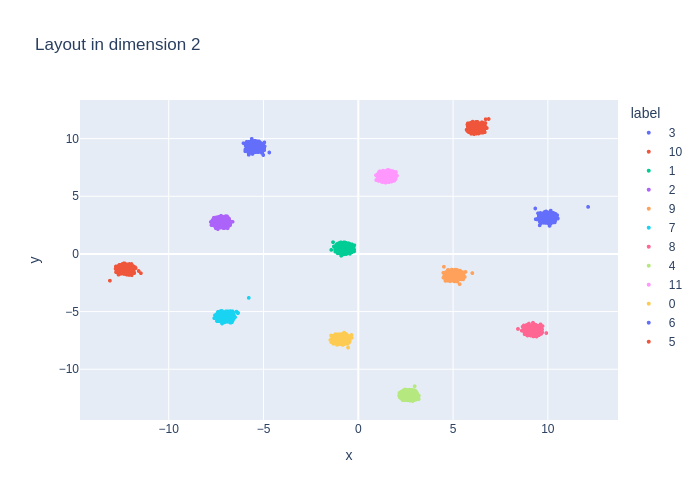

Computing persistence up to dimension 1 and global metrics
done


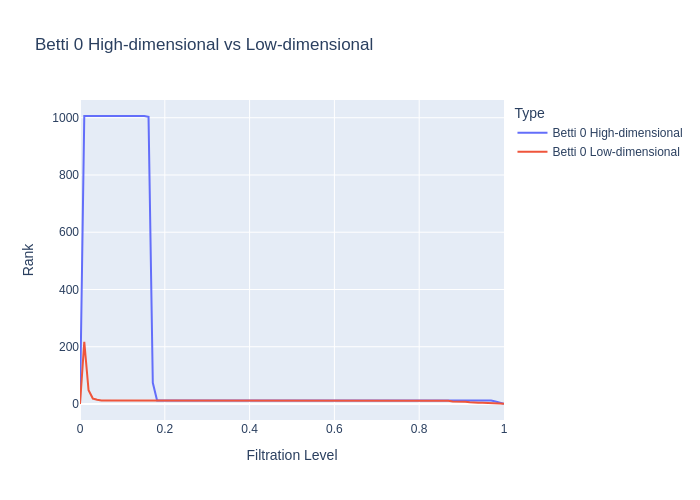

Distance `DTW` for dimension 0: 2.5449445005846845
Distance `TWED` for dimension 0: 0.17162270254644166
Distance `EMD` for dimension 0: 0.03399580310320028
Distance `Wasserstein` for dimension 0: 3.2113340605207155
Distance `bottleneck` for dimension 0: 126.6282958984375


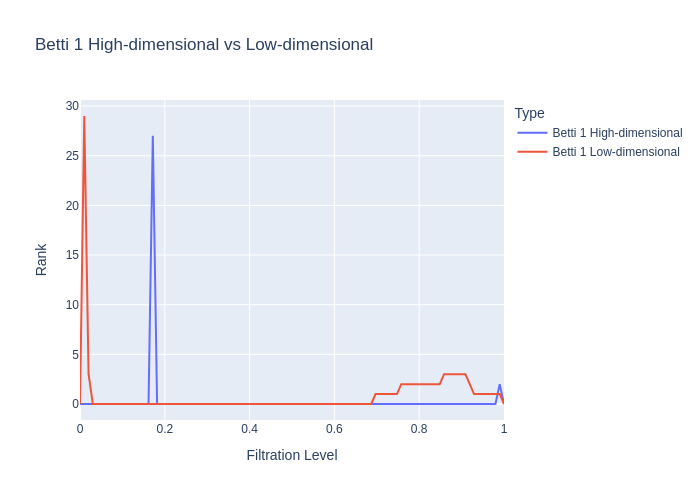

Distance `DTW` for dimension 1: 1.2233043451974641
Distance `TWED` for dimension 1: 0.009108433002827635
Distance `EMD` for dimension 1: 0.015736491902566305
Distance `Wasserstein` for dimension 1: 0.02174499117304464
Distance `bottleneck` for dimension 1: 1.0759570598602295
Computing kNN graphs and local metrics
done
Embedding stress (scaling adjusted): 2.1228826867859274
Neighborhood preservation score (mean, std): [0.0005537309916689992, 0.0058743916451931]
Computing context measures
done
Context preservation score (SVM): [1.0, 0.999330207635633, -0.000670016775484218]
Context preservation score (kNN): [1.0, 1.0, 0.0]


In [21]:
cured_blobs = cUMAP(n_components=reducer_blobs.dimension,
                    n_neighbors=reducer_blobs.n_neighbors,
                    min_dist=reducer_blobs.min_dist,
                    spread=reducer_blobs.spread)
#
viz_benchmark(cured_blobs,
              features_blobs,
              labels=labels_blobs,
              dimension=1,
              subsample_threshold=0.1,
              rng_key=random.PRNGKey(42),
              point_size=4)

In [22]:
benchmark = run_benchmark(cured_blobs,
                          features_blobs,
                          labels=labels_blobs,
                          dimension=1,
                          subsample_threshold=0.1,
                          rng_key=random.PRNGKey(42),
                          num_trials=1,
                          only_stats=True,)
#
#
#
benchmarks_blobs['cuml-umap'] =  {
    'Embedding time': benchmark['timing'][0],
    'Embedding stress': benchmark['stress'][0],
    'Neighborhood preservation score': benchmark['neighbor'][0][0],
    'Context preservation score (SVM)': benchmark['svm'][0][2],
    'Context preservation score (kNN)': benchmark['knn'][0][2],
    'Distance DTW for dimension 0': benchmark['dtw'][0][0],
    'Distance TWED for dimension 0': benchmark['twed'][0][0],
    'Distance EMD for dimension 0': benchmark['emd'][0][0],
    'Distance Wasserstein for dimension 0': benchmark['wass'][0][0],
    'Distance bottleneck for dimension 0': benchmark['bott'][0][0],
    'Distance DTW for dimension 1': benchmark['dtw'][0][1],
    'Distance TWED for dimension 1': benchmark['twed'][0][1],
    'Distance EMD for dimension 1': benchmark['emd'][0][1],
    'Distance Wasserstein for dimension 1': benchmark['wass'][0][1],
    'Distance bottleneck for dimension 1': benchmark['bott'][0][1],
    }

### Original UMAP reducer

Embedding time: 79.5290 seconds


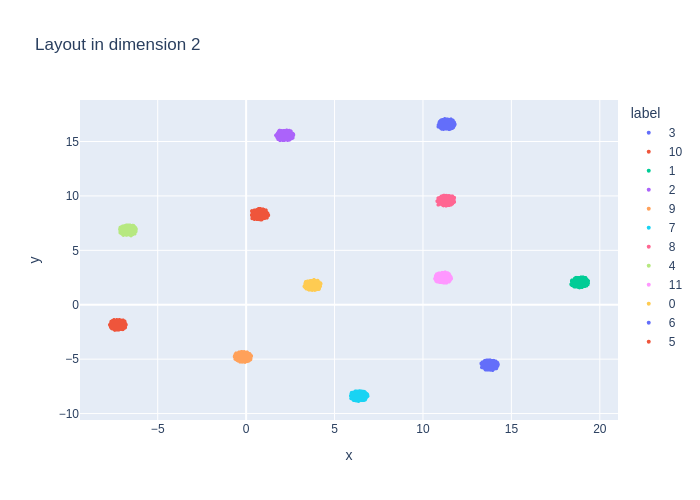

Computing persistence up to dimension 1 and global metrics
done


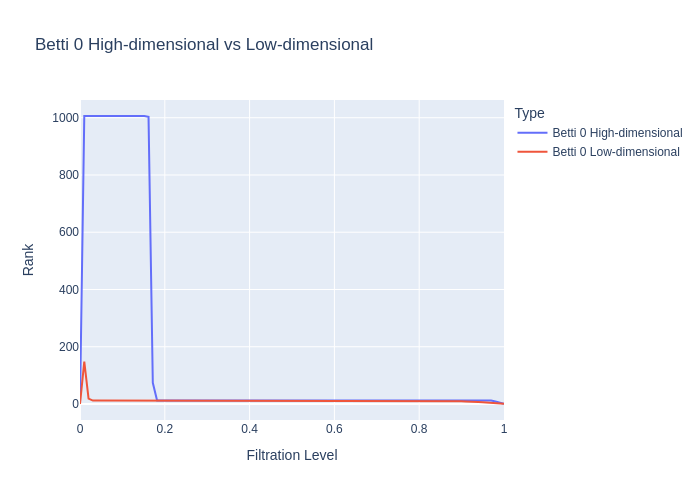

Distance `DTW` for dimension 0: 2.6798824473314897
Distance `TWED` for dimension 0: 0.19010180752377034
Distance `EMD` for dimension 0: 0.03548210568529002
Distance `Wasserstein` for dimension 0: 3.212033404665318
Distance `bottleneck` for dimension 0: 126.6282958984375


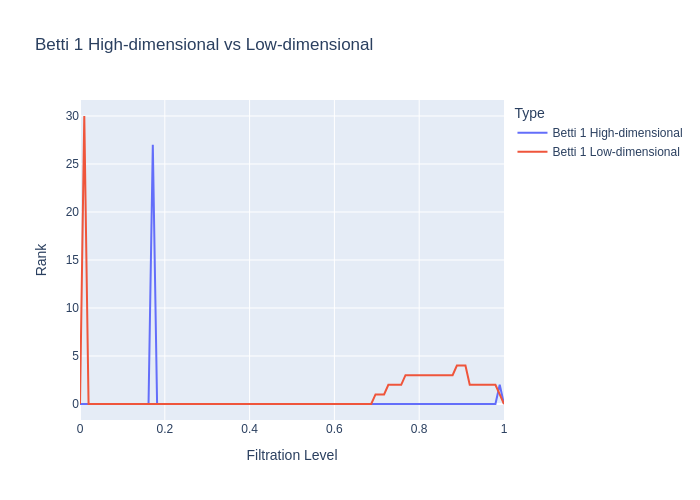

Distance `DTW` for dimension 1: 1.1939431931144844
Distance `TWED` for dimension 1: 0.008898860771939686
Distance `EMD` for dimension 1: 0.018630871247069858
Distance `Wasserstein` for dimension 1: 0.02200291094635801
Distance `bottleneck` for dimension 1: 1.7472550868988037
Computing kNN graphs and local metrics
done
Embedding stress (scaling adjusted): 1.9989543954568867
Neighborhood preservation score (mean, std): [0.0005743502406403422, 0.005993920844048262]
Computing context measures
done
Context preservation score (SVM): [1.0, 1.0, 0.0]
Context preservation score (kNN): [1.0, 1.0, 0.0]


In [23]:
red_blobs = UMAP(n_components=reducer_blobs.dimension,
                 n_neighbors=reducer_blobs.n_neighbors,
                 min_dist=reducer_blobs.min_dist,
                 spread=reducer_blobs.spread)
#
viz_benchmark(red_blobs,
              features_blobs,
              labels=labels_blobs,
              dimension=1,
              subsample_threshold=0.1,
              rng_key=random.PRNGKey(42),
              point_size=4)

In [24]:
benchmark = run_benchmark(red_blobs,
                          features_blobs,
                          labels=labels_blobs,
                          dimension=1,
                          subsample_threshold=0.1,
                          rng_key=random.PRNGKey(42),
                          num_trials=1,
                          only_stats=True,)
#
#
#
benchmarks_blobs['umap'] =  {
    'Embedding time': benchmark['timing'][0],
    'Embedding stress': benchmark['stress'][0],
    'Neighborhood preservation score': benchmark['neighbor'][0][0],
    'Context preservation score (SVM)': benchmark['svm'][0][2],
    'Context preservation score (kNN)': benchmark['knn'][0][2],
    'Distance DTW for dimension 0': benchmark['dtw'][0][0],
    'Distance TWED for dimension 0': benchmark['twed'][0][0],
    'Distance EMD for dimension 0': benchmark['emd'][0][0],
    'Distance Wasserstein for dimension 0': benchmark['wass'][0][0],
    'Distance bottleneck for dimension 0': benchmark['bott'][0][0],
    'Distance DTW for dimension 1': benchmark['dtw'][0][1],
    'Distance TWED for dimension 1': benchmark['twed'][0][1],
    'Distance EMD for dimension 1': benchmark['emd'][0][1],
    'Distance Wasserstein for dimension 1': benchmark['wass'][0][1],
    'Distance bottleneck for dimension 1': benchmark['bott'][0][1],
    }

### Defining benchmark visualization procedure

In [17]:
import matplotlib.pyplot as plt

def plot_algorithm_comparison(data):
    """
    Plots comparison graphs for different algorithms based on their performance metrics.

    Parameters:
        data (dict): A dictionary where keys are algorithm names and values are dictionaries of metrics and distance metrics.
    """

    algorithms = list(data.keys())

    # Extracting data from the input dictionary
    embedding_time = [data[alg]['Embedding time'] for alg in algorithms]
    embedding_stress = [data[alg]['Embedding stress'] for alg in algorithms]
    neighborhood_preservation = [data[alg]['Neighborhood preservation score'] for alg in algorithms]
    context_preservation_svm = [data[alg]['Context preservation score (SVM)'] for alg in algorithms]
    context_preservation_knn = [data[alg]['Context preservation score (kNN)'] for alg in algorithms]

    # Distance metrics for dimension 0 and dimension 1
    dtw_dim0 = [data[alg]['Distance DTW for dimension 0'] for alg in algorithms]
    twed_dim0 = [data[alg]['Distance TWED for dimension 0'] for alg in algorithms]
    emd_dim0 = [data[alg]['Distance EMD for dimension 0'] for alg in algorithms]
    wasserstein_dim0 = [data[alg]['Distance Wasserstein for dimension 0'] for alg in algorithms]
    bottleneck_dim0 = [data[alg]['Distance bottleneck for dimension 0'] for alg in algorithms]

    dtw_dim1 = [data[alg]['Distance DTW for dimension 1'] for alg in algorithms]
    twed_dim1 = [data[alg]['Distance TWED for dimension 1'] for alg in algorithms]
    emd_dim1 = [data[alg]['Distance EMD for dimension 1'] for alg in algorithms]
    wasserstein_dim1 = [data[alg]['Distance Wasserstein for dimension 1'] for alg in algorithms]
    bottleneck_dim1 = [data[alg]['Distance bottleneck for dimension 1'] for alg in algorithms]

    # Normalize for the distance metrics relative to the first algorithm (assumed as reference)
    dtw_dim0_norm = np.array(dtw_dim0) / dtw_dim0[0] #np.log(np.array(dtw_dim0) / dtw_dim0[0])
    twed_dim0_norm = np.array(twed_dim0) / twed_dim0[0] #np.log(np.array(twed_dim0) / twed_dim0[0])
    emd_dim0_norm = np.array(emd_dim0) / emd_dim0[0] #np.log(np.array(emd_dim0) / emd_dim0[0])
    wasserstein_dim0_norm = np.array(wasserstein_dim0) / wasserstein_dim0[0] #np.log(np.array(wasserstein_dim0) / wasserstein_dim0[0])
    bottleneck_dim0_norm = np.array(bottleneck_dim0) / bottleneck_dim0[0] #np.log(np.array(bottleneck_dim0) / bottleneck_dim0[0])

    dtw_dim1_norm = np.array(dtw_dim1) / dtw_dim1[0] #np.log(np.array(dtw_dim1) / dtw_dim1[0])
    twed_dim1_norm = np.array(twed_dim1) / twed_dim1[0] #np.log(np.array(twed_dim1) / twed_dim1[0])
    emd_dim1_norm = np.array(emd_dim1) / emd_dim1[0] #np.log(np.array(emd_dim1) / emd_dim1[0])
    wasserstein_dim1_norm = np.array(wasserstein_dim1) / wasserstein_dim1[0] #np.log(np.array(wasserstein_dim1) / wasserstein_dim1[0])
    bottleneck_dim1_norm = np.array(bottleneck_dim1) / bottleneck_dim1[0] #np.log(np.array(bottleneck_dim1) / bottleneck_dim1[0])

    # Plotting the graphs
    fig, axs = plt.subplots(3, 2, figsize=(15, 15))

    # Embedding Time
    axs[0, 0].bar(algorithms, embedding_time, color='blue')
    axs[0, 0].set_title('Embedding Time (seconds)')
    axs[0, 0].set_ylabel('Time (s)')

    # Embedding Stress
    axs[0, 1].bar(algorithms, embedding_stress, color='green')
    axs[0, 1].set_title('Embedding Stress (Scaling Adjusted)')
    axs[0, 1].set_ylabel('Stress')

    # Neighborhood Preservation Score (Mean)
    axs[1, 0].bar(algorithms, neighborhood_preservation, color='orange')
    axs[1, 0].set_title('Neighborhood Preservation Score (Mean)')
    axs[1, 0].set_ylabel('Score')

    # Context Preservation Score (SVM and kNN)
    bar_width = 0.35
    index = np.arange(len(algorithms))

    axs[1, 1].bar(index, context_preservation_svm, bar_width, label='SVM', color='red')
    axs[1, 1].bar(index + bar_width, context_preservation_knn, bar_width, label='kNN', color='purple')
    axs[1, 1].set_title('Context Preservation Score (SVM and kNN)')
    axs[1, 1].set_ylabel('Score')
    axs[1, 1].set_xticks(index + bar_width / 2)
    axs[1, 1].set_xticklabels(algorithms)
    axs[1, 1].legend()

    # Plotting the normalized and log-transformed distance metrics for dimension 0
    axs[2, 0].plot(algorithms, dtw_dim0_norm, marker='o', label='DTW', color='blue')
    axs[2, 0].plot(algorithms, twed_dim0_norm, marker='o', label='TWED', color='green')
    axs[2, 0].plot(algorithms, emd_dim0_norm, marker='o', label='EMD', color='orange')
    axs[2, 0].plot(algorithms, wasserstein_dim0_norm, marker='o', label='Wasserstein', color='red')
    axs[2, 0].plot(algorithms, bottleneck_dim0_norm, marker='o', label='Bottleneck', color='purple')
    axs[2, 0].set_title('Normalized Distance Metrics for Dimension 0')
    axs[2, 0].set_ylabel('Distance Ratio')
    axs[2, 0].legend()

    # Plotting the normalized and log-transformed distance metrics for dimension 1
    axs[2, 1].plot(algorithms, dtw_dim1_norm, marker='o', label='DTW', color='blue')
    axs[2, 1].plot(algorithms, twed_dim1_norm, marker='o', label='TWED', color='green')
    axs[2, 1].plot(algorithms, emd_dim1_norm, marker='o', label='EMD', color='orange')
    axs[2, 1].plot(algorithms, wasserstein_dim1_norm, marker='o', label='Wasserstein', color='red')
    axs[2, 1].plot(algorithms, bottleneck_dim1_norm, marker='o', label='Bottleneck', color='purple')
    axs[2, 1].set_title('Normalized Distance Metrics for Dimension 1')
    axs[2, 1].set_ylabel('Distance Ratio')
    axs[2, 1].legend()

    plt.tight_layout()
    plt.show()

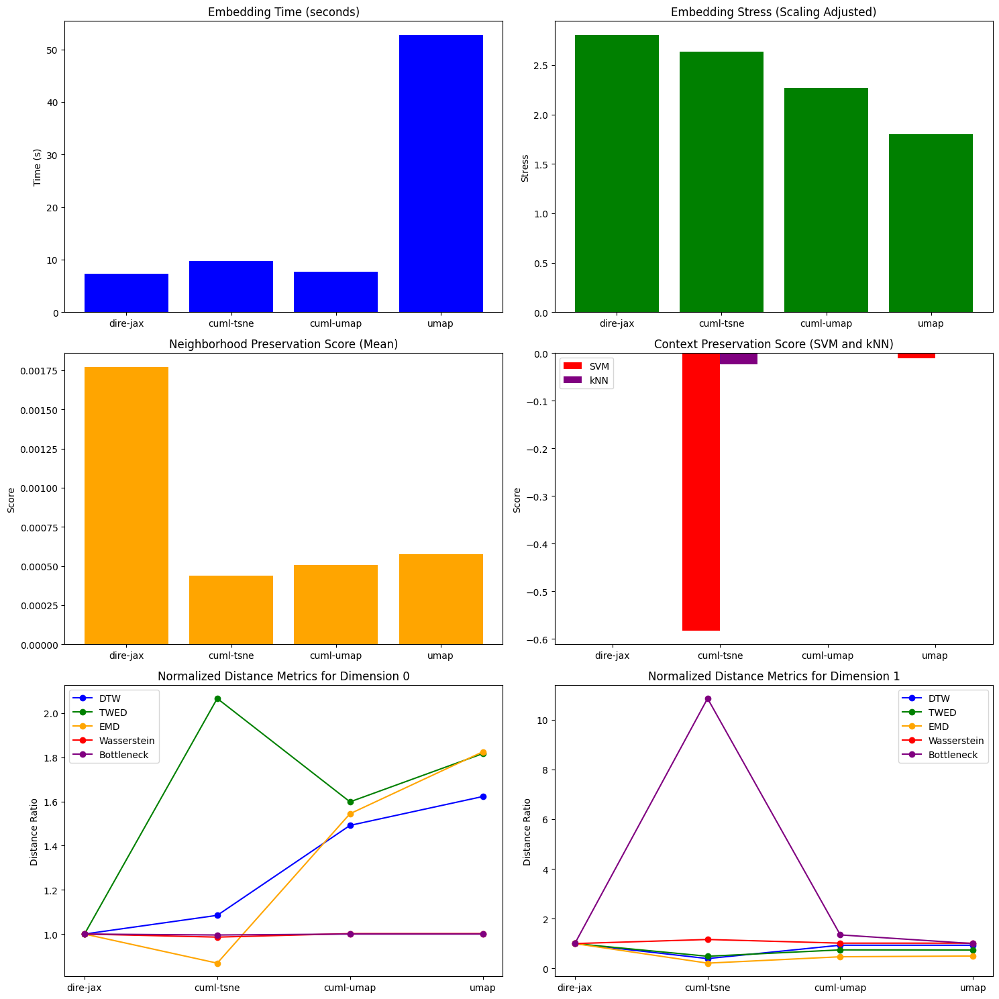

In [26]:
#
# Plot the benchmarking results
#
plot_algorithm_comparison(benchmarks_blobs)

## Dataset "MNIST Digits"

In [27]:
from sklearn.datasets import fetch_openml
# Loading the full MNIST dataset
mnist = fetch_openml('mnist_784', version=1, parser='auto')
#
features_mnist = np.array(mnist['data'], dtype=np.float32)
labels_mnist = np.array(mnist['target'], dtype=np.int32)
#
features_mnist = features_mnist / 255.0 - 0.5

### DiRe reducer

In [28]:
reducer_mnist = DiRe(dimension=2,
                     n_neighbors=32,
                     init_embedding_type='spectral',
                     max_iter_layout=128,
                     min_dist=1e-4,
                     spread=1.0,
                     cutoff=8.0,
                     n_sample_dirs=4,
                     sample_size=32,
                     neg_ratio=16,
                     verbose=False,)

100%|██████████| 128/128 [00:10<00:00, 12.50it/s]


Embedding time: 17.5068 seconds


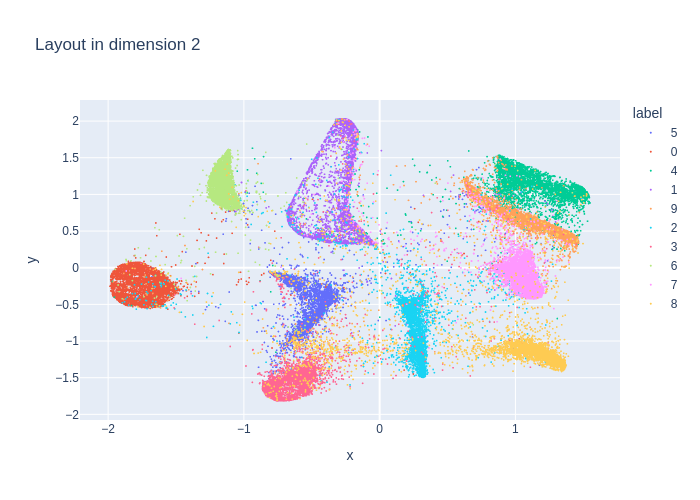

Computing persistence up to dimension 1 and global metrics
done


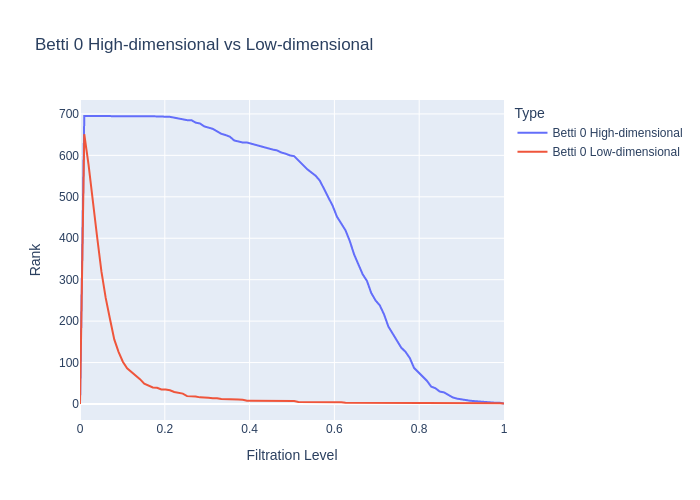

Distance `DTW` for dimension 0: 0.3997615868388619
Distance `TWED` for dimension 0: 0.14175555744230126
Distance `EMD` for dimension 0: 0.004287759630915444
Distance `Wasserstein` for dimension 0: 0.4077070357133928
Distance `bottleneck` for dimension 0: 4.603883266448975


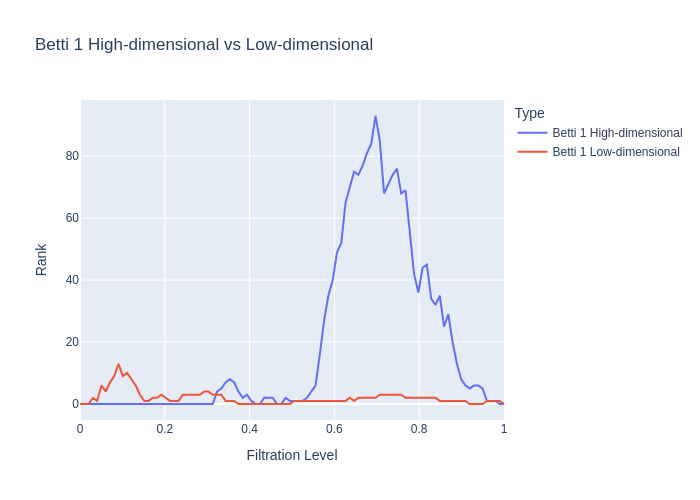

Distance `DTW` for dimension 1: 0.29213506391554317
Distance `TWED` for dimension 1: 0.059076544606420874
Distance `EMD` for dimension 1: 0.009170685051564539
Distance `Wasserstein` for dimension 1: 0.01941946340038222
Distance `bottleneck` for dimension 1: 0.6226644515991211
Computing kNN graphs and local metrics
done
Embedding stress (scaling adjusted): 3.895154097117408
Neighborhood preservation score (mean, std): [0.029235413298010826, 0.04114306718111038]
Computing context measures
done
Context preservation score (SVM): [0.8477751756440282, 0.8435597189695551, -0.004984779083915329]
Context preservation score (kNN): [0.923, 0.9423333333333334, 0.020729834522628554]


In [29]:
viz_benchmark(reducer_mnist,
              features_mnist,
              labels=labels_mnist,
              dimension=1,
              subsample_threshold=0.1,
              rng_key=random.PRNGKey(42),
              point_size=2)

In [30]:
benchmarks_mnist = {}

In [31]:
benchmark = run_benchmark(reducer_mnist,
                          features_mnist,
                          labels=labels_mnist,
                          dimension=1,
                          subsample_threshold=0.1,
                          rng_key=random.PRNGKey(42),
                          num_trials=1,
                          only_stats=True,)
#
#
#
benchmarks_mnist['dire-jax'] =  {
    'Embedding time': benchmark['timing'][0],
    'Embedding stress': benchmark['stress'][0],
    'Neighborhood preservation score': benchmark['neighbor'][0][0],
    'Context preservation score (SVM)': benchmark['svm'][0][2],
    'Context preservation score (kNN)': benchmark['knn'][0][2],
    'Distance DTW for dimension 0': benchmark['dtw'][0][0],
    'Distance TWED for dimension 0': benchmark['twed'][0][0],
    'Distance EMD for dimension 0': benchmark['emd'][0][0],
    'Distance Wasserstein for dimension 0': benchmark['wass'][0][0],
    'Distance bottleneck for dimension 0': benchmark['bott'][0][0],
    'Distance DTW for dimension 1': benchmark['dtw'][0][1],
    'Distance TWED for dimension 1': benchmark['twed'][0][1],
    'Distance EMD for dimension 1': benchmark['emd'][0][1],
    'Distance Wasserstein for dimension 1': benchmark['wass'][0][1],
    'Distance bottleneck for dimension 1': benchmark['bott'][0][1],
    }

100%|██████████| 128/128 [00:06<00:00, 19.05it/s]


### CuML tSNE reducer

[W] [22:31:18.606172] # of Nearest Neighbors should be at least 3 * perplexity. Your results might be a bit strange...
Embedding time: 3.9901 seconds


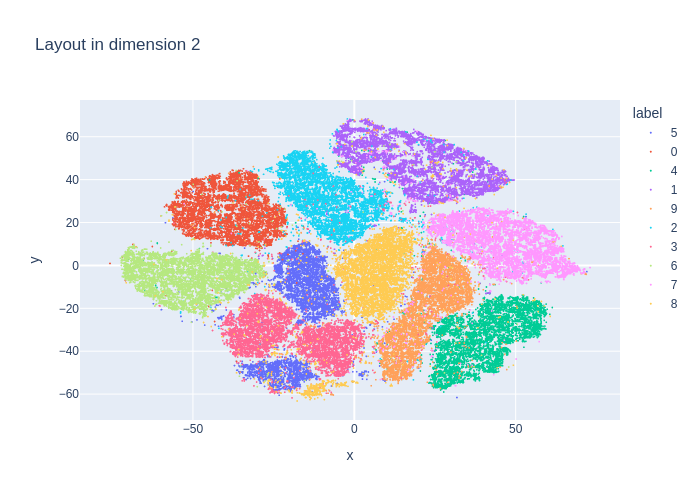

Computing persistence up to dimension 1 and global metrics
done


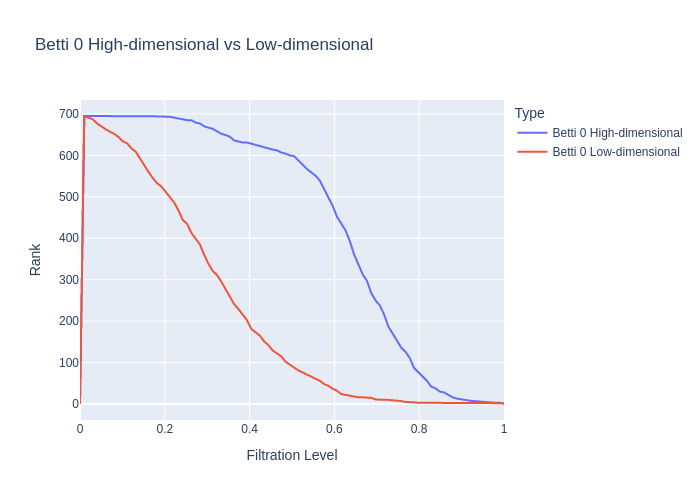

Distance `DTW` for dimension 0: 0.0723755360558175
Distance `TWED` for dimension 0: 0.0877644193283051
Distance `EMD` for dimension 0: 0.0004188836372639959
Distance `Wasserstein` for dimension 0: 0.3069101802589884
Distance `bottleneck` for dimension 0: 3.380707263946533


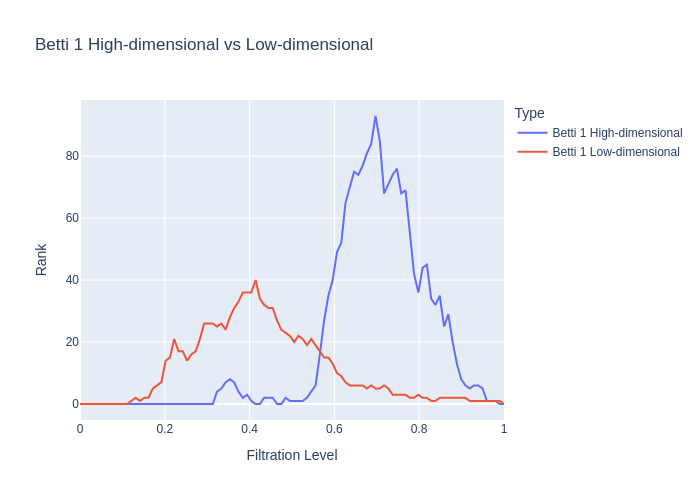

Distance `DTW` for dimension 1: 0.128387927377042
Distance `TWED` for dimension 1: 0.05512200871109124
Distance `EMD` for dimension 1: 0.00029642314022040644
Distance `Wasserstein` for dimension 1: 0.027609363379177833
Distance `bottleneck` for dimension 1: 3.5003862380981445
Computing kNN graphs and local metrics
done
Embedding stress (scaling adjusted): 3.1596185865081376
Neighborhood preservation score (mean, std): [0.0654677227139473, 0.06708496809005737]
Computing context measures
done
Context preservation score (SVM): [0.8477751756440282, 0.7498829039812647, -0.12269841126315678]
Context preservation score (kNN): [0.9241904761904762, 0.9614285714285714, 0.03950208012305168]


In [32]:
tred_mnist = cTSNE(n_components=2,
                   method='fft',
                   perplexity=25,
                   n_neighbors=3*25+1)
#
viz_benchmark(tred_mnist,
              features_mnist,
              labels=labels_mnist,
              dimension=1,
              subsample_threshold=0.1,
              rng_key=random.PRNGKey(42),
              point_size=2)

In [33]:
benchmark = run_benchmark(tred_mnist,
                          features_mnist,
                          labels=labels_mnist,
                          dimension=1,
                          subsample_threshold=0.1,
                          rng_key=random.PRNGKey(42),
                          num_trials=1,
                          only_stats=True,)
#
#
#
benchmarks_mnist['cuml-tsne'] =  {
    'Embedding time': benchmark['timing'][0],
    'Embedding stress': benchmark['stress'][0],
    'Neighborhood preservation score': benchmark['neighbor'][0][0],
    'Context preservation score (SVM)': benchmark['svm'][0][2],
    'Context preservation score (kNN)': benchmark['knn'][0][2],
    'Distance DTW for dimension 0': benchmark['dtw'][0][0],
    'Distance TWED for dimension 0': benchmark['twed'][0][0],
    'Distance EMD for dimension 0': benchmark['emd'][0][0],
    'Distance Wasserstein for dimension 0': benchmark['wass'][0][0],
    'Distance bottleneck for dimension 0': benchmark['bott'][0][0],
    'Distance DTW for dimension 1': benchmark['dtw'][0][1],
    'Distance TWED for dimension 1': benchmark['twed'][0][1],
    'Distance EMD for dimension 1': benchmark['emd'][0][1],
    'Distance Wasserstein for dimension 1': benchmark['wass'][0][1],
    'Distance bottleneck for dimension 1': benchmark['bott'][0][1],
    }

[W] [22:32:41.416621] # of Nearest Neighbors should be at least 3 * perplexity. Your results might be a bit strange...


### CuML UMAP reducer

Embedding time: 2.8234 seconds


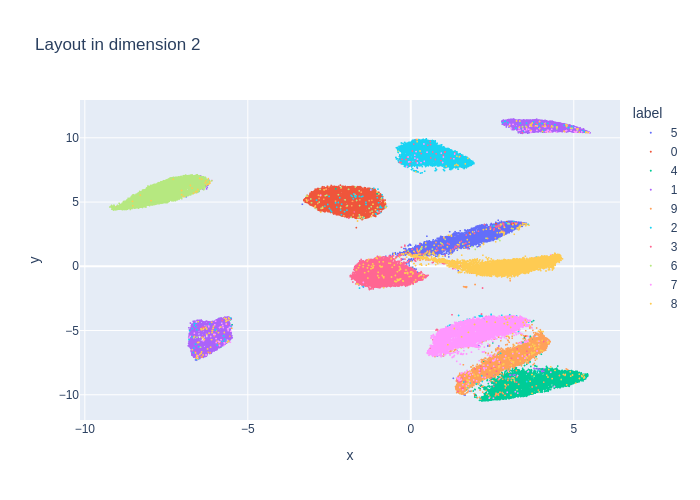

Computing persistence up to dimension 1 and global metrics
done


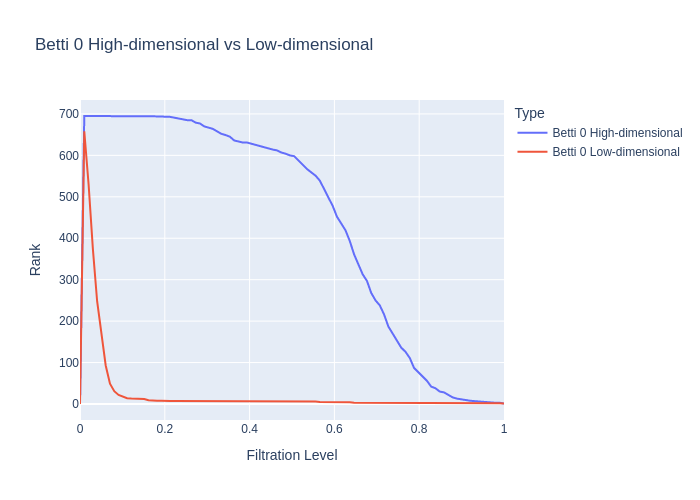

Distance `DTW` for dimension 0: 0.4408997149701775
Distance `TWED` for dimension 0: 0.1735006766202646
Distance `EMD` for dimension 0: 0.006176060037070135
Distance `Wasserstein` for dimension 0: 0.41410433785497014
Distance `bottleneck` for dimension 0: 4.57657527923584


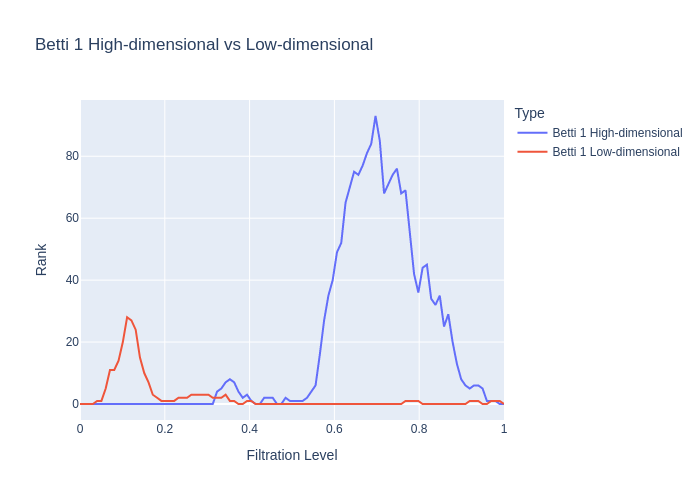

Distance `DTW` for dimension 1: 0.2963314226415303
Distance `TWED` for dimension 1: 0.06047526121742778
Distance `EMD` for dimension 1: 0.007662672214683508
Distance `Wasserstein` for dimension 1: 0.02002447619542405
Distance `bottleneck` for dimension 1: 0.6226644515991211
Computing kNN graphs and local metrics
done
Embedding stress (scaling adjusted): 2.3369089175236493
Neighborhood preservation score (mean, std): [0.024543195962905884, 0.03597153723239899]
Computing context measures
done
Context preservation score (SVM): [0.8477751756440282, 0.5836065573770491, -0.3733884249124732]
Context preservation score (kNN): [0.923, 0.9656666666666667, 0.045189474598388485]


In [34]:
cured_mnist = cUMAP(n_components=reducer_mnist.dimension,
                    n_neighbors=reducer_mnist.n_neighbors,
                    min_dist=reducer_mnist.min_dist,
                    spread=reducer_mnist.spread)
#
viz_benchmark(cured_mnist,
              features_mnist,
              labels=labels_mnist,
              dimension=1,
              subsample_threshold=0.1,
              rng_key=random.PRNGKey(42),
              point_size=2)

In [35]:
benchmark = run_benchmark(cured_mnist,
                          features_mnist,
                          labels=labels_mnist,
                          dimension=1,
                          subsample_threshold=0.1,
                          rng_key=random.PRNGKey(42),
                          num_trials=1,
                          only_stats=True,)
#
#
#
benchmarks_mnist['cuml-umap'] =  {
    'Embedding time': benchmark['timing'][0],
    'Embedding stress': benchmark['stress'][0],
    'Neighborhood preservation score': benchmark['neighbor'][0][0],
    'Context preservation score (SVM)': benchmark['svm'][0][2],
    'Context preservation score (kNN)': benchmark['knn'][0][2],
    'Distance DTW for dimension 0': benchmark['dtw'][0][0],
    'Distance TWED for dimension 0': benchmark['twed'][0][0],
    'Distance EMD for dimension 0': benchmark['emd'][0][0],
    'Distance Wasserstein for dimension 0': benchmark['wass'][0][0],
    'Distance bottleneck for dimension 0': benchmark['bott'][0][0],
    'Distance DTW for dimension 1': benchmark['dtw'][0][1],
    'Distance TWED for dimension 1': benchmark['twed'][0][1],
    'Distance EMD for dimension 1': benchmark['emd'][0][1],
    'Distance Wasserstein for dimension 1': benchmark['wass'][0][1],
    'Distance bottleneck for dimension 1': benchmark['bott'][0][1],
    }

### Original UMAP reducer

Embedding time: 52.9542 seconds


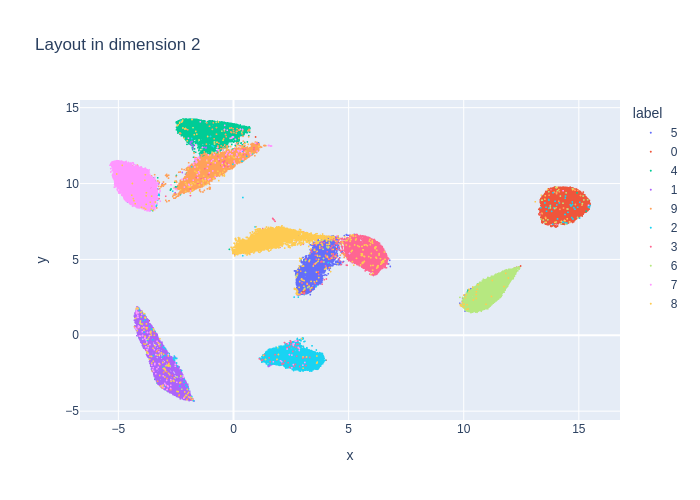

Computing persistence up to dimension 1 and global metrics
done


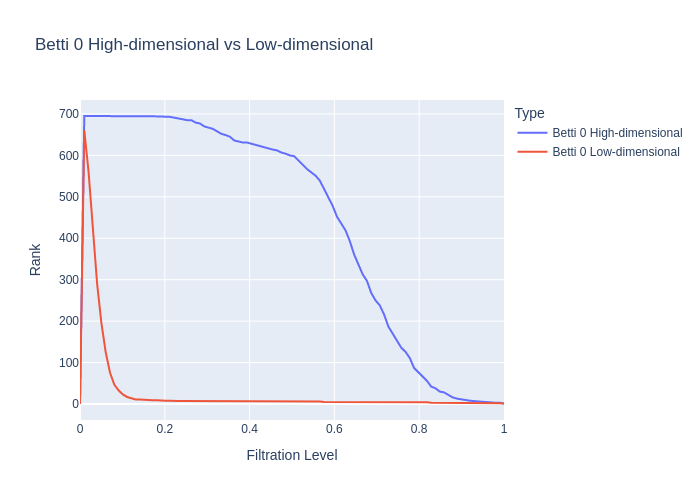

Distance `DTW` for dimension 0: 0.4026419302949083
Distance `TWED` for dimension 0: 0.16816088119047828
Distance `EMD` for dimension 0: 0.0055805062875407116
Distance `Wasserstein` for dimension 0: 0.413939581497286
Distance `bottleneck` for dimension 0: 4.603883266448975


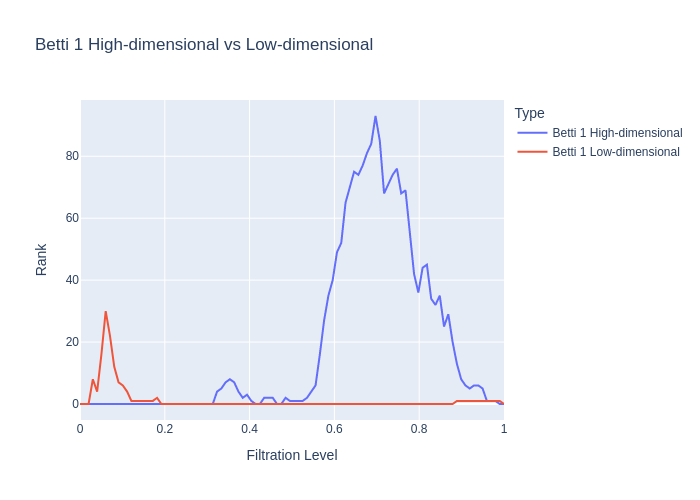

Distance `DTW` for dimension 1: 0.2760677446103939
Distance `TWED` for dimension 1: 0.05597614484588048
Distance `EMD` for dimension 1: 0.012931537692535872
Distance `Wasserstein` for dimension 1: 0.019906847019444222
Distance `bottleneck` for dimension 1: 0.6226644515991211
Computing kNN graphs and local metrics
done
Embedding stress (scaling adjusted): 2.6300572778561437
Neighborhood preservation score (mean, std): [0.025394851341843605, 0.03644108772277832]
Computing context measures
done
Context preservation score (SVM): [0.8477751756440282, 0.810304449648712, -0.045205436768046794]
Context preservation score (kNN): [0.923, 0.9663809523809523, 0.045928882612752873]


In [36]:
red_mnist = UMAP(n_components=reducer_mnist.dimension,
                 n_neighbors=reducer_mnist.n_neighbors,
                 min_dist=reducer_mnist.min_dist,
                 spread=reducer_mnist.spread)
#
viz_benchmark(red_mnist,
              features_mnist,
              labels=labels_mnist,
              dimension=1,
              subsample_threshold=0.1,
              rng_key=random.PRNGKey(42),
              point_size=2)

In [37]:
benchmark = run_benchmark(red_mnist,
                          features_mnist,
                          labels=labels_mnist,
                          dimension=1,
                          subsample_threshold=0.1,
                          rng_key=random.PRNGKey(42),
                          num_trials=1,
                          only_stats=True,)
#
#
#
benchmarks_mnist['umap'] =  {
    'Embedding time': benchmark['timing'][0],
    'Embedding stress': benchmark['stress'][0],
    'Neighborhood preservation score': benchmark['neighbor'][0][0],
    'Context preservation score (SVM)': benchmark['svm'][0][2],
    'Context preservation score (kNN)': benchmark['knn'][0][2],
    'Distance DTW for dimension 0': benchmark['dtw'][0][0],
    'Distance TWED for dimension 0': benchmark['twed'][0][0],
    'Distance EMD for dimension 0': benchmark['emd'][0][0],
    'Distance Wasserstein for dimension 0': benchmark['wass'][0][0],
    'Distance bottleneck for dimension 0': benchmark['bott'][0][0],
    'Distance DTW for dimension 1': benchmark['dtw'][0][1],
    'Distance TWED for dimension 1': benchmark['twed'][0][1],
    'Distance EMD for dimension 1': benchmark['emd'][0][1],
    'Distance Wasserstein for dimension 1': benchmark['wass'][0][1],
    'Distance bottleneck for dimension 1': benchmark['bott'][0][1],
    }

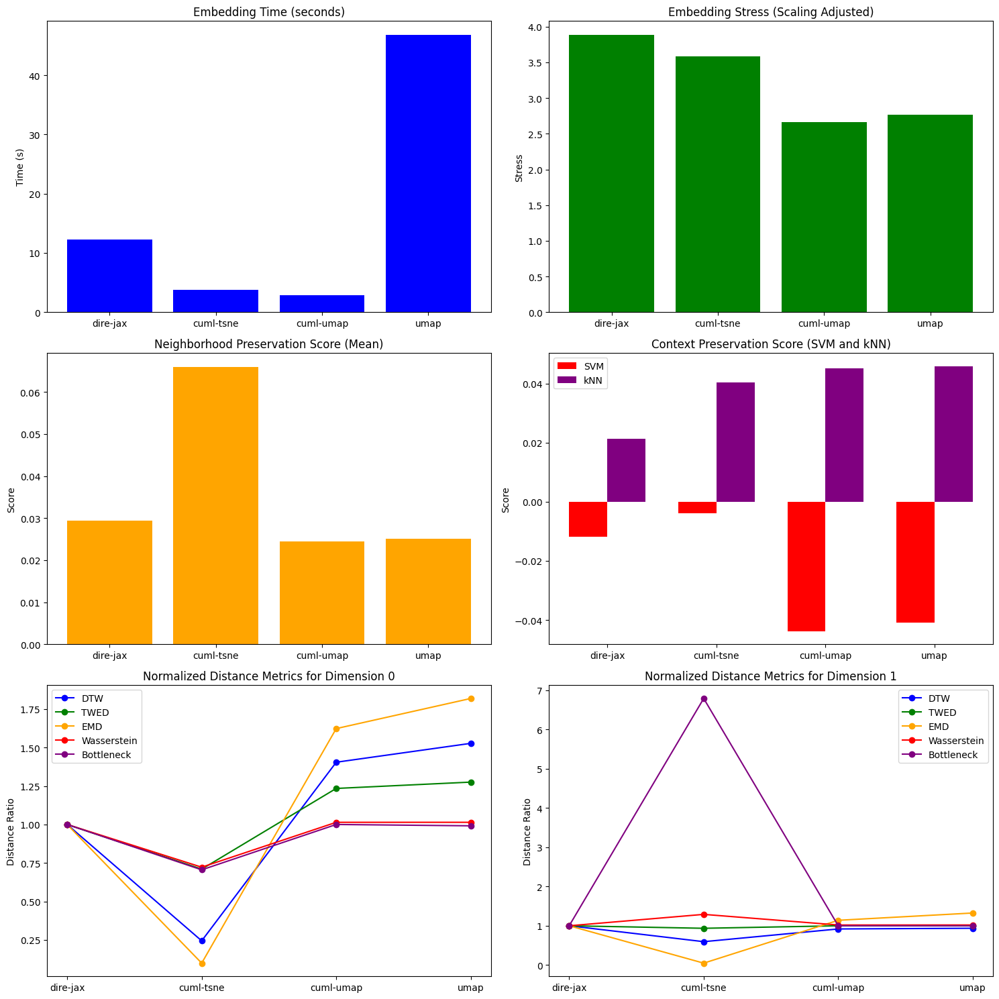

In [38]:
plot_algorithm_comparison(benchmarks_mnist)

## Dataset "Forest Cover Types"

In [39]:
from sklearn.datasets import fetch_covtype
#
features_covtype, labels_covtype = fetch_covtype(return_X_y=True)
features_covtype, labels_covtype = features_covtype[::5], labels_covtype[::5]

### DiRe reducer

In [40]:
reducer_covtype  = DiRe(dimension=3,
                        n_neighbors=32,
                        init_embedding_type='pca',
                        max_iter_layout=64,
                        min_dist=1e-1,
                        spread=1.0,
                        cutoff=16.0,
                        n_sample_dirs=8,
                        sample_size=8,
                        neg_ratio=8,
                        verbose=False)

100%|██████████| 64/64 [00:06<00:00, 10.57it/s]


Embedding time: 7.8132 seconds


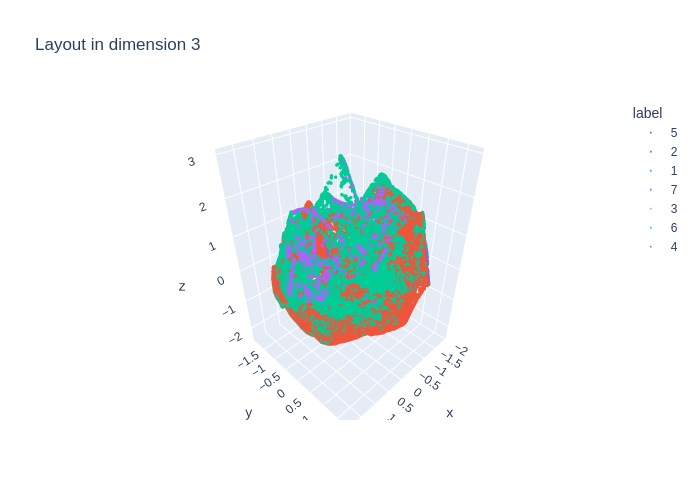

Computing persistence up to dimension 1 and global metrics
done


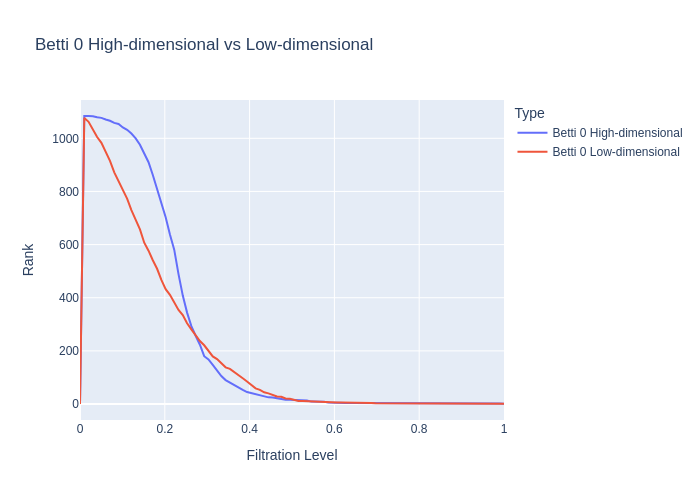

Distance `DTW` for dimension 0: 5.111000147087716
Distance `TWED` for dimension 0: 0.09294223480501491
Distance `EMD` for dimension 0: 0.016465439222390955
Distance `Wasserstein` for dimension 0: 17.716207535246994
Distance `bottleneck` for dimension 0: 573.5660400390625


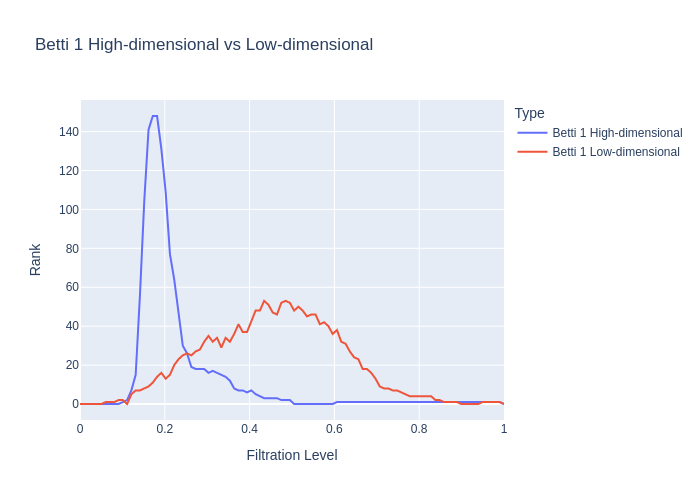

Distance `DTW` for dimension 1: 8.956262167145143
Distance `TWED` for dimension 1: 0.048561781142665045
Distance `EMD` for dimension 1: 0.05703091033505726
Distance `Wasserstein` for dimension 1: 1.7558335058243806
Distance `bottleneck` for dimension 1: 416.88323974609375
Computing kNN graphs and local metrics
done
Embedding stress (scaling adjusted): 1.4015786780021664
Neighborhood preservation score (mean, std): [0.05100785568356514, 0.07770650833845139]
Computing context measures
done
Context preservation score (SVM): [0.7180299539170507, 0.5803571428571429, -0.21286760914277444]
Context preservation score (kNN): [0.8037922033217636, 0.7296692579099854, -0.09674942207577424]


In [41]:
viz_benchmark(reducer_covtype,
              features_covtype,
              labels=labels_covtype,
              dimension=1,
              subsample_threshold=0.1,
              rng_key=random.PRNGKey(42),
              point_size=2)

In [42]:
benchmarks_covtype = {}

In [43]:
benchmark = run_benchmark(reducer_covtype,
                          features_covtype,
                          labels=labels_covtype,
                          dimension=1,
                          subsample_threshold=0.1,
                          rng_key=random.PRNGKey(42),
                          num_trials=1,
                          only_stats=True,)
#
#
#
benchmarks_covtype['dire-jax'] =  {
    'Embedding time': benchmark['timing'][0],
    'Embedding stress': benchmark['stress'][0],
    'Neighborhood preservation score': benchmark['neighbor'][0][0],
    'Context preservation score (SVM)': benchmark['svm'][0][2],
    'Context preservation score (kNN)': benchmark['knn'][0][2],
    'Distance DTW for dimension 0': benchmark['dtw'][0][0],
    'Distance TWED for dimension 0': benchmark['twed'][0][0],
    'Distance EMD for dimension 0': benchmark['emd'][0][0],
    'Distance Wasserstein for dimension 0': benchmark['wass'][0][0],
    'Distance bottleneck for dimension 0': benchmark['bott'][0][0],
    'Distance DTW for dimension 1': benchmark['dtw'][0][1],
    'Distance TWED for dimension 1': benchmark['twed'][0][1],
    'Distance EMD for dimension 1': benchmark['emd'][0][1],
    'Distance Wasserstein for dimension 1': benchmark['wass'][0][1],
    'Distance bottleneck for dimension 1': benchmark['bott'][0][1],
    }

100%|██████████| 64/64 [00:02<00:00, 25.86it/s]


### CuML tSNE reducer

[W] [22:46:02.717420] # of Nearest Neighbors should be at least 3 * perplexity. Your results might be a bit strange...
Embedding time: 2.4491 seconds


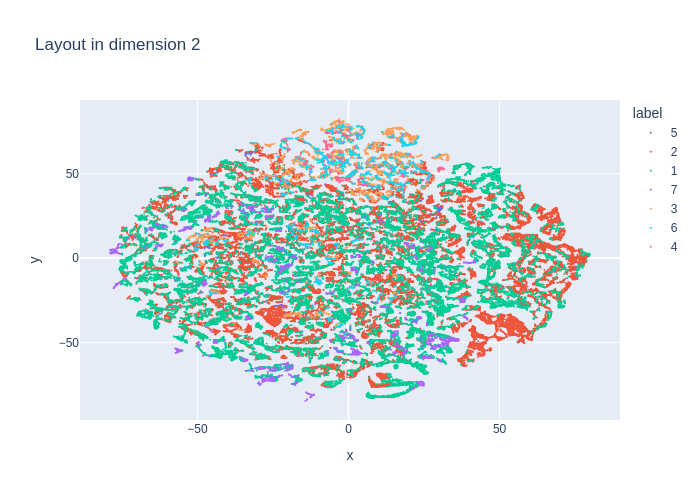

Computing persistence up to dimension 1 and global metrics
done


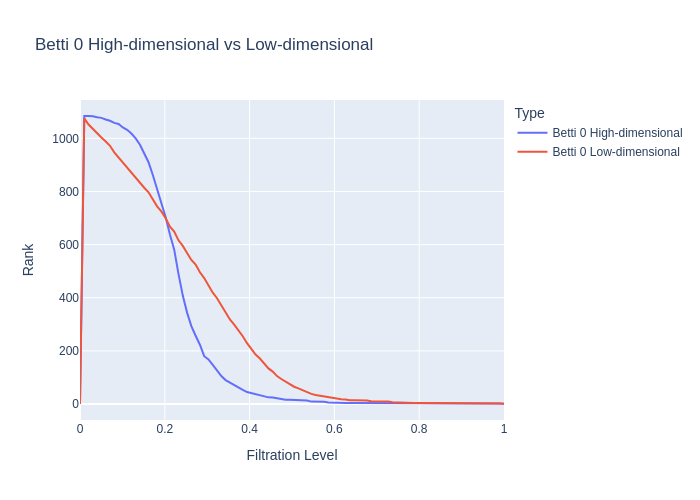

Distance `DTW` for dimension 0: 5.095079100995417
Distance `TWED` for dimension 0: 0.10393591478414198
Distance `EMD` for dimension 0: 0.015590867204546366
Distance `Wasserstein` for dimension 0: 17.877487136224726
Distance `bottleneck` for dimension 0: 573.5660400390625


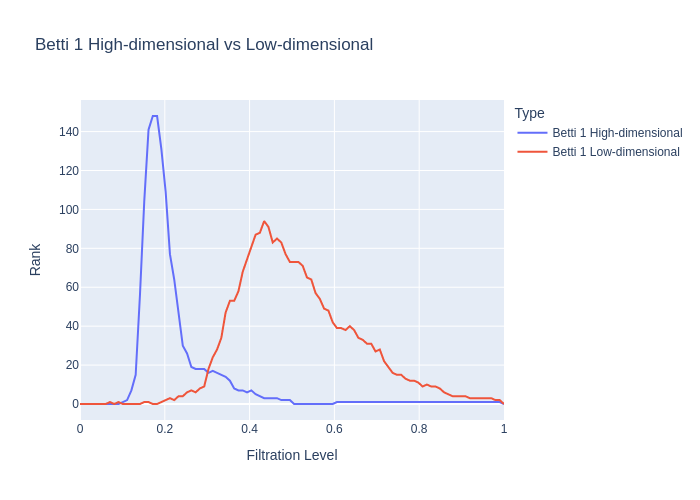

Distance `DTW` for dimension 1: 8.893000374426483
Distance `TWED` for dimension 1: 0.04434140023350417
Distance `EMD` for dimension 1: 0.07463639473970823
Distance `Wasserstein` for dimension 1: 1.7765594322046683
Distance `bottleneck` for dimension 1: 416.88323974609375
Computing kNN graphs and local metrics
done
Embedding stress (scaling adjusted): 2.6862061764947827
Neighborhood preservation score (mean, std): [0.08538363128900528, 0.11766576021909714]
Computing context measures
done
Context preservation score (SVM): [0.7180299539170507, 0.5028801843317973, -0.35615934712401026]
Context preservation score (kNN): [0.8064312555577866, 0.775852672040389, -0.038656009397930305]


In [44]:
tred_covtype = cTSNE(n_components=2,
                     method='fft',
                     perplexity=25,
                     n_neighbors=3*25+1)
#
viz_benchmark(tred_covtype,
              features_covtype,
              labels=labels_covtype,
              dimension=1,
              subsample_threshold=0.1,
              rng_key=random.PRNGKey(42),
              point_size=2)

In [45]:
benchmark = run_benchmark(tred_covtype,
                          features_covtype,
                          labels=labels_covtype,
                          dimension=1,
                          subsample_threshold=0.1,
                          rng_key=random.PRNGKey(42),
                          num_trials=1,
                          only_stats=True,)
#
#
#
benchmarks_covtype['cuml-tsne'] =  {
    'Embedding time': benchmark['timing'][0],
    'Embedding stress': benchmark['stress'][0],
    'Neighborhood preservation score': benchmark['neighbor'][0][0],
    'Context preservation score (SVM)': benchmark['svm'][0][2],
    'Context preservation score (kNN)': benchmark['knn'][0][2],
    'Distance DTW for dimension 0': benchmark['dtw'][0][0],
    'Distance TWED for dimension 0': benchmark['twed'][0][0],
    'Distance EMD for dimension 0': benchmark['emd'][0][0],
    'Distance Wasserstein for dimension 0': benchmark['wass'][0][0],
    'Distance bottleneck for dimension 0': benchmark['bott'][0][0],
    'Distance DTW for dimension 1': benchmark['dtw'][0][1],
    'Distance TWED for dimension 1': benchmark['twed'][0][1],
    'Distance EMD for dimension 1': benchmark['emd'][0][1],
    'Distance Wasserstein for dimension 1': benchmark['wass'][0][1],
    'Distance bottleneck for dimension 1': benchmark['bott'][0][1],
    }

[W] [22:48:10.258979] # of Nearest Neighbors should be at least 3 * perplexity. Your results might be a bit strange...


### CuML UMAP reducer

Embedding time: 1.2557 seconds


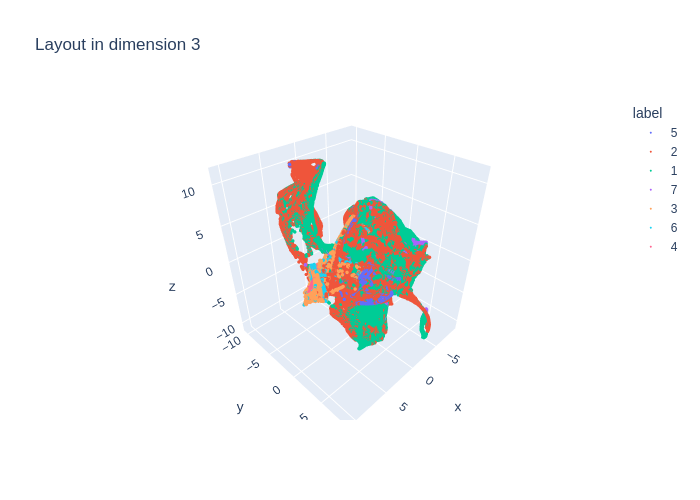

Computing persistence up to dimension 1 and global metrics
done


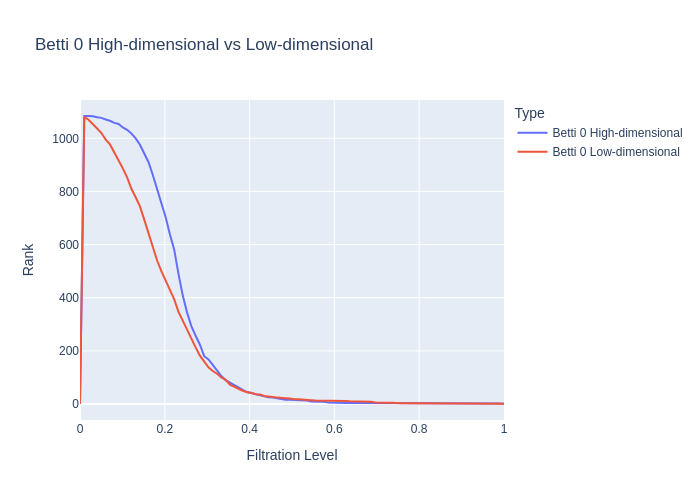

Distance `DTW` for dimension 0: 5.056491466255149
Distance `TWED` for dimension 0: 0.07495632450160125
Distance `EMD` for dimension 0: 0.0161847110277864
Distance `Wasserstein` for dimension 0: 17.74143768595738
Distance `bottleneck` for dimension 0: 573.5660400390625


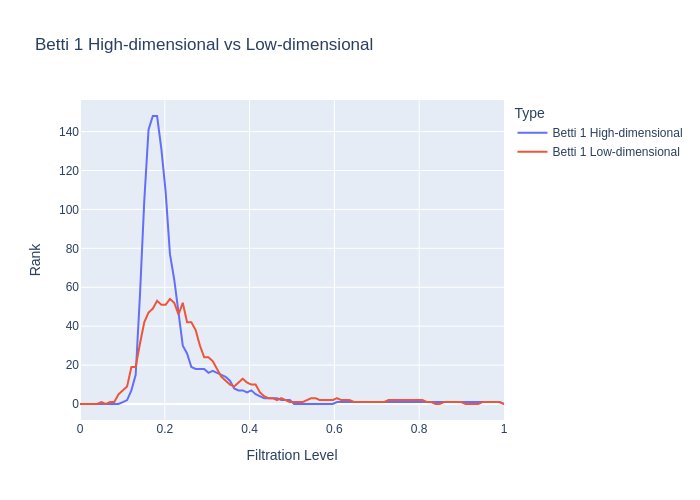

Distance `DTW` for dimension 1: 8.928753929885808
Distance `TWED` for dimension 1: 0.04449093188347879
Distance `EMD` for dimension 1: 0.05433724201003545
Distance `Wasserstein` for dimension 1: 1.7582186376433013
Distance `bottleneck` for dimension 1: 416.88323974609375
Computing kNN graphs and local metrics
done
Embedding stress (scaling adjusted): 1.9595929310504347
Neighborhood preservation score (mean, std): [0.057176582515239716, 0.08695721626281738]
Computing context measures
done
Context preservation score (SVM): [0.7180299539170507, 0.5492511520737328, -0.2679554779231388]
Context preservation score (kNN): [0.8037922033217636, 0.7453027738733828, -0.07555023849220885]


In [46]:
cured_covtype = cUMAP(n_components=reducer_covtype.dimension,
                      n_neighbors=reducer_covtype.n_neighbors,
                      min_dist=reducer_covtype.min_dist,
                      spread=reducer_covtype.spread)
#
viz_benchmark(cured_covtype,
              features_covtype,
              labels=labels_covtype,
              dimension=1,
              subsample_threshold=0.1,
              rng_key=random.PRNGKey(42),
              point_size=2)

In [47]:
benchmark = run_benchmark(cured_covtype,
                          features_covtype,
                          labels=labels_covtype,
                          dimension=1,
                          subsample_threshold=0.1,
                          rng_key=random.PRNGKey(42),
                          num_trials=1,
                          only_stats=True,)
#
#
#
benchmarks_covtype['cuml-umap'] =  {
    'Embedding time': benchmark['timing'][0],
    'Embedding stress': benchmark['stress'][0],
    'Neighborhood preservation score': benchmark['neighbor'][0][0],
    'Context preservation score (SVM)': benchmark['svm'][0][2],
    'Context preservation score (kNN)': benchmark['knn'][0][2],
    'Distance DTW for dimension 0': benchmark['dtw'][0][0],
    'Distance TWED for dimension 0': benchmark['twed'][0][0],
    'Distance EMD for dimension 0': benchmark['emd'][0][0],
    'Distance Wasserstein for dimension 0': benchmark['wass'][0][0],
    'Distance bottleneck for dimension 0': benchmark['bott'][0][0],
    'Distance DTW for dimension 1': benchmark['dtw'][0][1],
    'Distance TWED for dimension 1': benchmark['twed'][0][1],
    'Distance EMD for dimension 1': benchmark['emd'][0][1],
    'Distance Wasserstein for dimension 1': benchmark['wass'][0][1],
    'Distance bottleneck for dimension 1': benchmark['bott'][0][1],
    }

### Original UMAP reducer

Embedding time: 72.9133 seconds


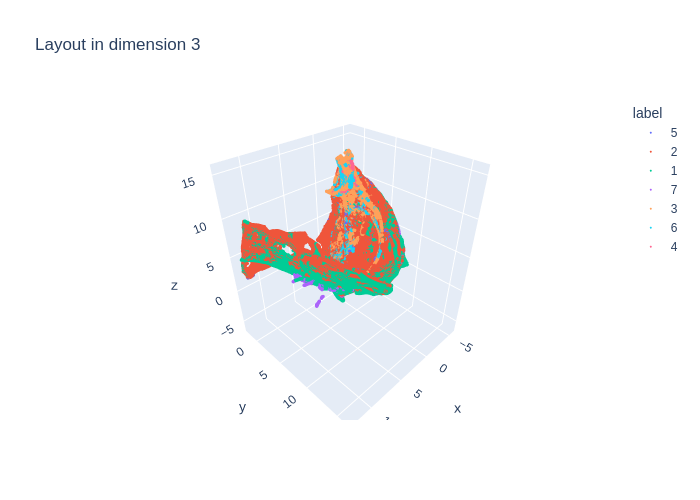

Computing persistence up to dimension 1 and global metrics
done


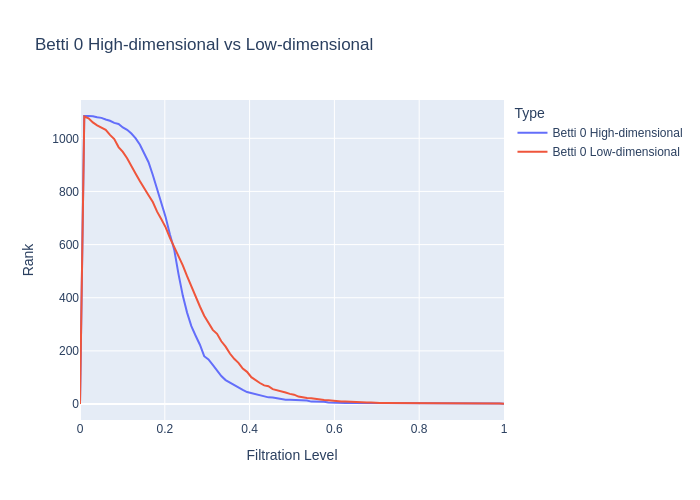

Distance `DTW` for dimension 0: 5.019033421081019
Distance `TWED` for dimension 0: 0.09255713266128597
Distance `EMD` for dimension 0: 0.014207383592679503
Distance `Wasserstein` for dimension 0: 17.740352748011826
Distance `bottleneck` for dimension 0: 573.5660400390625


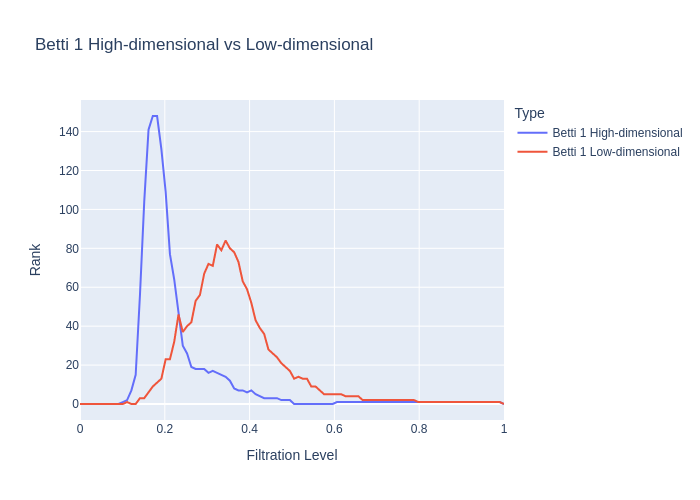

Distance `DTW` for dimension 1: 8.936446405387228
Distance `TWED` for dimension 1: 0.04428369819906788
Distance `EMD` for dimension 1: 0.04951682803959674
Distance `Wasserstein` for dimension 1: 1.7582355435370645
Distance `bottleneck` for dimension 1: 416.88323974609375
Computing kNN graphs and local metrics
done
Embedding stress (scaling adjusted): 2.1047487763842407
Neighborhood preservation score (mean, std): [0.06211055442690849, 0.09177945554256439]
Computing context measures
done
Context preservation score (SVM): [0.7180299539170507, 0.5267857142857143, -0.30971743513269223]
Context preservation score (kNN): [0.8037922033217636, 0.74561831272769, -0.07512695806260859]


In [48]:
red_covtype = UMAP(n_components=reducer_covtype.dimension,
                   n_neighbors=reducer_covtype.n_neighbors,
                   min_dist=reducer_covtype.min_dist,
                   spread=reducer_covtype.spread)
#
viz_benchmark(red_covtype,
              features_covtype,
              labels=labels_covtype,
              dimension=1,
              subsample_threshold=0.1,
              rng_key=random.PRNGKey(42),
              point_size=2)

In [49]:
benchmark = run_benchmark(red_covtype,
                          features_covtype,
                          labels=labels_covtype,
                          dimension=1,
                          subsample_threshold=0.1,
                          rng_key=random.PRNGKey(42),
                          num_trials=1,
                          only_stats=True,)
#
#
#
benchmarks_covtype['umap'] =  {
    'Embedding time': benchmark['timing'][0],
    'Embedding stress': benchmark['stress'][0],
    'Neighborhood preservation score': benchmark['neighbor'][0][0],
    'Context preservation score (SVM)': benchmark['svm'][0][2],
    'Context preservation score (kNN)': benchmark['knn'][0][2],
    'Distance DTW for dimension 0': benchmark['dtw'][0][0],
    'Distance TWED for dimension 0': benchmark['twed'][0][0],
    'Distance EMD for dimension 0': benchmark['emd'][0][0],
    'Distance Wasserstein for dimension 0': benchmark['wass'][0][0],
    'Distance bottleneck for dimension 0': benchmark['bott'][0][0],
    'Distance DTW for dimension 1': benchmark['dtw'][0][1],
    'Distance TWED for dimension 1': benchmark['twed'][0][1],
    'Distance EMD for dimension 1': benchmark['emd'][0][1],
    'Distance Wasserstein for dimension 1': benchmark['wass'][0][1],
    'Distance bottleneck for dimension 1': benchmark['bott'][0][1],
    }

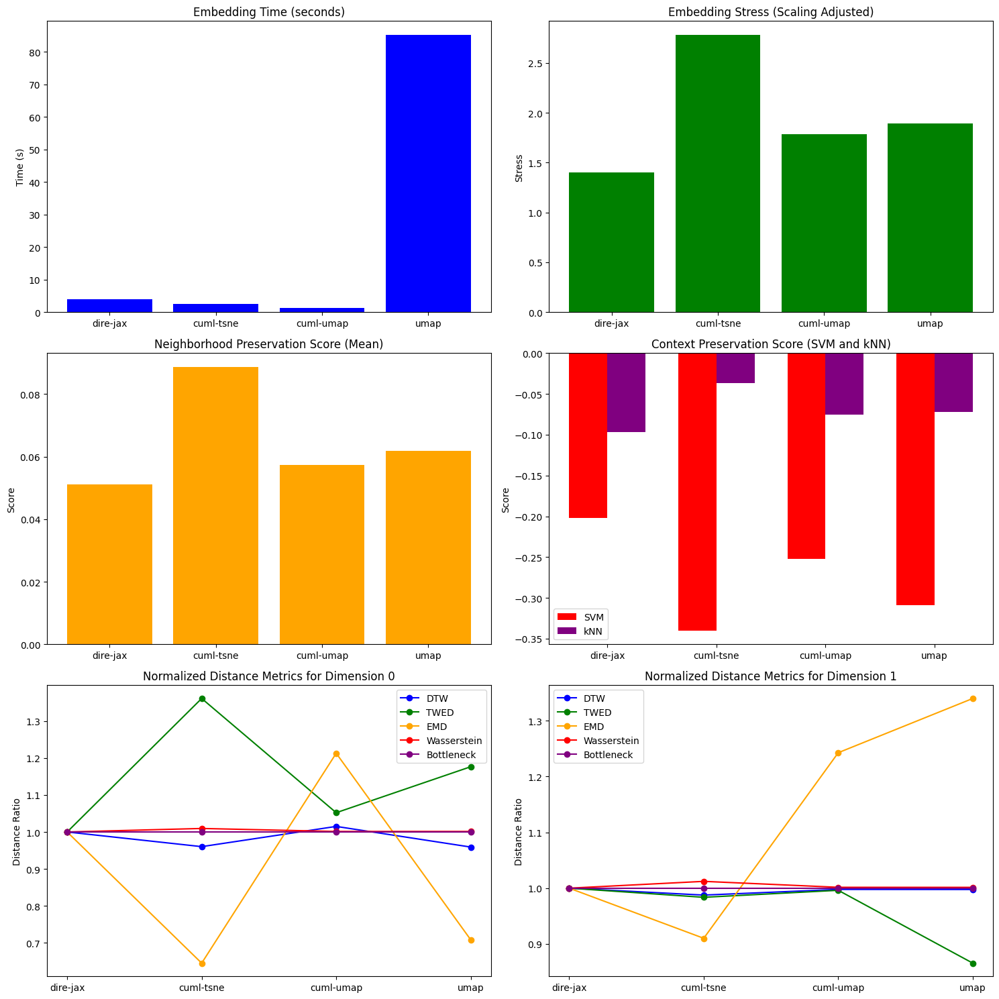

In [50]:
plot_algorithm_comparison(benchmarks_covtype)

## Dataset "Disk Uniform"

In [15]:
def rand_point_disk(n, num=1):
  prepts = np.random.randn(num, n)
  prenorms = np.linalg.norm(prepts, axis=1).reshape(-1, 1)
  rads = np.sqrt(np.random.rand(num)).reshape(-1, 1)
  pts = prepts * rads/prenorms
  return pts

In [16]:
features_disk, labels_disk = rand_point_disk(2, 10000), None

### DiRe reducer

In [17]:
reducer_disk = DiRe(dimension=2,
                    n_neighbors=64,
                    init_embedding_type='pca',
                    max_iter_layout=16,
                    min_dist=1e-4,
                    spread=1.0,
                    cutoff=1.0,
                    n_sample_dirs=8,
                    sample_size=32,
                    neg_ratio=8,
                    verbose=False,)

100%|██████████| 16/16 [00:03<00:00,  4.01it/s]


Embedding time: 5.2273 seconds


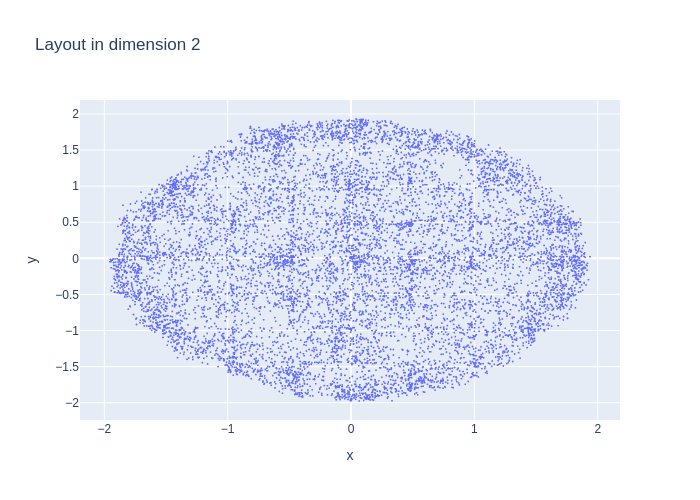

Computing persistence up to dimension 1 and global metrics
done


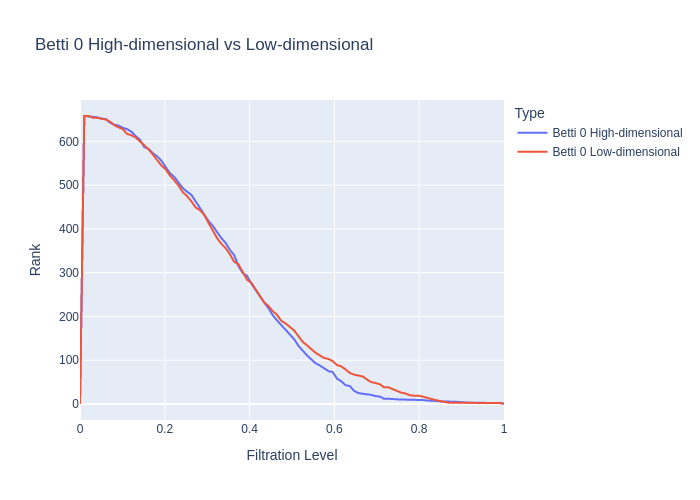

Distance `DTW` for dimension 0: 0.09734680728424822
Distance `TWED` for dimension 0: 0.18443871880319798
Distance `EMD` for dimension 0: 1.0124854513214669e-05
Distance `Wasserstein` for dimension 0: 0.009300762742383293
Distance `bottleneck` for dimension 0: 0.09820801764726639


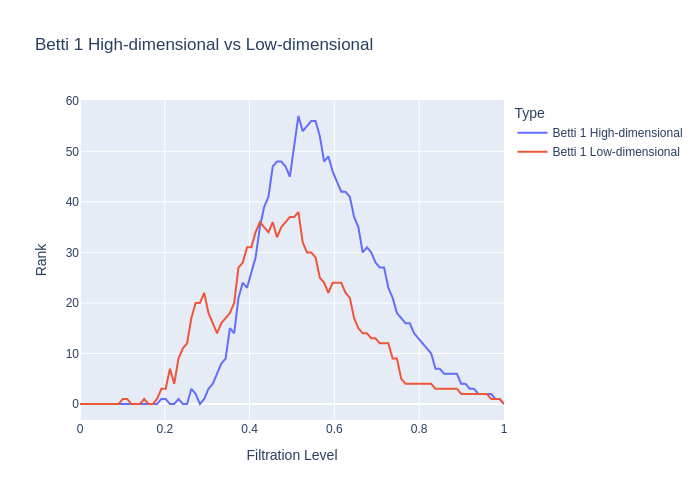

Distance `DTW` for dimension 1: 0.12287899408023724
Distance `TWED` for dimension 1: 0.09572474854465589
Distance `EMD` for dimension 1: 7.023498969635294e-05
Distance `Wasserstein` for dimension 1: 0.002267228316013994
Distance `bottleneck` for dimension 1: 0.15800417959690094
Computing kNN graphs and local metrics
done
Embedding stress (scaling adjusted): 1.2483441391220311
Neighborhood preservation score (mean, std): [0.066628098487854, 0.05272722244262695]
Data has no labels: no context analysis performed


In [18]:
viz_benchmark(reducer_disk,
              features_disk,
              labels=labels_disk,
              dimension=1,
              subsample_threshold=0.25,
              rng_key=random.PRNGKey(42),
              point_size=2)

In [19]:
benchmarks_disk = {}

In [20]:
benchmark = run_benchmark(reducer_disk,
                          features_disk,
                          labels=labels_disk,
                          dimension=1,
                          subsample_threshold=0.1,
                          rng_key=random.PRNGKey(42),
                          num_trials=1,
                          only_stats=True,)
#
#
#
benchmarks_disk['dire-jax'] =  {
    'Embedding time': benchmark['timing'][0],
    'Embedding stress': benchmark['stress'][0],
    'Neighborhood preservation score': benchmark['neighbor'][0][0],
    'Context preservation score (SVM)': 0.0, # not computed
    'Context preservation score (kNN)': 0.0, # not computed
    'Distance DTW for dimension 0': benchmark['dtw'][0][0],
    'Distance TWED for dimension 0': benchmark['twed'][0][0],
    'Distance EMD for dimension 0': benchmark['emd'][0][0],
    'Distance Wasserstein for dimension 0': benchmark['wass'][0][0],
    'Distance bottleneck for dimension 0': benchmark['bott'][0][0],
    'Distance DTW for dimension 1': benchmark['dtw'][0][1],
    'Distance TWED for dimension 1': benchmark['twed'][0][1],
    'Distance EMD for dimension 1': benchmark['emd'][0][1],
    'Distance Wasserstein for dimension 1': benchmark['wass'][0][1],
    'Distance bottleneck for dimension 1': benchmark['bott'][0][1],
    }

100%|██████████| 16/16 [00:00<00:00, 35.37it/s]


### CuML tSNE reducer

Embedding time: 1.7336 seconds


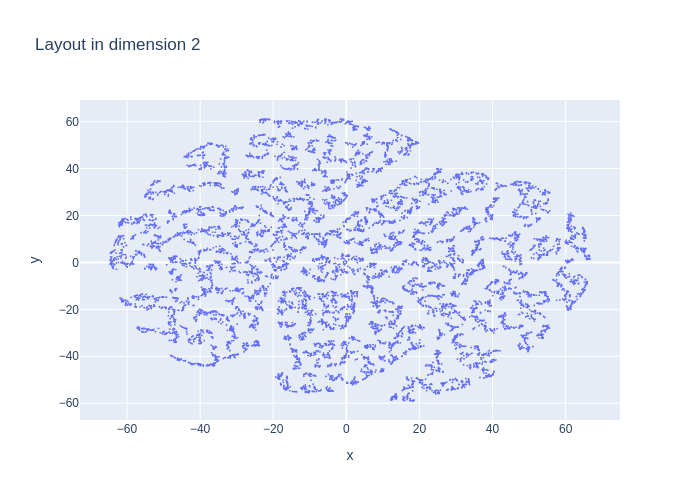

Computing persistence up to dimension 1 and global metrics
done


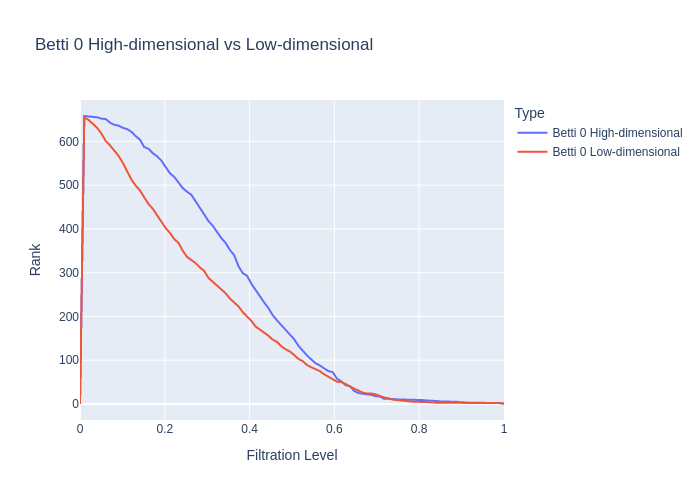

Distance `DTW` for dimension 0: 0.23752111661108857
Distance `TWED` for dimension 0: 0.21112528403909292
Distance `EMD` for dimension 0: 0.0008859002478508131
Distance `Wasserstein` for dimension 0: 0.4662946414700157
Distance `bottleneck` for dimension 0: 4.267846584320068


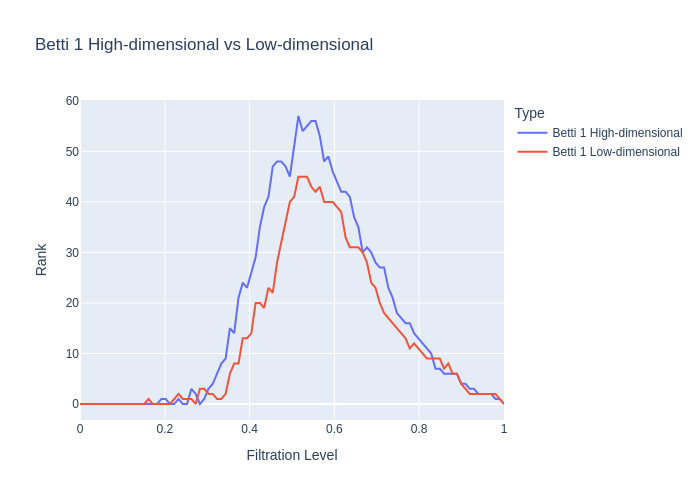

Distance `DTW` for dimension 1: 0.3014326303812759
Distance `TWED` for dimension 1: 0.05874582134796024
Distance `EMD` for dimension 1: 0.0040346774684664405
Distance `Wasserstein` for dimension 1: 0.04974062779114082
Distance `bottleneck` for dimension 1: 2.776587724685669
Computing kNN graphs and local metrics
done
Embedding stress (scaling adjusted): 0.011280476128225787
Neighborhood preservation score (mean, std): [0.17894655466079712, 0.1268131285905838]
Data has no labels: no context analysis performed


In [21]:
tred_disk = cTSNE(n_components=2,
                  method='fft',
                  perplexity=25,
                  n_neighbors=3*25+1)
#
viz_benchmark(tred_disk,
              features_disk,
              labels=labels_disk,
              dimension=1,
              subsample_threshold=0.25,
              rng_key=random.PRNGKey(42),
              point_size=2)

In [22]:
benchmark = run_benchmark(tred_disk,
                          features_disk,
                          labels=labels_disk,
                          dimension=1,
                          subsample_threshold=0.1,
                          rng_key=random.PRNGKey(42),
                          num_trials=1,
                          only_stats=True,)
#
#
#
benchmarks_disk['cuml-tsne'] =  {
    'Embedding time': benchmark['timing'][0],
    'Embedding stress': benchmark['stress'][0],
    'Neighborhood preservation score': benchmark['neighbor'][0][0],
    'Context preservation score (SVM)': 0.0, # not computed
    'Context preservation score (kNN)': 0.0, # not computed
    'Distance DTW for dimension 0': benchmark['dtw'][0][0],
    'Distance TWED for dimension 0': benchmark['twed'][0][0],
    'Distance EMD for dimension 0': benchmark['emd'][0][0],
    'Distance Wasserstein for dimension 0': benchmark['wass'][0][0],
    'Distance bottleneck for dimension 0': benchmark['bott'][0][0],
    'Distance DTW for dimension 1': benchmark['dtw'][0][1],
    'Distance TWED for dimension 1': benchmark['twed'][0][1],
    'Distance EMD for dimension 1': benchmark['emd'][0][1],
    'Distance Wasserstein for dimension 1': benchmark['wass'][0][1],
    'Distance bottleneck for dimension 1': benchmark['bott'][0][1],
    }

### CuML UMAP reducer

Embedding time: 0.6048 seconds


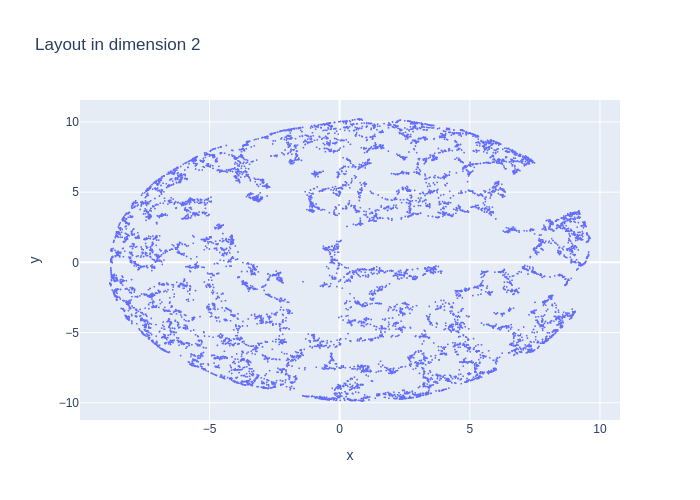

Computing persistence up to dimension 1 and global metrics
done


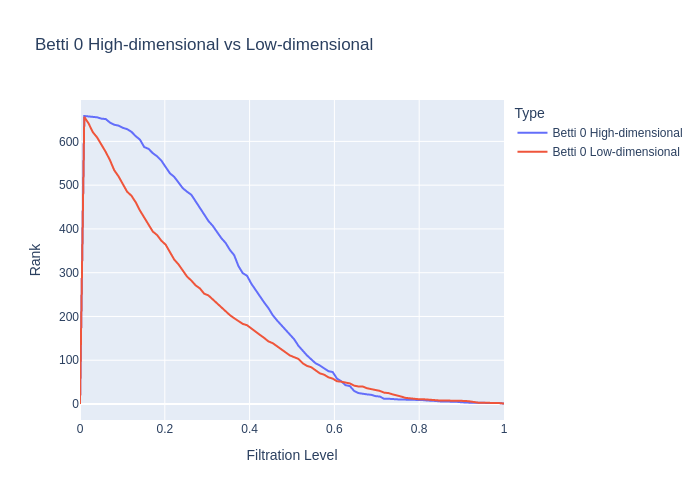

Distance `DTW` for dimension 0: 0.1361042801525657
Distance `TWED` for dimension 0: 0.23115695107307882
Distance `EMD` for dimension 0: 0.00013278295680661052
Distance `Wasserstein` for dimension 0: 0.06361817581986967
Distance `bottleneck` for dimension 0: 0.6324902176856995


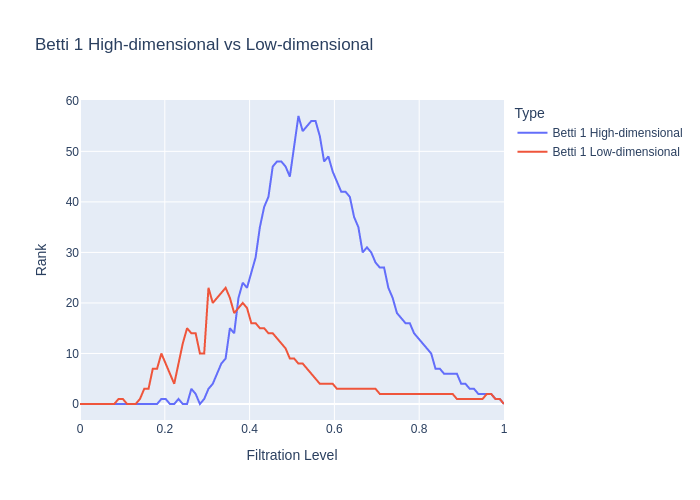

Distance `DTW` for dimension 1: 0.3232199468342015
Distance `TWED` for dimension 1: 0.09499422659669869
Distance `EMD` for dimension 1: 0.0017166667063101839
Distance `Wasserstein` for dimension 1: 0.007952296094725754
Distance `bottleneck` for dimension 1: 1.3585862517356873
Computing kNN graphs and local metrics
done
Embedding stress (scaling adjusted): 0.3286390053453385
Neighborhood preservation score (mean, std): [0.17974239587783813, 0.12336879223585129]
Data has no labels: no context analysis performed


In [23]:
cured_disk = cUMAP(n_components=reducer_disk.dimension,
                   n_neighbors=reducer_disk.n_neighbors,
                   min_dist=reducer_disk.min_dist,
                   spread=reducer_disk.spread)
#
viz_benchmark(cured_disk,
              features_disk,
              labels=labels_disk,
              dimension=1,
              subsample_threshold=0.25,
              rng_key=random.PRNGKey(42),
              point_size=2)

In [24]:
benchmark = run_benchmark(cured_disk,
                          features_disk,
                          labels=labels_disk,
                          dimension=1,
                          subsample_threshold=0.1,
                          rng_key=random.PRNGKey(42),
                          num_trials=1,
                          only_stats=True,)
#
#
#
benchmarks_disk['cuml-umap'] =  {
    'Embedding time': benchmark['timing'][0],
    'Embedding stress': benchmark['stress'][0],
    'Neighborhood preservation score': benchmark['neighbor'][0][0],
    'Context preservation score (SVM)': 0.0, # not computed
    'Context preservation score (kNN)': 0.0, # not computed
    'Distance DTW for dimension 0': benchmark['dtw'][0][0],
    'Distance TWED for dimension 0': benchmark['twed'][0][0],
    'Distance EMD for dimension 0': benchmark['emd'][0][0],
    'Distance Wasserstein for dimension 0': benchmark['wass'][0][0],
    'Distance bottleneck for dimension 0': benchmark['bott'][0][0],
    'Distance DTW for dimension 1': benchmark['dtw'][0][1],
    'Distance TWED for dimension 1': benchmark['twed'][0][1],
    'Distance EMD for dimension 1': benchmark['emd'][0][1],
    'Distance Wasserstein for dimension 1': benchmark['wass'][0][1],
    'Distance bottleneck for dimension 1': benchmark['bott'][0][1],
    }

### Original UMAP reducer

Embedding time: 38.2135 seconds


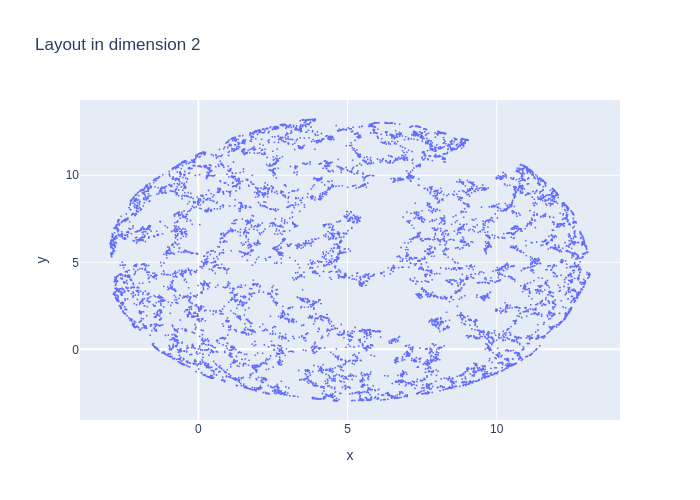

Computing persistence up to dimension 1 and global metrics
done


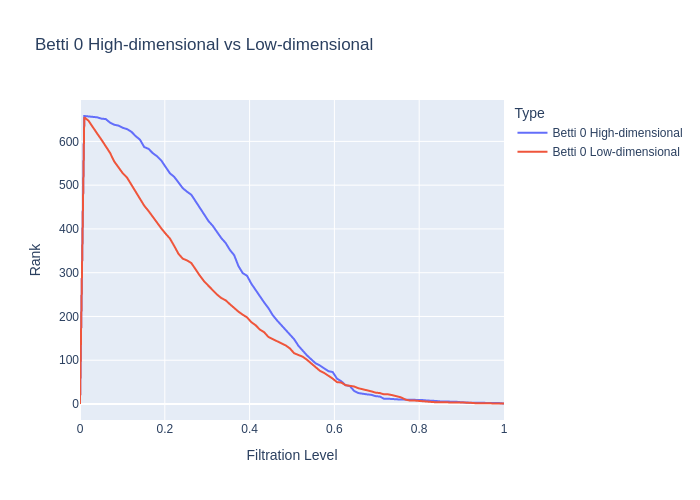

Distance `DTW` for dimension 0: 0.1316888319500488
Distance `TWED` for dimension 0: 0.2280398120212184
Distance `EMD` for dimension 0: 0.00010477138090768718
Distance `Wasserstein` for dimension 0: 0.05720576224209182
Distance `bottleneck` for dimension 0: 0.5399875044822693


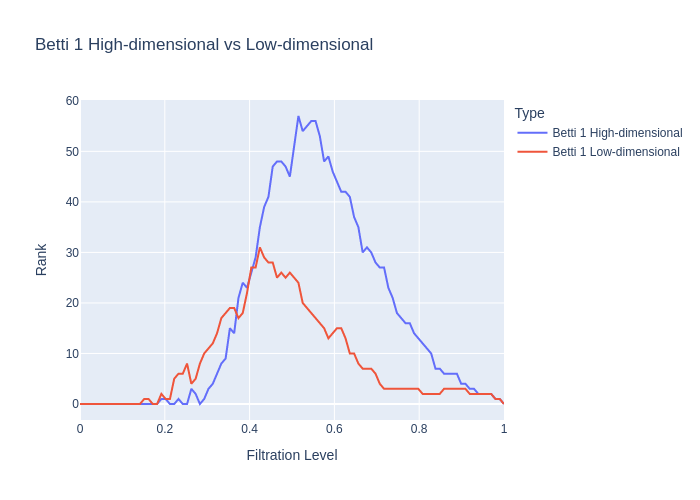

Distance `DTW` for dimension 1: 0.20697870823345954
Distance `TWED` for dimension 1: 0.08797929815745076
Distance `EMD` for dimension 1: 0.0008897960338150383
Distance `Wasserstein` for dimension 1: 0.00704162300344364
Distance `bottleneck` for dimension 1: 0.7867655158042908
Computing kNN graphs and local metrics
done
Embedding stress (scaling adjusted): 0.3713183192787845
Neighborhood preservation score (mean, std): [0.19451205432415009, 0.13272786140441895]
Data has no labels: no context analysis performed


In [25]:
red_disk = UMAP(n_components=reducer_disk.dimension,
                n_neighbors=reducer_disk.n_neighbors,
                min_dist=reducer_disk.min_dist,
                spread=reducer_disk.spread)
#
viz_benchmark(red_disk,
              features_disk,
              labels=labels_disk,
              dimension=1,
              subsample_threshold=0.25,
              rng_key=random.PRNGKey(42),
              point_size=2)

In [26]:
benchmark = run_benchmark(red_disk,
                          features_disk,
                          labels=labels_disk,
                          dimension=1,
                          subsample_threshold=0.1,
                          rng_key=random.PRNGKey(42),
                          num_trials=1,
                          only_stats=True,)
#
#
#
benchmarks_disk['umap'] =  {
    'Embedding time': benchmark['timing'][0],
    'Embedding stress': benchmark['stress'][0],
    'Neighborhood preservation score': benchmark['neighbor'][0][0],
    'Context preservation score (SVM)': 0.0, # not computed
    'Context preservation score (kNN)': 0.0, # not computed
    'Distance DTW for dimension 0': benchmark['dtw'][0][0],
    'Distance TWED for dimension 0': benchmark['twed'][0][0],
    'Distance EMD for dimension 0': benchmark['emd'][0][0],
    'Distance Wasserstein for dimension 0': benchmark['wass'][0][0],
    'Distance bottleneck for dimension 0': benchmark['bott'][0][0],
    'Distance DTW for dimension 1': benchmark['dtw'][0][1],
    'Distance TWED for dimension 1': benchmark['twed'][0][1],
    'Distance EMD for dimension 1': benchmark['emd'][0][1],
    'Distance Wasserstein for dimension 1': benchmark['wass'][0][1],
    'Distance bottleneck for dimension 1': benchmark['bott'][0][1],
    }

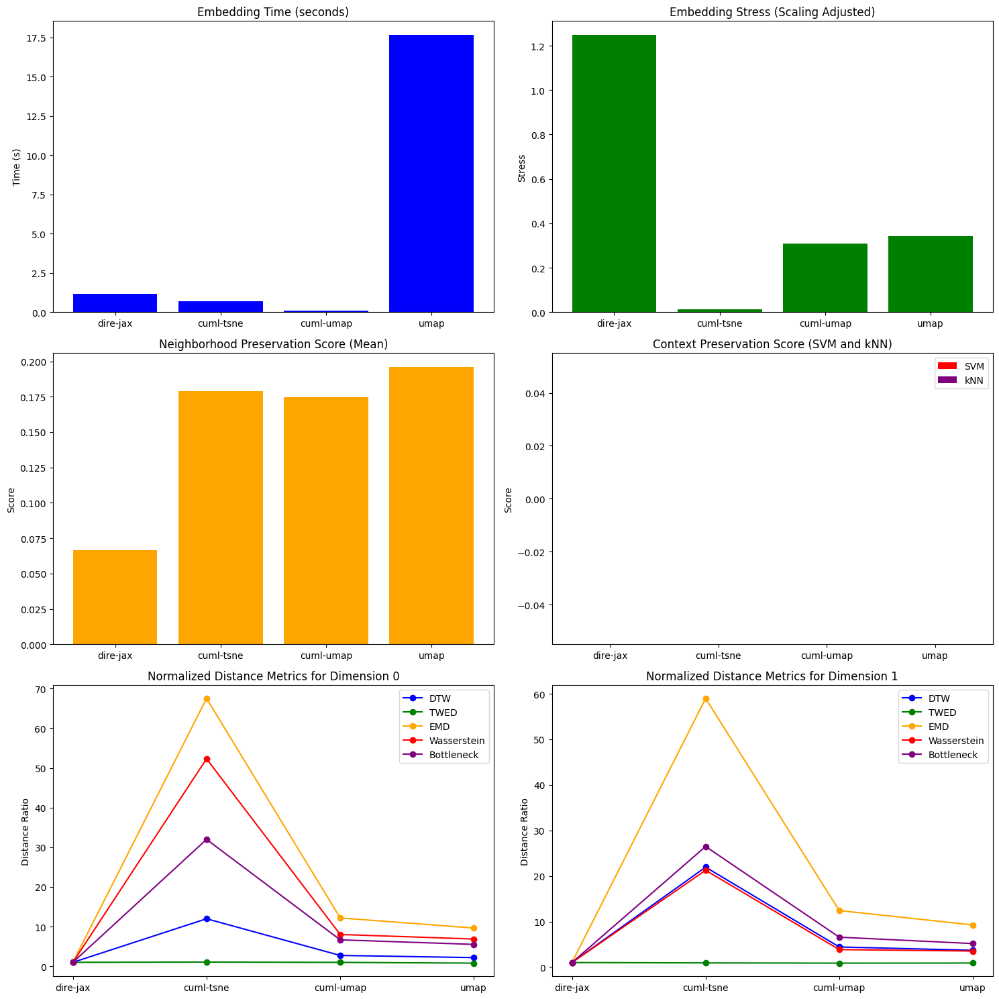

In [27]:
plot_algorithm_comparison(benchmarks_disk)

## Dataset "Sphere Uniform"

In [28]:
def rand_point_sphere(n, num=1):
  prepts = np.random.randn(num, n)
  prenorms = np.linalg.norm(prepts, axis=1).reshape(-1, 1)
  pts = prepts/prenorms
  return pts

In [29]:
features_sphere, labels_sphere = rand_point_sphere(3, 10000), None

### DiRe reducer

In [30]:
reducer_sphere = DiRe(dimension=3,
                      n_neighbors=64,
                      init_embedding_type='pca',
                      max_iter_layout=32,
                      min_dist=1e-4,
                      spread=2.0,
                      cutoff=2.0,
                      n_sample_dirs=8,
                      sample_size=32,
                      neg_ratio=8,
                      verbose=False,)

100%|██████████| 32/32 [00:02<00:00, 14.81it/s]


Embedding time: 3.0060 seconds


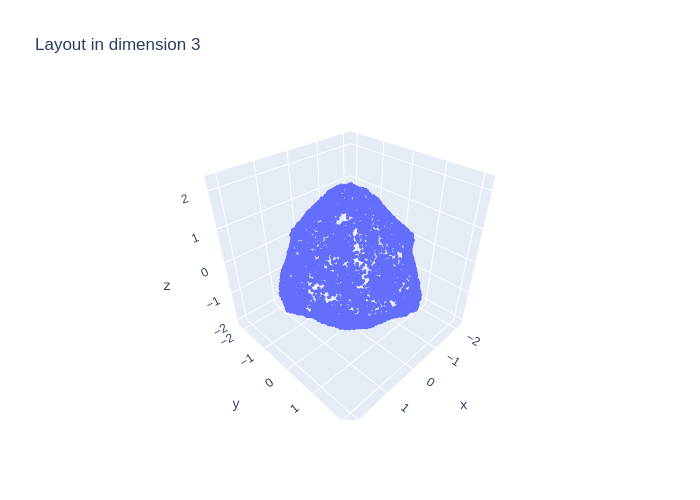

Computing persistence up to dimension 1 and global metrics
done


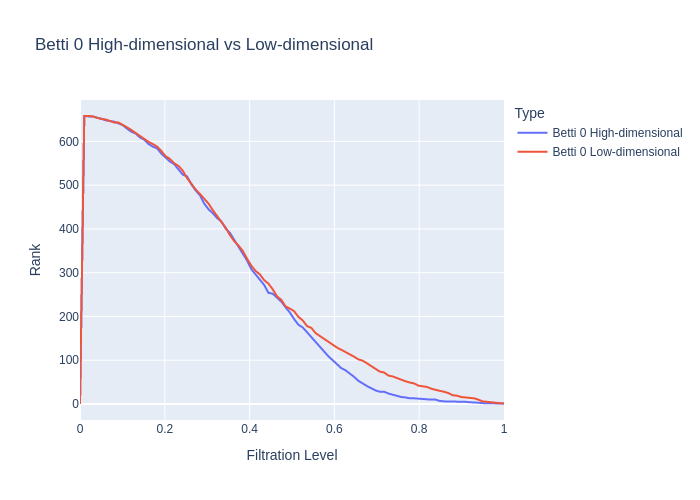

Distance `DTW` for dimension 0: 0.0985034142727423
Distance `TWED` for dimension 0: 0.19689143436892026
Distance `EMD` for dimension 0: 1.594730911865961e-05
Distance `Wasserstein` for dimension 0: 0.014144698950082664
Distance `bottleneck` for dimension 0: 0.1473546326160431


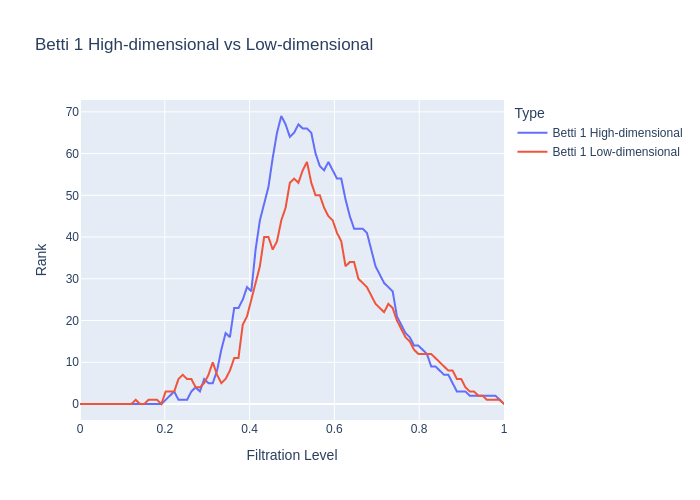

Distance `DTW` for dimension 1: 0.07020496312070516
Distance `TWED` for dimension 1: 0.08405508197235227
Distance `EMD` for dimension 1: 0.00010188512445106132
Distance `Wasserstein` for dimension 1: 0.005051739526064716
Distance `bottleneck` for dimension 1: 0.20445945858955383
Computing kNN graphs and local metrics
done
Embedding stress (scaling adjusted): 0.45222680216780065
Neighborhood preservation score (mean, std): [0.24412061274051666, 0.1499209702014923]
Data has no labels: no context analysis performed


In [31]:
viz_benchmark(reducer_sphere,
              features_sphere,
              labels=labels_sphere,
              subsample_threshold=0.25,
              rng_key=random.PRNGKey(42),
              point_size=2)

In [32]:
benchmarks_sphere = {}

In [33]:
benchmark = run_benchmark(reducer_sphere,
                          features_sphere,
                          labels=labels_sphere,
                          dimension=1,
                          subsample_threshold=0.1,
                          rng_key=random.PRNGKey(42),
                          num_trials=1,
                          only_stats=True,)
#
#
#
benchmarks_sphere['dire-jax'] =  {
    'Embedding time': benchmark['timing'][0],
    'Embedding stress': benchmark['stress'][0],
    'Neighborhood preservation score': benchmark['neighbor'][0][0],
    'Context preservation score (SVM)': 0.0, # not computed
    'Context preservation score (kNN)': 0.0, # not computed
    'Distance DTW for dimension 0': benchmark['dtw'][0][0],
    'Distance TWED for dimension 0': benchmark['twed'][0][0],
    'Distance EMD for dimension 0': benchmark['emd'][0][0],
    'Distance Wasserstein for dimension 0': benchmark['wass'][0][0],
    'Distance bottleneck for dimension 0': benchmark['bott'][0][0],
    'Distance DTW for dimension 1': benchmark['dtw'][0][1],
    'Distance TWED for dimension 1': benchmark['twed'][0][1],
    'Distance EMD for dimension 1': benchmark['emd'][0][1],
    'Distance Wasserstein for dimension 1': benchmark['wass'][0][1],
    'Distance bottleneck for dimension 1': benchmark['bott'][0][1],
    }

100%|██████████| 32/32 [00:00<00:00, 34.46it/s]


### CuML tSNE reducer

Embedding time: 0.6362 seconds


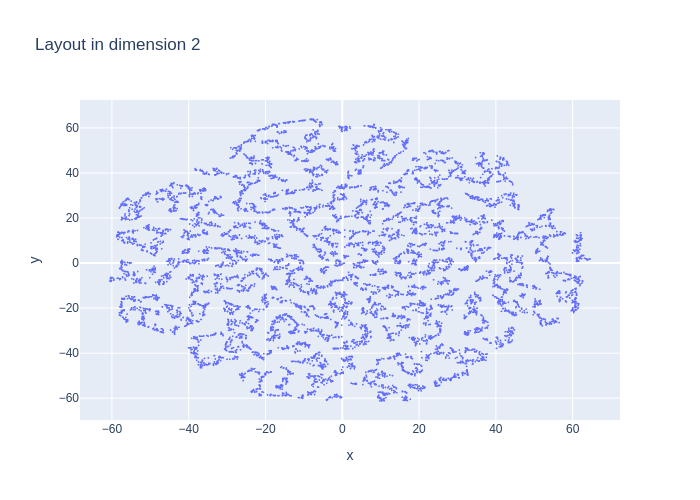

Computing persistence up to dimension 1 and global metrics
done


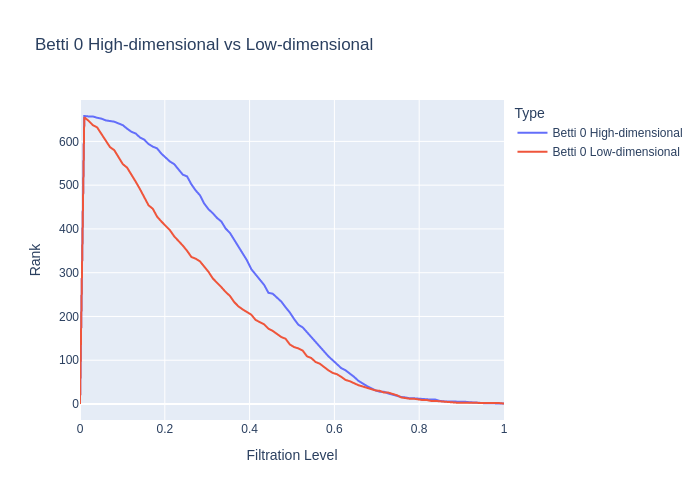

Distance `DTW` for dimension 0: 0.22655874708828116
Distance `TWED` for dimension 0: 0.21343086925462063
Distance `EMD` for dimension 0: 0.000927984648691053
Distance `Wasserstein` for dimension 0: 0.47439968356966816
Distance `bottleneck` for dimension 0: 4.134867191314697


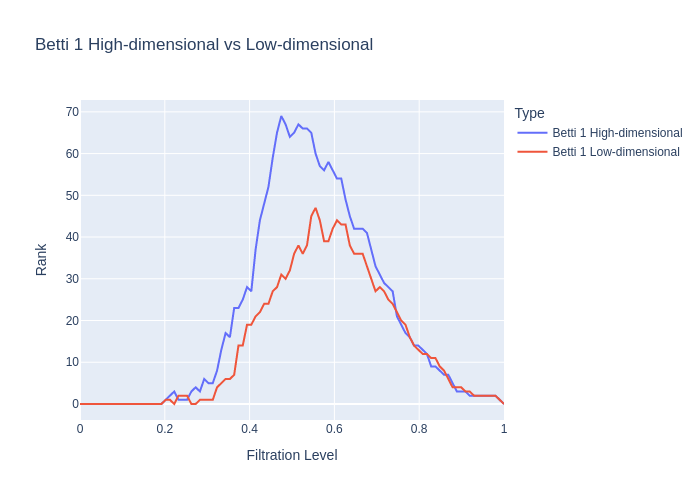

Distance `DTW` for dimension 1: 0.36757335838256233
Distance `TWED` for dimension 1: 0.0820503027058761
Distance `EMD` for dimension 1: 0.004455439358147111
Distance `Wasserstein` for dimension 1: 0.05551494238896879
Distance `bottleneck` for dimension 1: 3.29160213470459
Computing kNN graphs and local metrics
done
Embedding stress (scaling adjusted): 0.024399937382876696
Neighborhood preservation score (mean, std): [0.14286671578884125, 0.10892396420240402]
Data has no labels: no context analysis performed


In [34]:
tred_sphere = cTSNE(n_components=2,
                    method='fft',
                    perplexity=25,
                    n_neighbors=3*25+1)
#
viz_benchmark(tred_sphere,
              features_sphere,
              labels=labels_sphere,
              subsample_threshold=0.25,
              rng_key=random.PRNGKey(42),
              point_size=2)

In [35]:
benchmark = run_benchmark(tred_sphere,
                          features_sphere,
                          labels=labels_sphere,
                          dimension=1,
                          subsample_threshold=0.1,
                          rng_key=random.PRNGKey(42),
                          num_trials=1,
                          only_stats=True,)
#
#
#
benchmarks_sphere['cuml-tsne'] =  {
    'Embedding time': benchmark['timing'][0],
    'Embedding stress': benchmark['stress'][0],
    'Neighborhood preservation score': benchmark['neighbor'][0][0],
    'Context preservation score (SVM)': 0.0, # not computed
    'Context preservation score (kNN)': 0.0, # not computed
    'Distance DTW for dimension 0': benchmark['dtw'][0][0],
    'Distance TWED for dimension 0': benchmark['twed'][0][0],
    'Distance EMD for dimension 0': benchmark['emd'][0][0],
    'Distance Wasserstein for dimension 0': benchmark['wass'][0][0],
    'Distance bottleneck for dimension 0': benchmark['bott'][0][0],
    'Distance DTW for dimension 1': benchmark['dtw'][0][1],
    'Distance TWED for dimension 1': benchmark['twed'][0][1],
    'Distance EMD for dimension 1': benchmark['emd'][0][1],
    'Distance Wasserstein for dimension 1': benchmark['wass'][0][1],
    'Distance bottleneck for dimension 1': benchmark['bott'][0][1],
    }

### CuML UMAP reducer

Embedding time: 0.1392 seconds


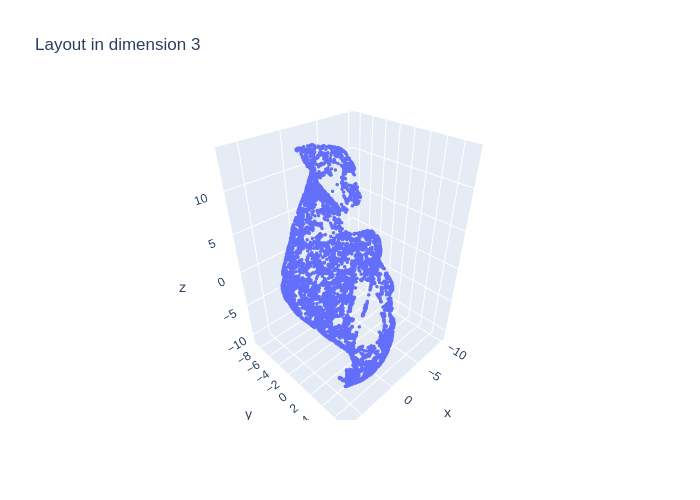

Computing persistence up to dimension 1 and global metrics
done


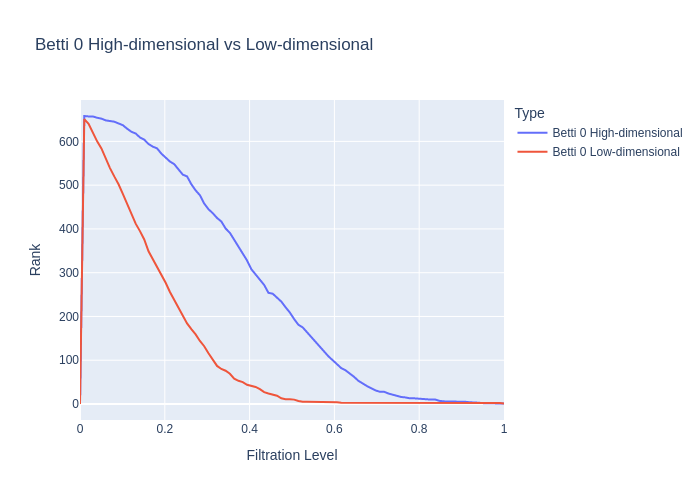

Distance `DTW` for dimension 0: 0.16076062353954948
Distance `TWED` for dimension 0: 0.2202773513497082
Distance `EMD` for dimension 0: 0.00030887510457875013
Distance `Wasserstein` for dimension 0: 0.10426107727529167
Distance `bottleneck` for dimension 0: 1.5030416250228882


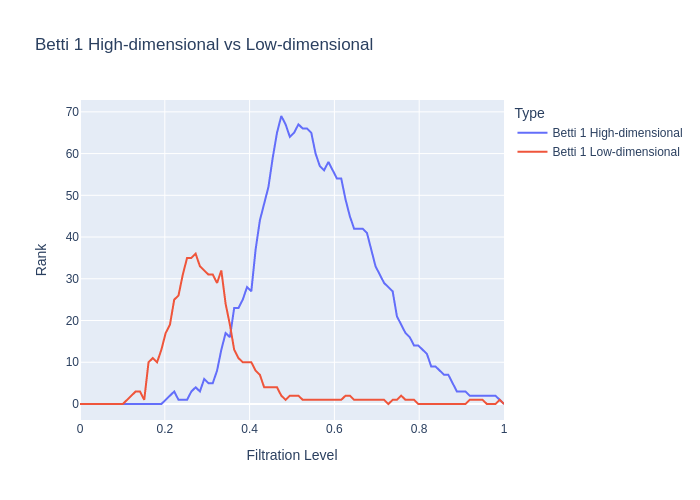

Distance `DTW` for dimension 1: 0.3351435631544172
Distance `TWED` for dimension 1: 0.10589191125060798
Distance `EMD` for dimension 1: 0.002255076805319995
Distance `Wasserstein` for dimension 1: 0.013830127770100946
Distance `bottleneck` for dimension 1: 1.0160059928894043
Computing kNN graphs and local metrics
done
Embedding stress (scaling adjusted): 0.16406951992261196
Neighborhood preservation score (mean, std): [0.2033330798149109, 0.13932828605175018]
Data has no labels: no context analysis performed


In [36]:
cured_sphere = cUMAP(n_components=reducer_sphere.dimension,
                     n_neighbors=reducer_sphere.n_neighbors,
                     min_dist=reducer_sphere.min_dist,
                     spread=reducer_sphere.spread)
#
viz_benchmark(cured_sphere,
              features_sphere,
              labels=labels_sphere,
              subsample_threshold=0.25,
              rng_key=random.PRNGKey(42),
              point_size=2)

In [37]:
benchmark = run_benchmark(cured_sphere,
                          features_sphere,
                          labels=labels_sphere,
                          dimension=1,
                          subsample_threshold=0.1,
                          rng_key=random.PRNGKey(42),
                          num_trials=1,
                          only_stats=True,)
#
#
#
benchmarks_sphere['cuml-umap'] =  {
    'Embedding time': benchmark['timing'][0],
    'Embedding stress': benchmark['stress'][0],
    'Neighborhood preservation score': benchmark['neighbor'][0][0],
    'Context preservation score (SVM)': 0.0, # not computed
    'Context preservation score (kNN)': 0.0, # not computed
    'Distance DTW for dimension 0': benchmark['dtw'][0][0],
    'Distance TWED for dimension 0': benchmark['twed'][0][0],
    'Distance EMD for dimension 0': benchmark['emd'][0][0],
    'Distance Wasserstein for dimension 0': benchmark['wass'][0][0],
    'Distance bottleneck for dimension 0': benchmark['bott'][0][0],
    'Distance DTW for dimension 1': benchmark['dtw'][0][1],
    'Distance TWED for dimension 1': benchmark['twed'][0][1],
    'Distance EMD for dimension 1': benchmark['emd'][0][1],
    'Distance Wasserstein for dimension 1': benchmark['wass'][0][1],
    'Distance bottleneck for dimension 1': benchmark['bott'][0][1],
    }

### Original UMAP reducer

Embedding time: 18.3836 seconds


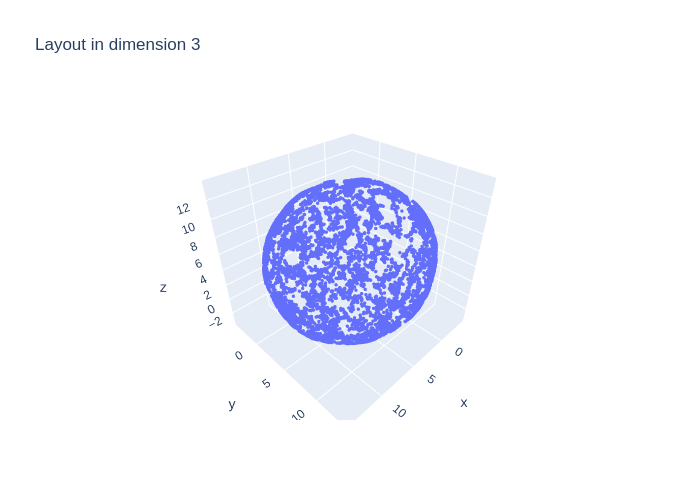

Computing persistence up to dimension 1 and global metrics
done


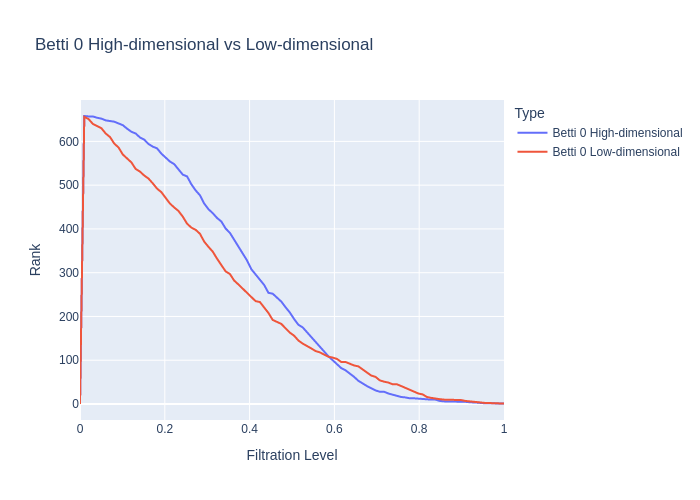

Distance `DTW` for dimension 0: 0.11119559735361667
Distance `TWED` for dimension 0: 0.17748006976532102
Distance `EMD` for dimension 0: 0.0001847280942997356
Distance `Wasserstein` for dimension 0: 0.12404675967552878
Distance `bottleneck` for dimension 0: 0.9464563131332397


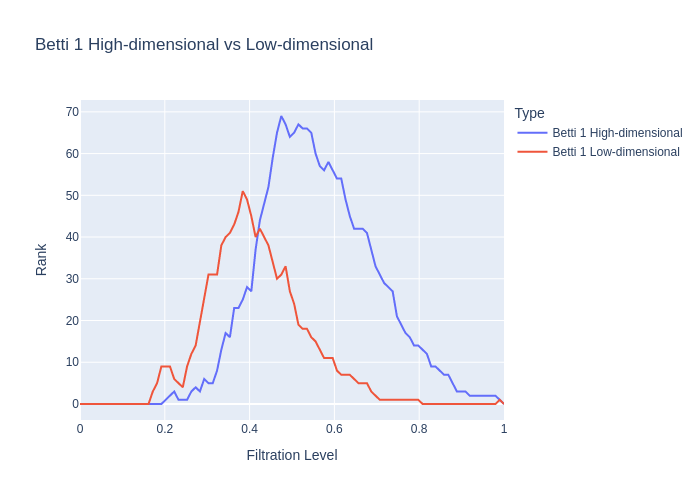

Distance `DTW` for dimension 1: 0.18769113975836738
Distance `TWED` for dimension 1: 0.0895648822710208
Distance `EMD` for dimension 1: 0.0014863482423792807
Distance `Wasserstein` for dimension 1: 0.01940672534353256
Distance `bottleneck` for dimension 1: 1.3205459713935852
Computing kNN graphs and local metrics
done
Embedding stress (scaling adjusted): 0.10011616440338128
Neighborhood preservation score (mean, std): [0.21776679158210754, 0.14551681280136108]
Data has no labels: no context analysis performed


In [38]:
red_sphere = UMAP(n_components=reducer_sphere.dimension,
                  n_neighbors=reducer_sphere.n_neighbors,
                  min_dist=reducer_sphere.min_dist,
                  spread=reducer_sphere.spread)
#
viz_benchmark(red_sphere,
              features_sphere,
              labels=labels_sphere,
              subsample_threshold=0.25,
              rng_key=random.PRNGKey(42),
              point_size=2)

In [39]:
benchmark = run_benchmark(red_sphere,
                          features_sphere,
                          labels=labels_sphere,
                          dimension=1,
                          subsample_threshold=0.1,
                          rng_key=random.PRNGKey(42),
                          num_trials=1,
                          only_stats=True,)
#
#
#
benchmarks_sphere['umap'] =  {
    'Embedding time': benchmark['timing'][0],
    'Embedding stress': benchmark['stress'][0],
    'Neighborhood preservation score': benchmark['neighbor'][0][0],
    'Context preservation score (SVM)': 0.0, # not computed
    'Context preservation score (kNN)': 0.0, # not computed
    'Distance DTW for dimension 0': benchmark['dtw'][0][0],
    'Distance TWED for dimension 0': benchmark['twed'][0][0],
    'Distance EMD for dimension 0': benchmark['emd'][0][0],
    'Distance Wasserstein for dimension 0': benchmark['wass'][0][0],
    'Distance bottleneck for dimension 0': benchmark['bott'][0][0],
    'Distance DTW for dimension 1': benchmark['dtw'][0][1],
    'Distance TWED for dimension 1': benchmark['twed'][0][1],
    'Distance EMD for dimension 1': benchmark['emd'][0][1],
    'Distance Wasserstein for dimension 1': benchmark['wass'][0][1],
    'Distance bottleneck for dimension 1': benchmark['bott'][0][1],
    }

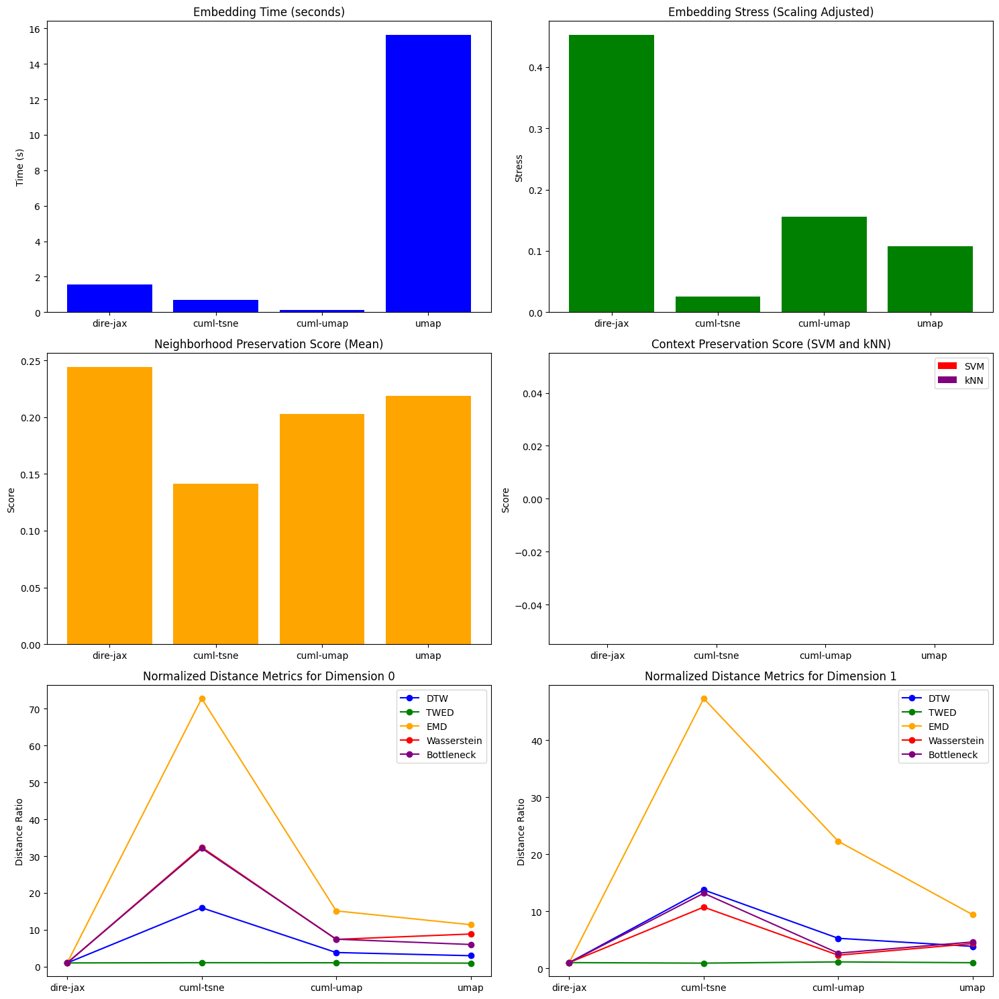

In [40]:
plot_algorithm_comparison(benchmarks_sphere)

## Dataset "Ellipsoid Uniform"

In [41]:
class elgen:
  def __init__(self, a):
    a = np.array(a)
    themat = np.diag(1/(a * a))
    L = np.linalg.inv(np.linalg.cholesky(themat).T)
    self.L = L

  def __call__(self, ar):
    return (self.L @ ar.T).T

def rand_point_ell(a, n, num=1):
  spts = rand_point_sphere(n, num)
  eg = elgen(a)
  return eg(spts)

In [42]:
features_ell, labels_ell = rand_point_ell([1,2,4], 3, 10000), None

### DiRe reducer

In [43]:
reducer_ell = DiRe(dimension=3,
                   n_neighbors=64,
                   init_embedding_type='pca',
                   max_iter_layout=64,
                   min_dist=1e-4,
                   spread=1.0,
                   cutoff=4.0,
                   n_sample_dirs=8,
                   sample_size=32,
                   neg_ratio=8,
                   verbose=False,)

100%|██████████| 64/64 [00:02<00:00, 31.65it/s]


Embedding time: 2.6890 seconds


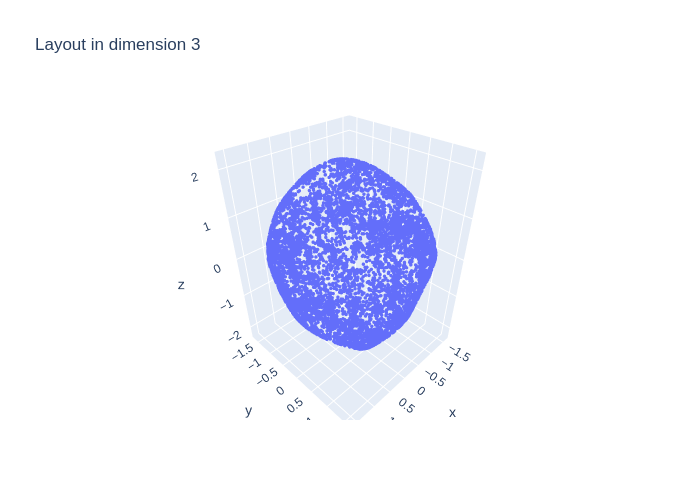

Computing persistence up to dimension 1 and global metrics
done


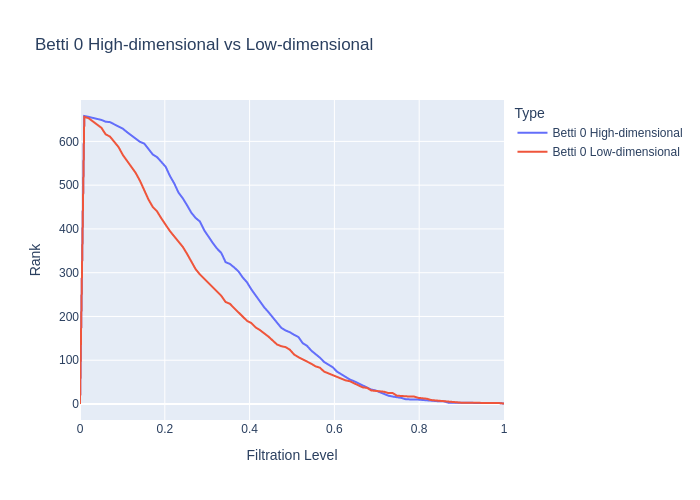

Distance `DTW` for dimension 0: 0.08535665723748696
Distance `TWED` for dimension 0: 0.17432286600194555
Distance `EMD` for dimension 0: 1.1879394822261818e-05
Distance `Wasserstein` for dimension 0: 0.013865336092119812
Distance `bottleneck` for dimension 0: 0.09727278351783752


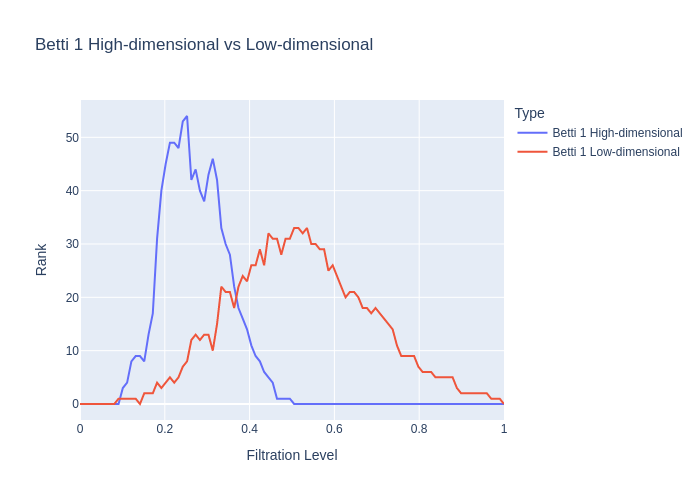

Distance `DTW` for dimension 1: 0.12197024843489289
Distance `TWED` for dimension 1: 0.11362133694066148
Distance `EMD` for dimension 1: 2.406273216477715e-05
Distance `Wasserstein` for dimension 1: 0.002787729549705058
Distance `bottleneck` for dimension 1: 0.12296468019485474
Computing kNN graphs and local metrics
done
Embedding stress (scaling adjusted): 1.2186685680144427
Neighborhood preservation score (mean, std): [0.1783827841281891, 0.12079043686389923]
Data has no labels: no context analysis performed


In [44]:
viz_benchmark(reducer_ell,
              features_ell,
              labels=labels_ell,
              subsample_threshold=0.25,
              rng_key=random.PRNGKey(42),
              point_size=2)

In [45]:
benchmarks_ell = {}

In [46]:
benchmark = run_benchmark(reducer_ell,
                          features_ell,
                          labels=labels_ell,
                          dimension=1,
                          subsample_threshold=0.1,
                          rng_key=random.PRNGKey(42),
                          num_trials=1,
                          only_stats=True,)
#
#
#
benchmarks_ell['dire-jax'] =  {
    'Embedding time': benchmark['timing'][0],
    'Embedding stress': benchmark['stress'][0],
    'Neighborhood preservation score': benchmark['neighbor'][0][0],
    'Context preservation score (SVM)': 0.0, # not computed
    'Context preservation score (kNN)': 0.0, # not computed
    'Distance DTW for dimension 0': benchmark['dtw'][0][0],
    'Distance TWED for dimension 0': benchmark['twed'][0][0],
    'Distance EMD for dimension 0': benchmark['emd'][0][0],
    'Distance Wasserstein for dimension 0': benchmark['wass'][0][0],
    'Distance bottleneck for dimension 0': benchmark['bott'][0][0],
    'Distance DTW for dimension 1': benchmark['dtw'][0][1],
    'Distance TWED for dimension 1': benchmark['twed'][0][1],
    'Distance EMD for dimension 1': benchmark['emd'][0][1],
    'Distance Wasserstein for dimension 1': benchmark['wass'][0][1],
    'Distance bottleneck for dimension 1': benchmark['bott'][0][1],
    }

100%|██████████| 64/64 [00:01<00:00, 35.10it/s]


### CuML tSNE reducer

Embedding time: 0.7758 seconds


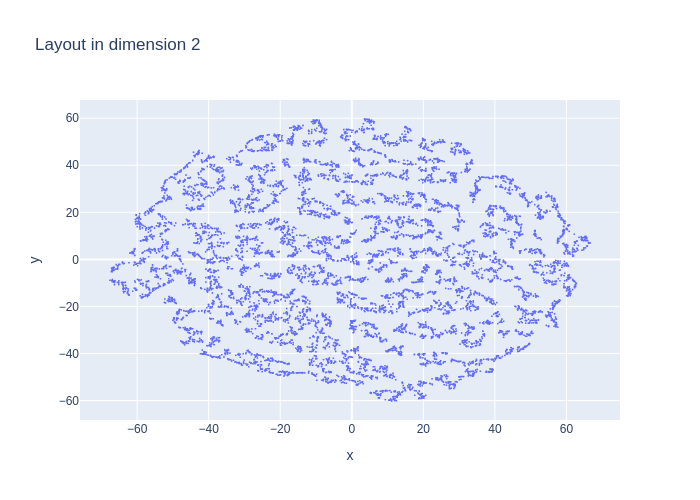

Computing persistence up to dimension 1 and global metrics
done


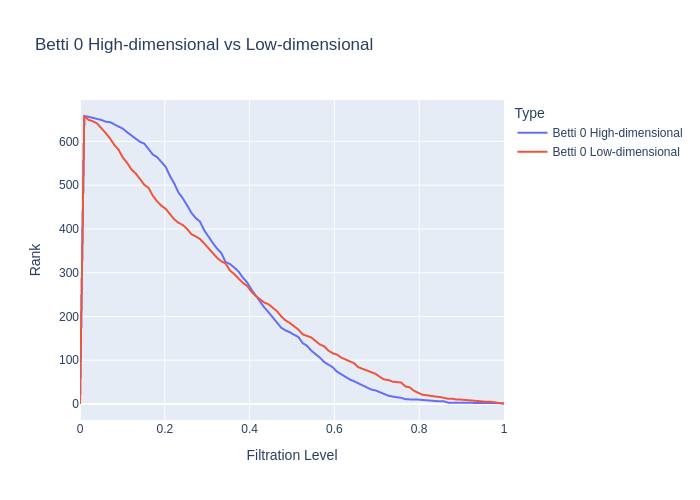

Distance `DTW` for dimension 0: 0.21801813534173306
Distance `TWED` for dimension 0: 0.21108191820434097
Distance `EMD` for dimension 0: 0.0006641795957182264
Distance `Wasserstein` for dimension 0: 0.4592025289461029
Distance `bottleneck` for dimension 0: 3.4588234424591064


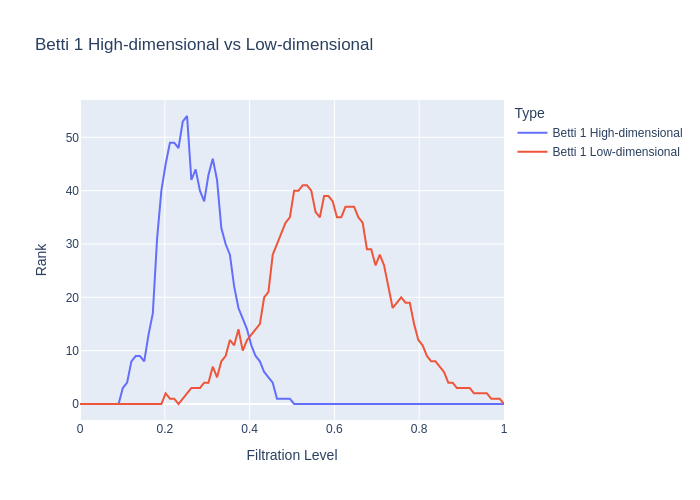

Distance `DTW` for dimension 1: 0.436629206181074
Distance `TWED` for dimension 1: 0.10215205923592535
Distance `EMD` for dimension 1: 0.004254860661455014
Distance `Wasserstein` for dimension 1: 0.05745911376199069
Distance `bottleneck` for dimension 1: 3.9679248332977295
Computing kNN graphs and local metrics
done
Embedding stress (scaling adjusted): 0.057229115934319036
Neighborhood preservation score (mean, std): [0.16051112115383148, 0.12053929269313812]
Data has no labels: no context analysis performed


In [47]:
tred_ell = cTSNE(n_components=2,
                 method='fft',
                 perplexity=25,
                 n_neighbors=3*25+1)
#
viz_benchmark(tred_ell,
              features_ell,
              labels=labels_ell,
              subsample_threshold=0.25,
              rng_key=random.PRNGKey(42),
              point_size=2)

In [48]:
benchmark = run_benchmark(tred_ell,
                          features_ell,
                          labels=labels_ell,
                          dimension=1,
                          subsample_threshold=0.1,
                          rng_key=random.PRNGKey(42),
                          num_trials=1,
                          only_stats=True,)
#
#
#
benchmarks_ell['cuml-tsne'] =  {
    'Embedding time': benchmark['timing'][0],
    'Embedding stress': benchmark['stress'][0],
    'Neighborhood preservation score': benchmark['neighbor'][0][0],
    'Context preservation score (SVM)': 0.0, # not computed
    'Context preservation score (kNN)': 0.0, # not computed
    'Distance DTW for dimension 0': benchmark['dtw'][0][0],
    'Distance TWED for dimension 0': benchmark['twed'][0][0],
    'Distance EMD for dimension 0': benchmark['emd'][0][0],
    'Distance Wasserstein for dimension 0': benchmark['wass'][0][0],
    'Distance bottleneck for dimension 0': benchmark['bott'][0][0],
    'Distance DTW for dimension 1': benchmark['dtw'][0][1],
    'Distance TWED for dimension 1': benchmark['twed'][0][1],
    'Distance EMD for dimension 1': benchmark['emd'][0][1],
    'Distance Wasserstein for dimension 1': benchmark['wass'][0][1],
    'Distance bottleneck for dimension 1': benchmark['bott'][0][1],
    }

### CuML UMAP reducer

Embedding time: 0.1414 seconds


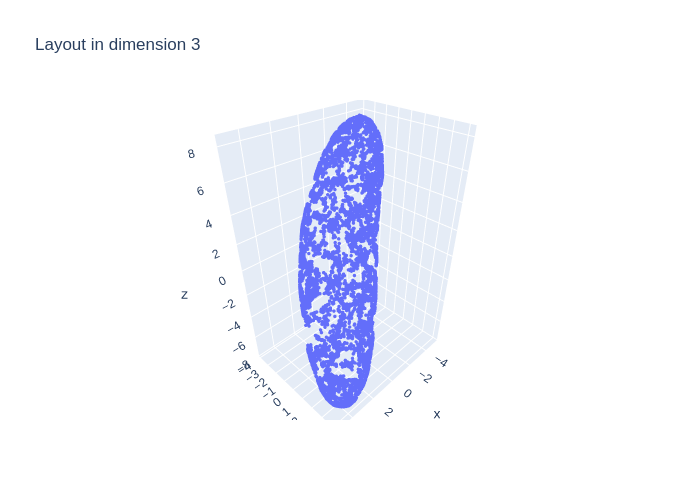

Computing persistence up to dimension 1 and global metrics
done


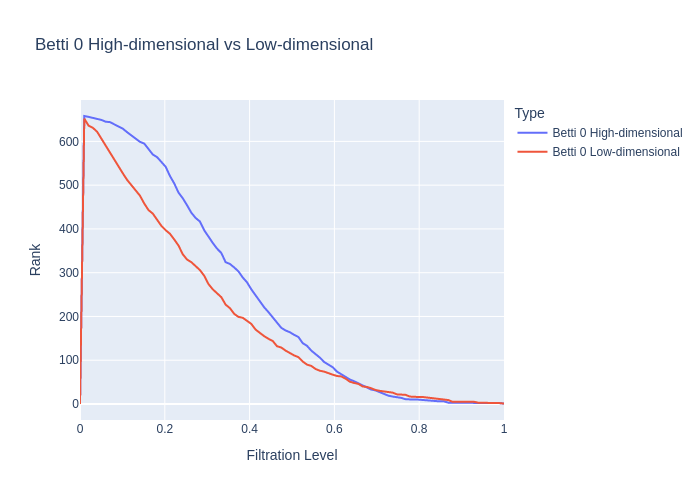

Distance `DTW` for dimension 0: 0.11866232472816732
Distance `TWED` for dimension 0: 0.2194690511384363
Distance `EMD` for dimension 0: 6.116167095090892e-05
Distance `Wasserstein` for dimension 0: 0.03370263597422577
Distance `bottleneck` for dimension 0: 0.5519339442253113


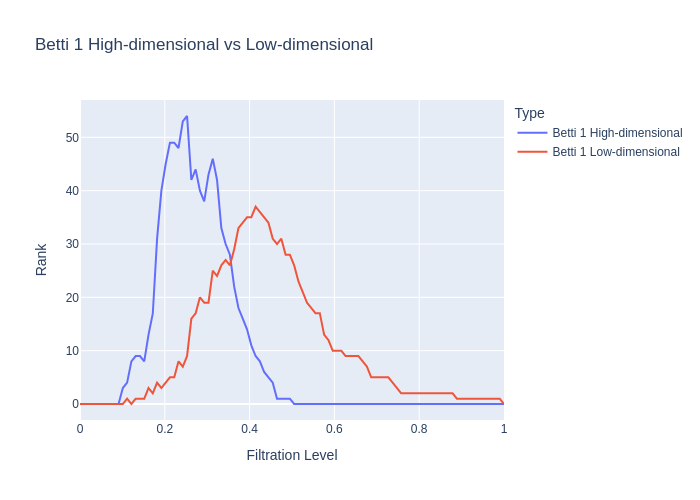

Distance `DTW` for dimension 1: 0.11521528479468578
Distance `TWED` for dimension 1: 0.10429865618160264
Distance `EMD` for dimension 1: 0.00031265564236953463
Distance `Wasserstein` for dimension 1: 0.011567477443554222
Distance `bottleneck` for dimension 1: 0.8889982104301453
Computing kNN graphs and local metrics
done
Embedding stress (scaling adjusted): 0.9602779439081073
Neighborhood preservation score (mean, std): [0.2070622593164444, 0.14208127558231354]
Data has no labels: no context analysis performed


In [49]:
cured_ell = cUMAP(n_components=reducer_ell.dimension,
                  n_neighbors=reducer_ell.n_neighbors,
                  min_dist=reducer_ell.min_dist,
                  spread=reducer_ell.spread)
#
viz_benchmark(cured_ell,
              features_ell,
              labels=labels_ell,
              subsample_threshold=0.25,
              rng_key=random.PRNGKey(42),
              point_size=2)

In [50]:
benchmark = run_benchmark(cured_ell,
                          features_ell,
                          labels=labels_ell,
                          dimension=1,
                          subsample_threshold=0.1,
                          rng_key=random.PRNGKey(42),
                          num_trials=1,
                          only_stats=True,)
#
#
#
benchmarks_ell['cuml-umap'] =  {
    'Embedding time': benchmark['timing'][0],
    'Embedding stress': benchmark['stress'][0],
    'Neighborhood preservation score': benchmark['neighbor'][0][0],
    'Context preservation score (SVM)': 0.0, # not computed
    'Context preservation score (kNN)': 0.0, # not computed
    'Distance DTW for dimension 0': benchmark['dtw'][0][0],
    'Distance TWED for dimension 0': benchmark['twed'][0][0],
    'Distance EMD for dimension 0': benchmark['emd'][0][0],
    'Distance Wasserstein for dimension 0': benchmark['wass'][0][0],
    'Distance bottleneck for dimension 0': benchmark['bott'][0][0],
    'Distance DTW for dimension 1': benchmark['dtw'][0][1],
    'Distance TWED for dimension 1': benchmark['twed'][0][1],
    'Distance EMD for dimension 1': benchmark['emd'][0][1],
    'Distance Wasserstein for dimension 1': benchmark['wass'][0][1],
    'Distance bottleneck for dimension 1': benchmark['bott'][0][1],
    }

### Original UMAP reducer

Embedding time: 17.2923 seconds


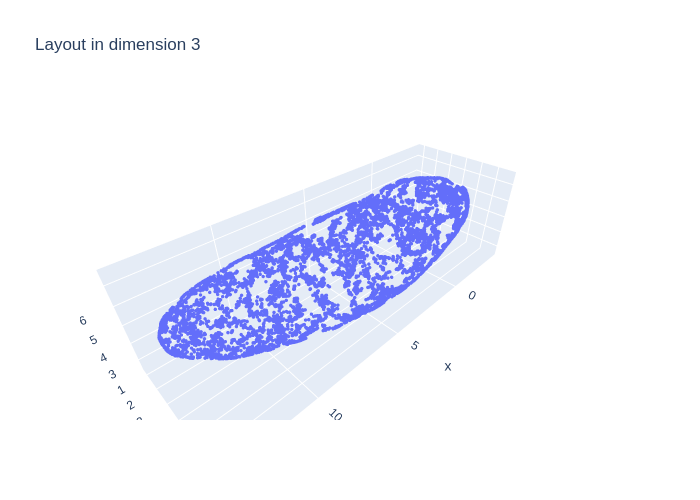

Computing persistence up to dimension 1 and global metrics
done


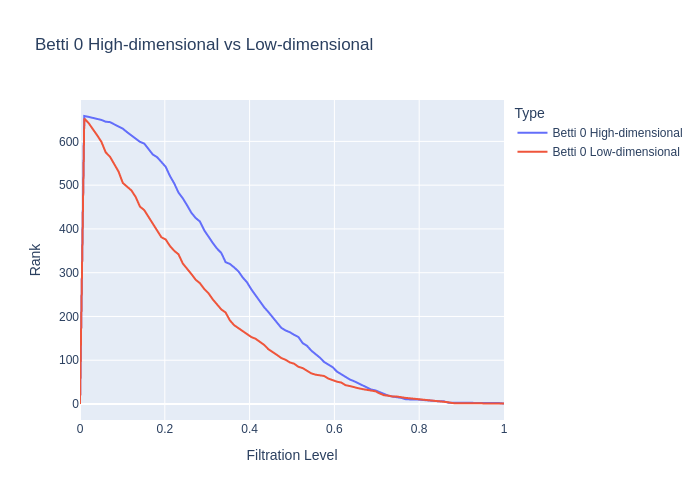

Distance `DTW` for dimension 0: 0.11234535216151961
Distance `TWED` for dimension 0: 0.2179119659305083
Distance `EMD` for dimension 0: 6.435167196966749e-05
Distance `Wasserstein` for dimension 0: 0.03187734094644912
Distance `bottleneck` for dimension 0: 0.5777047276496887


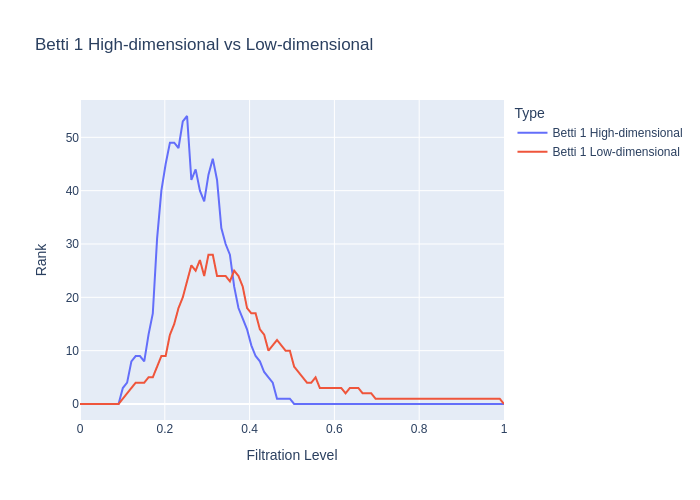

Distance `DTW` for dimension 1: 0.16426252433570337
Distance `TWED` for dimension 1: 0.10507624882204523
Distance `EMD` for dimension 1: 0.00041688071609453995
Distance `Wasserstein` for dimension 1: 0.010580177312062695
Distance `bottleneck` for dimension 1: 1.2739603519439697
Computing kNN graphs and local metrics
done
Embedding stress (scaling adjusted): 1.0436875607707938
Neighborhood preservation score (mean, std): [0.20476706326007843, 0.13968361914157867]
Data has no labels: no context analysis performed


In [51]:
red_ell = UMAP(n_components=reducer_ell.dimension,
               n_neighbors=reducer_ell.n_neighbors,
               min_dist=reducer_ell.min_dist,
               spread=reducer_ell.spread)
#
viz_benchmark(red_ell,
              features_ell,
              labels=labels_ell,
              subsample_threshold=0.25,
              rng_key=random.PRNGKey(42),
              point_size=2)

In [52]:
benchmark = run_benchmark(red_ell,
                          features_ell,
                          labels=labels_ell,
                          dimension=1,
                          subsample_threshold=0.1,
                          rng_key=random.PRNGKey(42),
                          num_trials=1,
                          only_stats=True,)
#
#
#
benchmarks_ell['umap'] =  {
    'Embedding time': benchmark['timing'][0],
    'Embedding stress': benchmark['stress'][0],
    'Neighborhood preservation score': benchmark['neighbor'][0][0],
    'Context preservation score (SVM)': 0.0, # not computed
    'Context preservation score (kNN)': 0.0, # not computed
    'Distance DTW for dimension 0': benchmark['dtw'][0][0],
    'Distance TWED for dimension 0': benchmark['twed'][0][0],
    'Distance EMD for dimension 0': benchmark['emd'][0][0],
    'Distance Wasserstein for dimension 0': benchmark['wass'][0][0],
    'Distance bottleneck for dimension 0': benchmark['bott'][0][0],
    'Distance DTW for dimension 1': benchmark['dtw'][0][1],
    'Distance TWED for dimension 1': benchmark['twed'][0][1],
    'Distance EMD for dimension 1': benchmark['emd'][0][1],
    'Distance Wasserstein for dimension 1': benchmark['wass'][0][1],
    'Distance bottleneck for dimension 1': benchmark['bott'][0][1],
    }

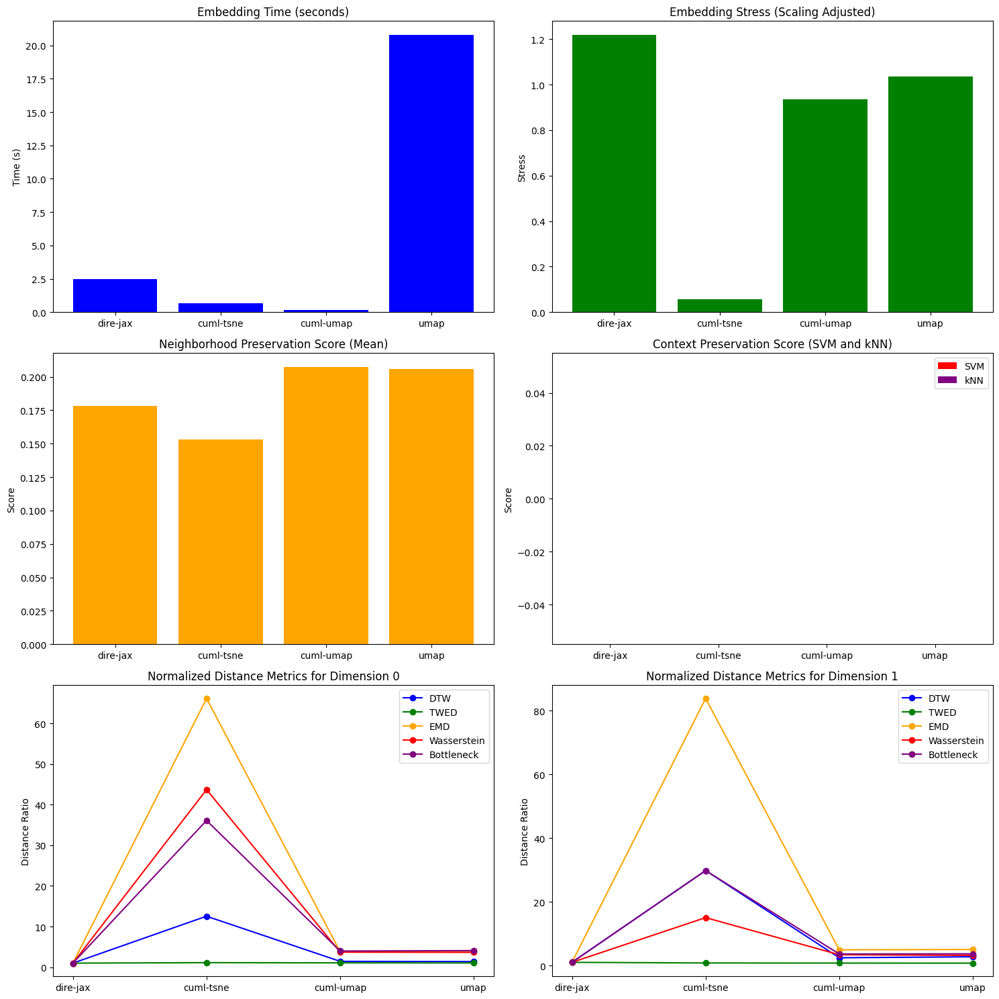

In [53]:
plot_algorithm_comparison(benchmarks_ell)

## Dataset "Two half-moons"

In [54]:
from sklearn.datasets import make_moons
#
# Generate some sample data
#
n_samples  = 10_000
features_moons, labels_moons = make_moons(n_samples=n_samples, noise=0.005, random_state=42)

### DiRe reducer

In [55]:
reducer_moons = DiRe(dimension=2,
                     n_neighbors=64,
                     init_embedding_type='pca',
                     max_iter_layout=128,
                     min_dist=1e-4,
                     spread=1.0,
                     cutoff=8.0,
                     n_sample_dirs=16,
                     sample_size=16,
                     neg_ratio=16,
                     verbose=False,)

100%|██████████| 128/128 [00:07<00:00, 17.85it/s]


Embedding time: 7.8431 seconds


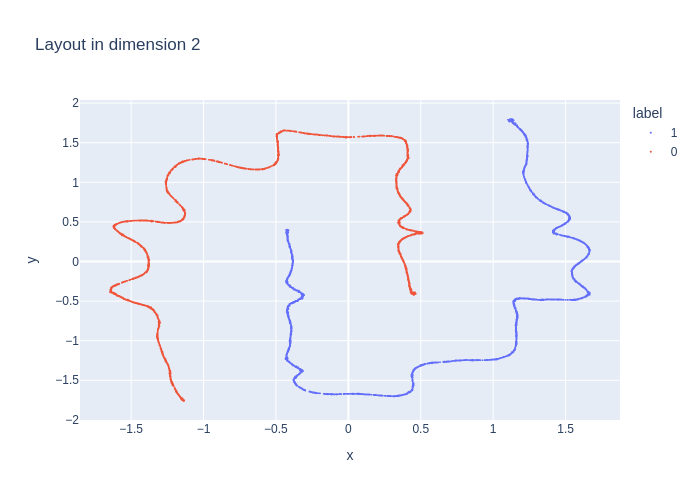

Computing persistence up to dimension 1 and global metrics
done


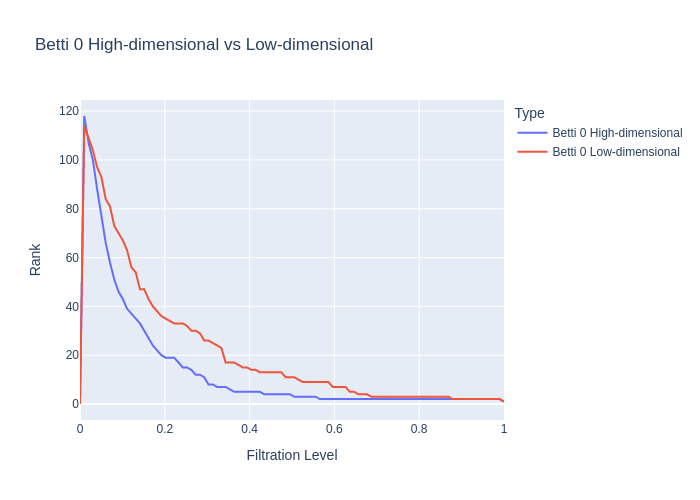

Distance `DTW` for dimension 0: 0.09919256449845903
Distance `TWED` for dimension 0: 0.1936903868517048
Distance `EMD` for dimension 0: 0.00010603921595132962
Distance `Wasserstein` for dimension 0: 0.006928269868611371
Distance `bottleneck` for dimension 0: 0.3198554813861847


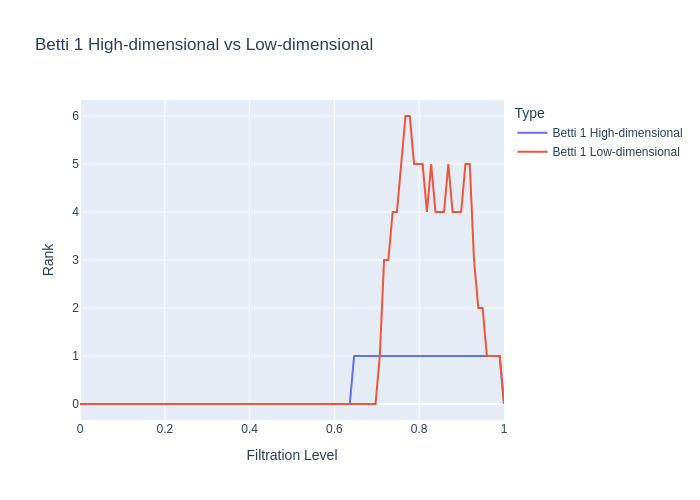

Distance `DTW` for dimension 1: 0.0781917014121512
Distance `TWED` for dimension 1: 0.07095976232453709
Distance `EMD` for dimension 1: 0.0005348505823817832
Distance `Wasserstein` for dimension 1: 0.0008465808789010856
Distance `bottleneck` for dimension 1: 0.15454337000846863
Computing kNN graphs and local metrics
done
Embedding stress (scaling adjusted): 2.6703845710996963
Neighborhood preservation score (mean, std): [0.3838418126106262, 0.2262396663427353]
Computing context measures
done
Context preservation score (SVM): [0.9073482428115016, 0.8242811501597445, -0.0960146532395886]
Context preservation score (kNN): [1.0, 1.0, 0.0]


In [56]:
viz_benchmark(reducer_moons,
              features_moons,
              labels=labels_moons,
              dimension=1,
              subsample_threshold=0.1,
              rng_key=random.PRNGKey(42),
              point_size=2)

In [57]:
benchmarks_moons = {}

In [58]:
benchmark = run_benchmark(reducer_moons,
                          features_moons,
                          labels=labels_moons,
                          dimension=1,
                          subsample_threshold=0.1,
                          rng_key=random.PRNGKey(42),
                          num_trials=1,
                          only_stats=True,)
#
#
#
benchmarks_moons['dire-jax'] =  {
    'Embedding time': benchmark['timing'][0],
    'Embedding stress': benchmark['stress'][0],
    'Neighborhood preservation score': benchmark['neighbor'][0][0],
    'Context preservation score (SVM)': benchmark['svm'][0][2],
    'Context preservation score (kNN)': benchmark['knn'][0][2],
    'Distance DTW for dimension 0': benchmark['dtw'][0][0],
    'Distance TWED for dimension 0': benchmark['twed'][0][0],
    'Distance EMD for dimension 0': benchmark['emd'][0][0],
    'Distance Wasserstein for dimension 0': benchmark['wass'][0][0],
    'Distance bottleneck for dimension 0': benchmark['bott'][0][0],
    'Distance DTW for dimension 1': benchmark['dtw'][0][1],
    'Distance TWED for dimension 1': benchmark['twed'][0][1],
    'Distance EMD for dimension 1': benchmark['emd'][0][1],
    'Distance Wasserstein for dimension 1': benchmark['wass'][0][1],
    'Distance bottleneck for dimension 1': benchmark['bott'][0][1],
    }

100%|██████████| 128/128 [00:06<00:00, 19.73it/s]


### CuML tSNE reducer

Embedding time: 0.6269 seconds


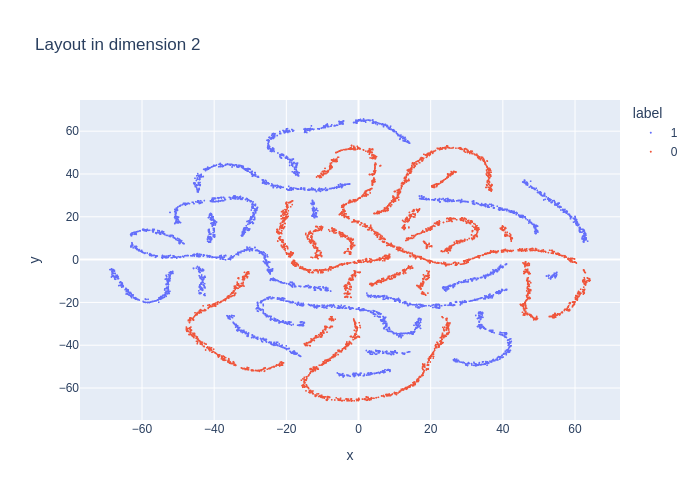

Computing persistence up to dimension 1 and global metrics
done


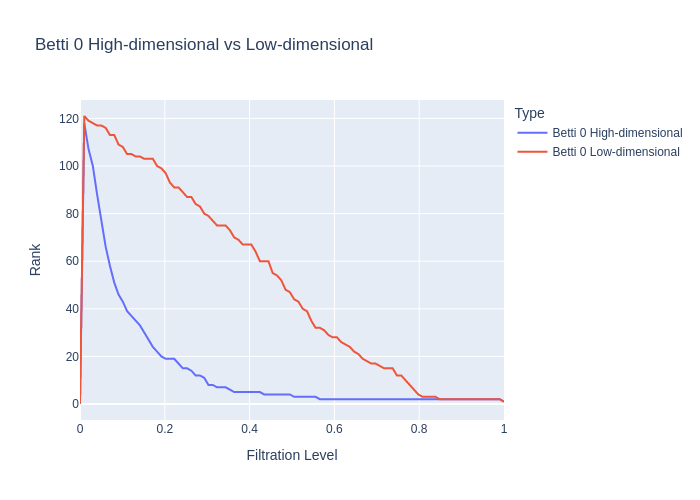

Distance `DTW` for dimension 0: 1.326042173804124
Distance `TWED` for dimension 0: 0.21774779161579427
Distance `EMD` for dimension 0: 0.015131108241492273
Distance `Wasserstein` for dimension 0: 0.5483398114229726
Distance `bottleneck` for dimension 0: 8.060519218444824


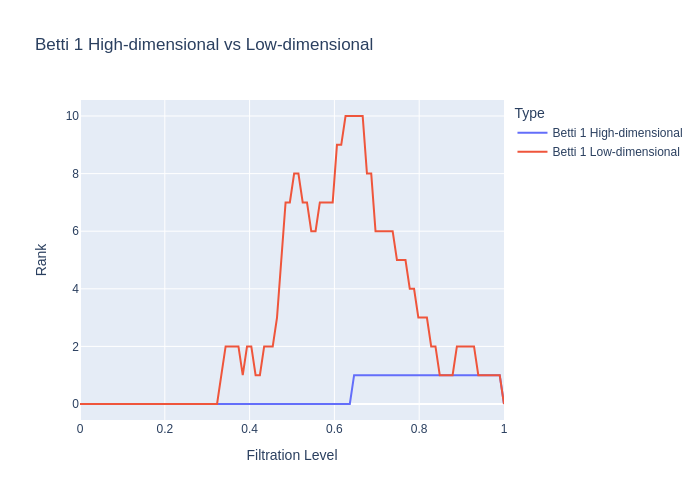

Distance `DTW` for dimension 1: 1.2414325933631274
Distance `TWED` for dimension 1: 0.11980884438621689
Distance `EMD` for dimension 1: 0.12510627938575877
Distance `Wasserstein` for dimension 1: 0.05199488416464338
Distance `bottleneck` for dimension 1: 4.779038906097412
Computing kNN graphs and local metrics
done
Embedding stress (scaling adjusted): 0.004656203178825784
Neighborhood preservation score (mean, std): [0.36896654963493347, 0.25953012704849243]
Computing context measures
done
Context preservation score (SVM): [0.9073482428115016, 0.6166134185303515, -0.38628404925632054]
Context preservation score (kNN): [1.0, 0.984, -0.016129381929883644]


In [59]:
tred_moons = cTSNE(n_components=2,
                   method='fft',
                   perplexity=25,
                   n_neighbors=3*25+1)
#
viz_benchmark(tred_moons,
              features_moons,
              labels=labels_moons,
              dimension=1,
              subsample_threshold=0.1,
              rng_key=random.PRNGKey(42),
              point_size=2)

In [60]:
benchmark = run_benchmark(tred_moons,
                          features_moons,
                          labels=labels_moons,
                          dimension=1,
                          subsample_threshold=0.1,
                          rng_key=random.PRNGKey(42),
                          num_trials=1,
                          only_stats=True,)
#
#
#
benchmarks_moons['cuml-tsne'] =  {
    'Embedding time': benchmark['timing'][0],
    'Embedding stress': benchmark['stress'][0],
    'Neighborhood preservation score': benchmark['neighbor'][0][0],
    'Context preservation score (SVM)': benchmark['svm'][0][2],
    'Context preservation score (kNN)': benchmark['knn'][0][2],
    'Distance DTW for dimension 0': benchmark['dtw'][0][0],
    'Distance TWED for dimension 0': benchmark['twed'][0][0],
    'Distance EMD for dimension 0': benchmark['emd'][0][0],
    'Distance Wasserstein for dimension 0': benchmark['wass'][0][0],
    'Distance bottleneck for dimension 0': benchmark['bott'][0][0],
    'Distance DTW for dimension 1': benchmark['dtw'][0][1],
    'Distance TWED for dimension 1': benchmark['twed'][0][1],
    'Distance EMD for dimension 1': benchmark['emd'][0][1],
    'Distance Wasserstein for dimension 1': benchmark['wass'][0][1],
    'Distance bottleneck for dimension 1': benchmark['bott'][0][1],
    }

### CuML UMAP reducer

Embedding time: 0.1138 seconds


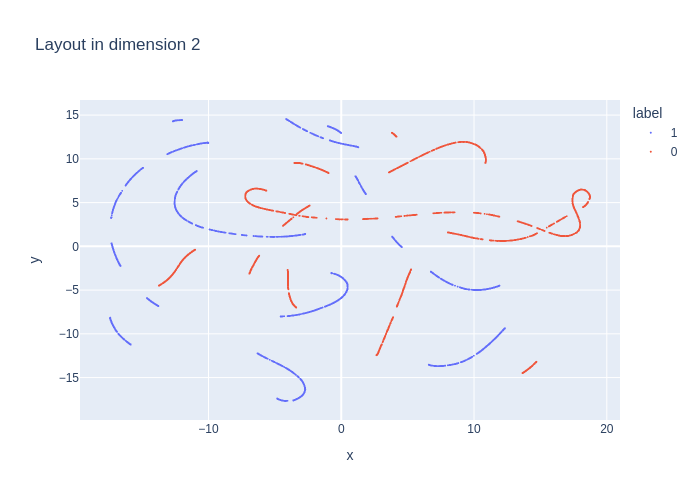

Computing persistence up to dimension 1 and global metrics
done


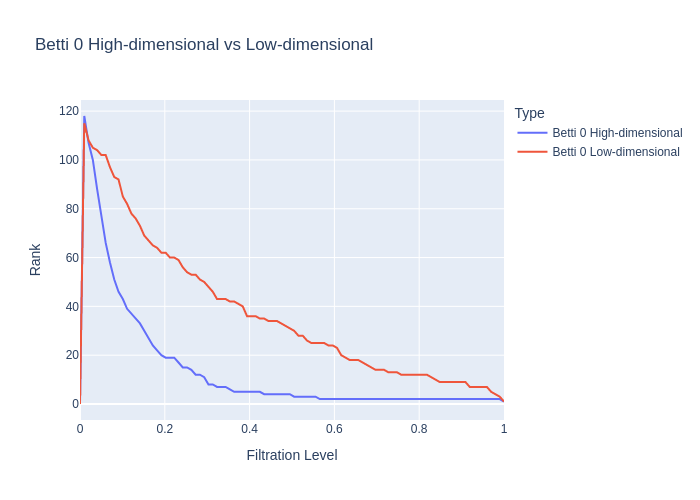

Distance `DTW` for dimension 0: 0.5225300778571904
Distance `TWED` for dimension 0: 0.23988106746801593
Distance `EMD` for dimension 0: 0.00344601207002469
Distance `Wasserstein` for dimension 0: 0.122212459883724
Distance `bottleneck` for dimension 0: 2.4528968334198


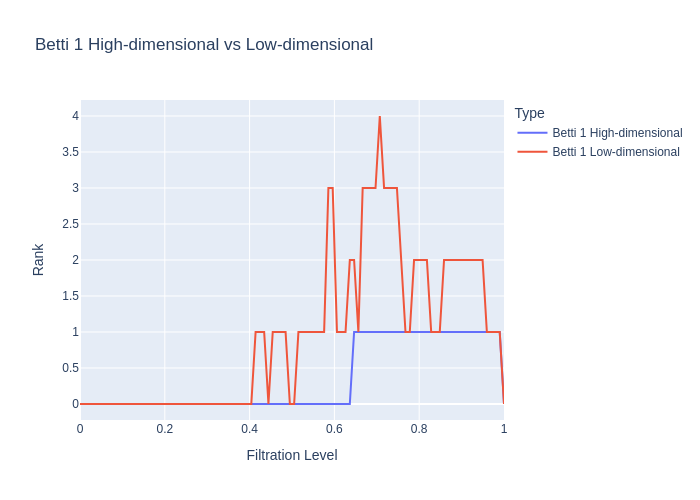

Distance `DTW` for dimension 1: 0.3482380874584317
Distance `TWED` for dimension 1: 0.06562206089096581
Distance `EMD` for dimension 1: 0.014219106844846596
Distance `Wasserstein` for dimension 1: 0.0055952904608567895
Distance `bottleneck` for dimension 1: 0.975635290145874
Computing kNN graphs and local metrics
done
Embedding stress (scaling adjusted): 1.1127969134941664
Neighborhood preservation score (mean, std): [0.3522174656391144, 0.23462848365306854]
Computing context measures
done
Context preservation score (SVM): [0.9073482428115016, 0.610223642172524, -0.3967008101145762]
Context preservation score (kNN): [1.0, 1.0, 0.0]


In [61]:
cured_moons = cUMAP(n_components=reducer_moons.dimension,
                    n_neighbors=reducer_moons.n_neighbors,
                    min_dist=reducer_moons.min_dist,
                    spread=reducer_moons.spread)
#
viz_benchmark(cured_moons,
              features_moons,
              labels=labels_moons,
              dimension=1,
              subsample_threshold=0.1,
              rng_key=random.PRNGKey(42),
              point_size=2)

In [62]:
benchmark = run_benchmark(cured_moons,
                          features_moons,
                          labels=labels_moons,
                          dimension=1,
                          subsample_threshold=0.1,
                          rng_key=random.PRNGKey(42),
                          num_trials=1,
                          only_stats=True,)
#
#
#
benchmarks_moons['cuml-umap'] =  {
    'Embedding time': benchmark['timing'][0],
    'Embedding stress': benchmark['stress'][0],
    'Neighborhood preservation score': benchmark['neighbor'][0][0],
    'Context preservation score (SVM)': benchmark['svm'][0][2],
    'Context preservation score (kNN)': benchmark['knn'][0][2],
    'Distance DTW for dimension 0': benchmark['dtw'][0][0],
    'Distance TWED for dimension 0': benchmark['twed'][0][0],
    'Distance EMD for dimension 0': benchmark['emd'][0][0],
    'Distance Wasserstein for dimension 0': benchmark['wass'][0][0],
    'Distance bottleneck for dimension 0': benchmark['bott'][0][0],
    'Distance DTW for dimension 1': benchmark['dtw'][0][1],
    'Distance TWED for dimension 1': benchmark['twed'][0][1],
    'Distance EMD for dimension 1': benchmark['emd'][0][1],
    'Distance Wasserstein for dimension 1': benchmark['wass'][0][1],
    'Distance bottleneck for dimension 1': benchmark['bott'][0][1],
    }

### Original UMAP reducer

Embedding time: 18.6801 seconds


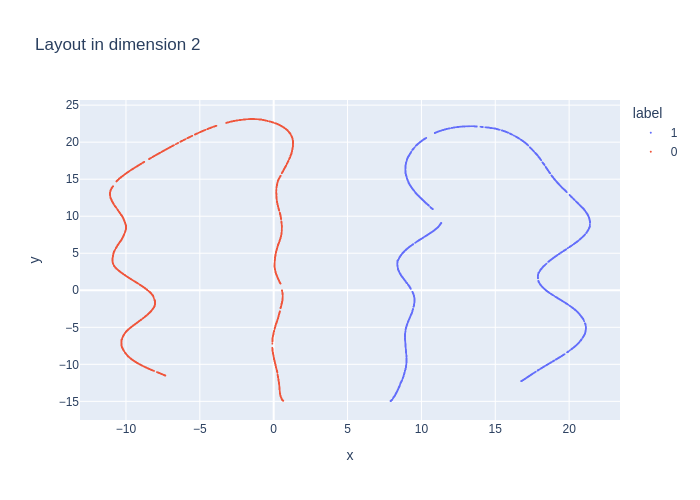

Computing persistence up to dimension 1 and global metrics
done


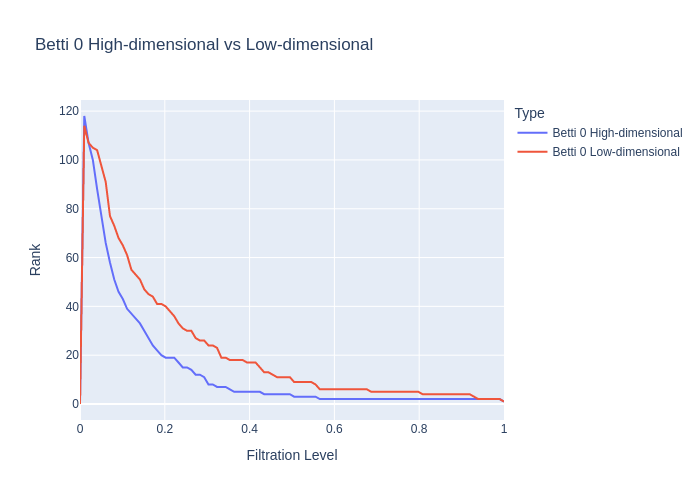

Distance `DTW` for dimension 0: 0.4876807837994284
Distance `TWED` for dimension 0: 0.1710340549253206
Distance `EMD` for dimension 0: 0.0024310882995019142
Distance `Wasserstein` for dimension 0: 0.11395692675192622
Distance `bottleneck` for dimension 0: 3.784388780593872


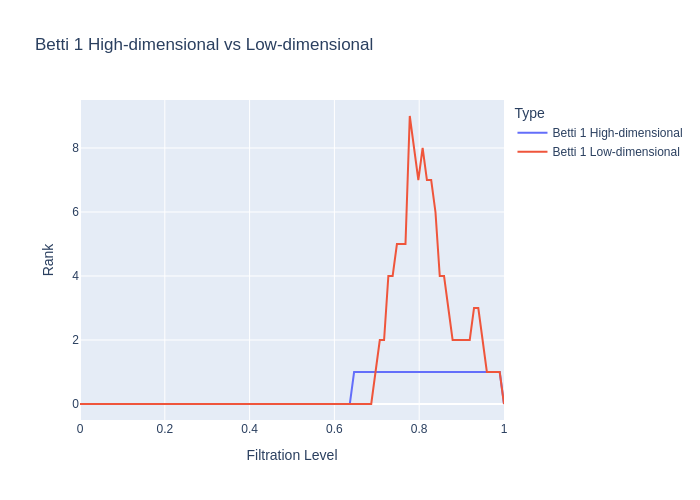

Distance `DTW` for dimension 1: 0.5069399778388484
Distance `TWED` for dimension 1: 0.07532095246209851
Distance `EMD` for dimension 1: 0.026797738284964706
Distance `Wasserstein` for dimension 1: 0.009192831334022648
Distance `bottleneck` for dimension 1: 1.589810848236084
Computing kNN graphs and local metrics
done
Embedding stress (scaling adjusted): 1.4188487963735688
Neighborhood preservation score (mean, std): [0.39142194390296936, 0.23094934225082397]
Computing context measures
done
Context preservation score (SVM): [0.9073482428115016, 1.0, -0.09722895237894716]
Context preservation score (kNN): [1.0, 1.0, 0.0]


In [63]:
red_moons = UMAP(n_components=reducer_moons.dimension,
                 n_neighbors=reducer_moons.n_neighbors,
                 min_dist=reducer_moons.min_dist,
                 spread=reducer_moons.spread)
#
viz_benchmark(red_moons,
              features_moons,
              labels=labels_moons,
              dimension=1,
              subsample_threshold=0.1,
              rng_key=random.PRNGKey(42),
              point_size=2)

In [64]:
benchmark = run_benchmark(red_moons,
                          features_moons,
                          labels=labels_moons,
                          dimension=1,
                          subsample_threshold=0.1,
                          rng_key=random.PRNGKey(42),
                          num_trials=1,
                          only_stats=True,)
#
#
#
benchmarks_moons['umap'] =  {
    'Embedding time': benchmark['timing'][0],
    'Embedding stress': benchmark['stress'][0],
    'Neighborhood preservation score': benchmark['neighbor'][0][0],
    'Context preservation score (SVM)': benchmark['svm'][0][2],
    'Context preservation score (kNN)': benchmark['knn'][0][2],
    'Distance DTW for dimension 0': benchmark['dtw'][0][0],
    'Distance TWED for dimension 0': benchmark['twed'][0][0],
    'Distance EMD for dimension 0': benchmark['emd'][0][0],
    'Distance Wasserstein for dimension 0': benchmark['wass'][0][0],
    'Distance bottleneck for dimension 0': benchmark['bott'][0][0],
    'Distance DTW for dimension 1': benchmark['dtw'][0][1],
    'Distance TWED for dimension 1': benchmark['twed'][0][1],
    'Distance EMD for dimension 1': benchmark['emd'][0][1],
    'Distance Wasserstein for dimension 1': benchmark['wass'][0][1],
    'Distance bottleneck for dimension 1': benchmark['bott'][0][1],
    }

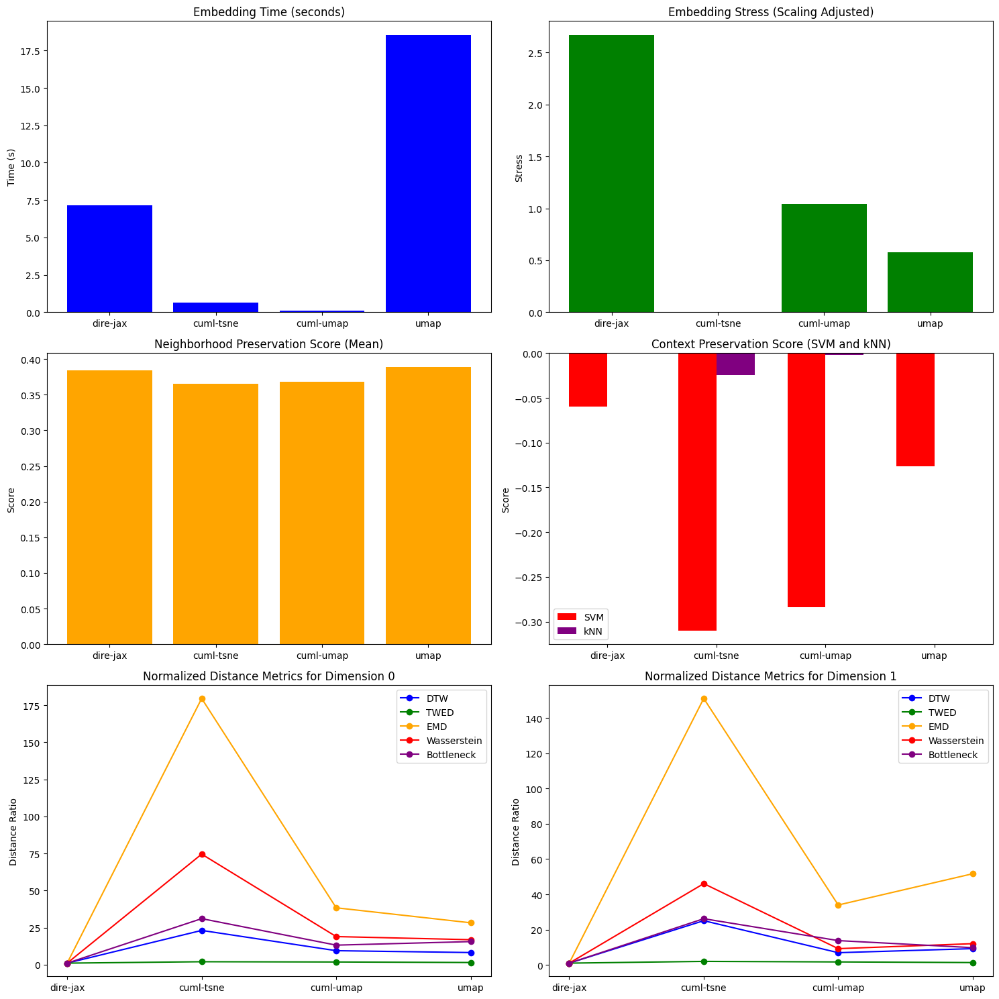

In [65]:
plot_algorithm_comparison(benchmarks_moons)

## Dataset "Levine 13"

In [66]:
exprs_l13 = DataLoader.load_dataset(dataset = "levine13", force_download=True)
exprs_l13.preprocess(arcsinh=True)
##
mask = exprs_l13.cell_types!= 'unassigned'
##
features_l13 = exprs_l13.expression_matrix[mask,:]
labels_l13   = exprs_l13.cell_types[mask]


Download in progress...
This may take quite a while, go grab a coffee or cytomulate it!

Runinng Arcsinh transformation...


### DiRe reducer

In [67]:
reducer_l13 = DiRe(dimension=2,
                   n_neighbors=64,
                   init_embedding_type='pca',
                   max_iter_layout=64,
                   min_dist=1e-4,
                   spread=1.0,
                   cutoff=4.0,
                   n_sample_dirs=16,
                   sample_size=16,
                   neg_ratio=4,
                   verbose=False,)

100%|██████████| 64/64 [00:07<00:00,  8.11it/s]


Embedding time: 9.5509 seconds


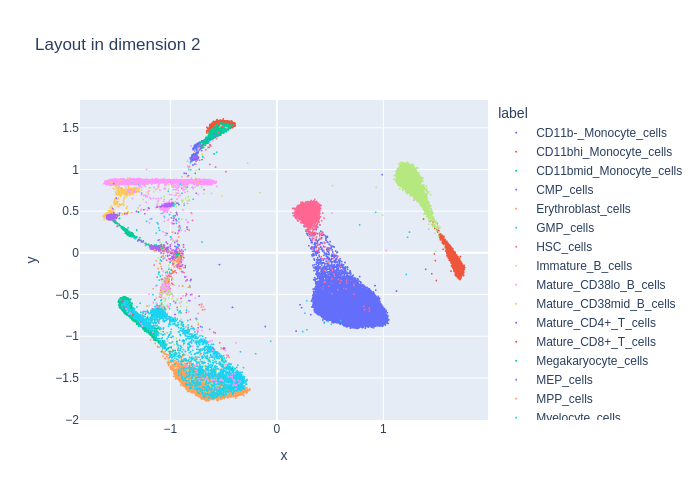

Computing persistence up to dimension 1 and global metrics
done


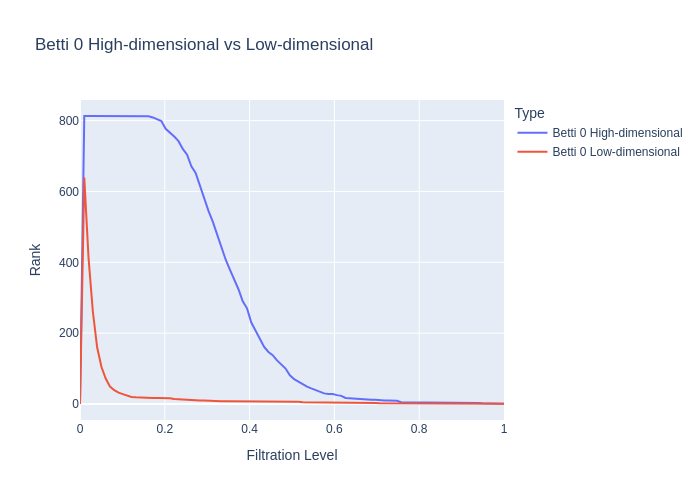

Distance `DTW` for dimension 0: 0.6085131706564397
Distance `TWED` for dimension 0: 0.16622259847357504
Distance `EMD` for dimension 0: 0.0013071222810048624
Distance `Wasserstein` for dimension 0: 0.12441156493047978
Distance `bottleneck` for dimension 0: 2.4786925315856934


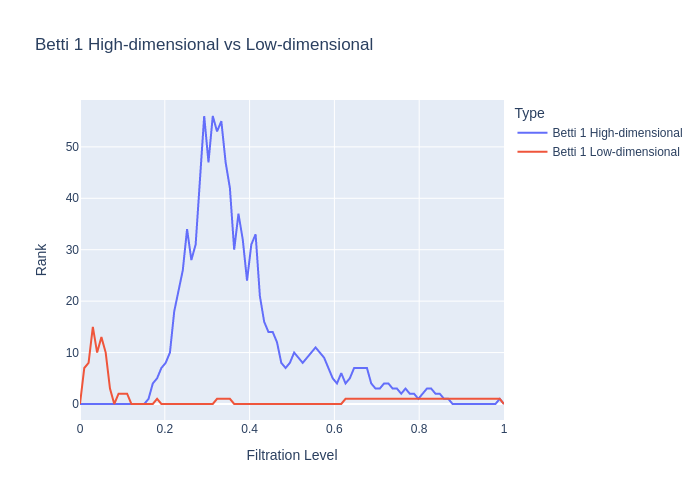

Distance `DTW` for dimension 1: 0.1431868393538009
Distance `TWED` for dimension 1: 0.04283931451442438
Distance `EMD` for dimension 1: 0.0022850735915097183
Distance `Wasserstein` for dimension 1: 0.0059615758684678655
Distance `bottleneck` for dimension 1: 0.5965867042541504
Computing kNN graphs and local metrics
done
Embedding stress (scaling adjusted): 2.57591073678835
Neighborhood preservation score (mean, std): [0.005046817008405924, 0.01152888499200344]
Computing context measures
done
Context preservation score (SVM): [0.9543086172344689, 0.8416833667334669, -0.1255832227753485]
Context preservation score (kNN): [0.946177370030581, 0.9421406727828746, -0.004275448632312281]


In [68]:
viz_benchmark(reducer_l13,
              features_l13,
              labels=labels_l13,
              dimension=1,
              subsample_threshold=0.1,
              rng_key=random.PRNGKey(42),
              point_size=2)

In [69]:
benchmarks_l13 = {}

In [70]:
benchmark = run_benchmark(reducer_l13,
                          features_l13,
                          labels=labels_l13,
                          dimension=1,
                          subsample_threshold=0.1,
                          rng_key=random.PRNGKey(42),
                          num_trials=1,
                          only_stats=True,)
#
#
#
benchmarks_l13['dire-jax'] =  {
    'Embedding time': benchmark['timing'][0],
    'Embedding stress': benchmark['stress'][0],
    'Neighborhood preservation score': benchmark['neighbor'][0][0],
    'Context preservation score (SVM)': benchmark['svm'][0][2],
    'Context preservation score (kNN)': benchmark['knn'][0][2],
    'Distance DTW for dimension 0': benchmark['dtw'][0][0],
    'Distance TWED for dimension 0': benchmark['twed'][0][0],
    'Distance EMD for dimension 0': benchmark['emd'][0][0],
    'Distance Wasserstein for dimension 0': benchmark['wass'][0][0],
    'Distance bottleneck for dimension 0': benchmark['bott'][0][0],
    'Distance DTW for dimension 1': benchmark['dtw'][0][1],
    'Distance TWED for dimension 1': benchmark['twed'][0][1],
    'Distance EMD for dimension 1': benchmark['emd'][0][1],
    'Distance Wasserstein for dimension 1': benchmark['wass'][0][1],
    'Distance bottleneck for dimension 1': benchmark['bott'][0][1],
    }

100%|██████████| 64/64 [00:04<00:00, 14.51it/s]


### CuML tSNE reducer

[W] [03:41:34.178125] # of Nearest Neighbors should be at least 3 * perplexity. Your results might be a bit strange...
Embedding time: 1.4502 seconds


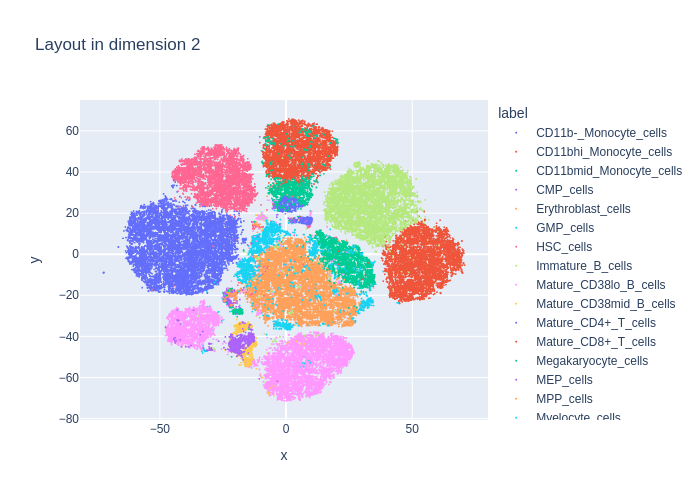

Computing persistence up to dimension 1 and global metrics
done


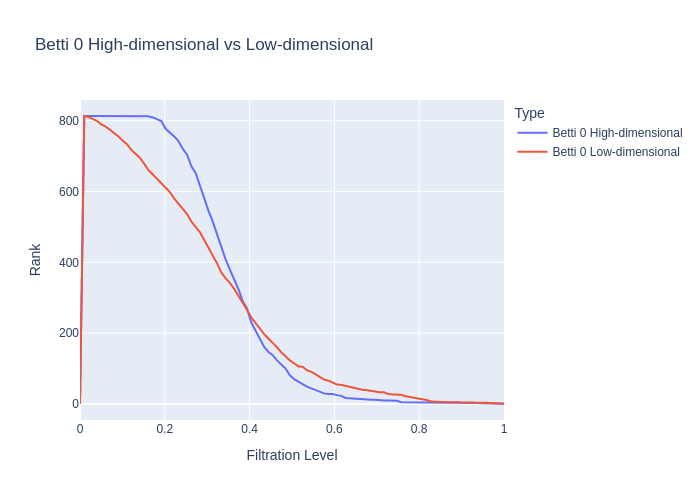

Distance `DTW` for dimension 0: 0.058732601219302655
Distance `TWED` for dimension 0: 0.09285223420965609
Distance `EMD` for dimension 0: 6.636916275586228e-05
Distance `Wasserstein` for dimension 0: 0.06639662133123843
Distance `bottleneck` for dimension 0: 2.5666937828063965


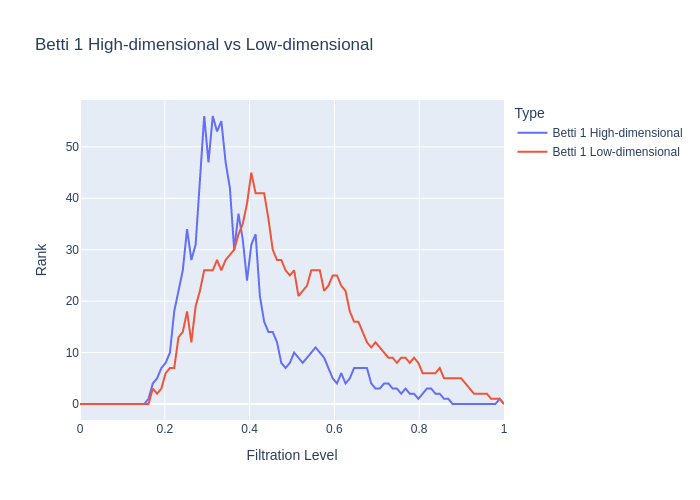

Distance `DTW` for dimension 1: 0.07813963490481933
Distance `TWED` for dimension 1: 0.03445166679114433
Distance `EMD` for dimension 1: 0.0006497528595819292
Distance `Wasserstein` for dimension 1: 0.01933758833772575
Distance `bottleneck` for dimension 1: 3.1203081607818604
Computing kNN graphs and local metrics
done
Embedding stress (scaling adjusted): 4.993063582045226
Neighborhood preservation score (mean, std): [0.05103432387113571, 0.056650299578905106]
Computing context measures
done
Context preservation score (SVM): [0.9543086172344689, 0.7498997995991984, -0.2410475202127731]
Context preservation score (kNN): [0.9549439347604485, 0.9654230377166158, 0.010913754631291338]


In [71]:
tred_l13 = cTSNE(n_components=2,
                  method='fft',
                  perplexity=25,
                  n_neighbors=3*25+1)
#
viz_benchmark(tred_l13,
              features_l13,
              labels=labels_l13,
              dimension=1,
              subsample_threshold=0.1,
              rng_key=random.PRNGKey(42),
              point_size=2)

In [72]:
benchmark = run_benchmark(tred_l13,
                          features_l13,
                          labels=labels_l13,
                          dimension=1,
                          subsample_threshold=0.1,
                          rng_key=random.PRNGKey(42),
                          num_trials=1,
                          only_stats=True,)
#
#
#
benchmarks_l13['cuml-tsne'] =  {
    'Embedding time': benchmark['timing'][0],
    'Embedding stress': benchmark['stress'][0],
    'Neighborhood preservation score': benchmark['neighbor'][0][0],
    'Context preservation score (SVM)': benchmark['svm'][0][2],
    'Context preservation score (kNN)': benchmark['knn'][0][2],
    'Distance DTW for dimension 0': benchmark['dtw'][0][0],
    'Distance TWED for dimension 0': benchmark['twed'][0][0],
    'Distance EMD for dimension 0': benchmark['emd'][0][0],
    'Distance Wasserstein for dimension 0': benchmark['wass'][0][0],
    'Distance bottleneck for dimension 0': benchmark['bott'][0][0],
    'Distance DTW for dimension 1': benchmark['dtw'][0][1],
    'Distance TWED for dimension 1': benchmark['twed'][0][1],
    'Distance EMD for dimension 1': benchmark['emd'][0][1],
    'Distance Wasserstein for dimension 1': benchmark['wass'][0][1],
    'Distance bottleneck for dimension 1': benchmark['bott'][0][1],
    }

[W] [03:43:12.150255] # of Nearest Neighbors should be at least 3 * perplexity. Your results might be a bit strange...


### CuML UMAP reducer

Embedding time: 0.8998 seconds


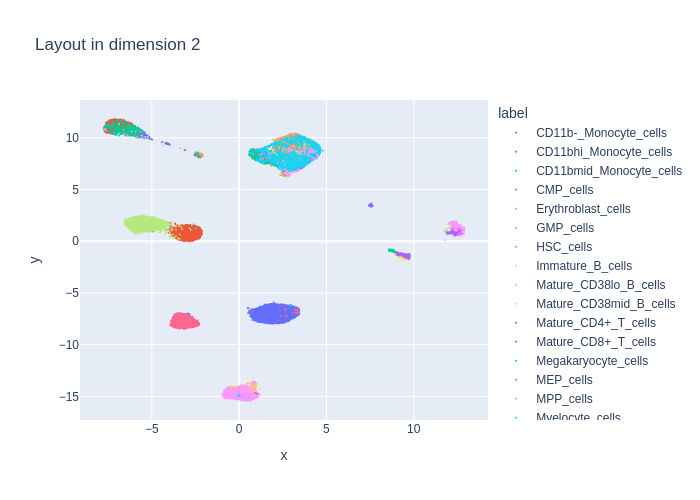

Computing persistence up to dimension 1 and global metrics
done


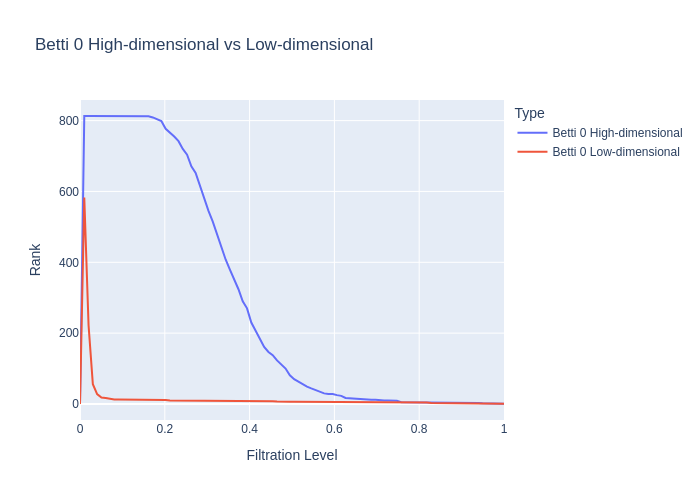

Distance `DTW` for dimension 0: 0.8696166238725574
Distance `TWED` for dimension 0: 0.18929197927000663
Distance `EMD` for dimension 0: 0.0018270247734663392
Distance `Wasserstein` for dimension 0: 0.1273970682318905
Distance `bottleneck` for dimension 0: 2.1575403213500977


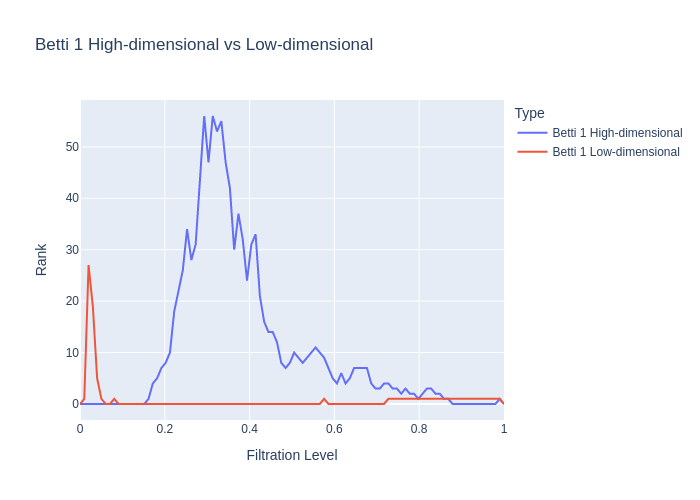

Distance `DTW` for dimension 1: 0.07407382183472644
Distance `TWED` for dimension 1: 0.04546598037198623
Distance `EMD` for dimension 1: 0.004771184863962443
Distance `Wasserstein` for dimension 1: 0.0066519874325808815
Distance `bottleneck` for dimension 1: 1.484520673751831
Computing kNN graphs and local metrics
done
Embedding stress (scaling adjusted): 4.67772440268812
Neighborhood preservation score (mean, std): [0.008711258880794048, 0.01615019515156746]
Computing context measures
done
Context preservation score (SVM): [0.9543086172344689, 0.8196392785571143, -0.1521227780099606]
Context preservation score (kNN): [0.946177370030581, 0.9502140672782875, 0.004257246963994328]


In [73]:
cured_l13 = cUMAP(n_components=reducer_l13.dimension,
                  n_neighbors=reducer_l13.n_neighbors,
                  min_dist=reducer_l13.min_dist,
                  spread=reducer_l13.spread)
#
viz_benchmark(cured_l13,
              features_l13,
              labels=labels_l13,
              dimension=1,
              subsample_threshold=0.1,
              rng_key=random.PRNGKey(42),
              point_size=2)

In [74]:
benchmark = run_benchmark(cured_l13,
                          features_l13,
                          labels=labels_l13,
                          dimension=1,
                          subsample_threshold=0.1,
                          rng_key=random.PRNGKey(42),
                          num_trials=1,
                          only_stats=True,)
#
#
#
benchmarks_l13['cuml-umap'] =  {
    'Embedding time': benchmark['timing'][0],
    'Embedding stress': benchmark['stress'][0],
    'Neighborhood preservation score': benchmark['neighbor'][0][0],
    'Context preservation score (SVM)': benchmark['svm'][0][2],
    'Context preservation score (kNN)': benchmark['knn'][0][2],
    'Distance DTW for dimension 0': benchmark['dtw'][0][0],
    'Distance TWED for dimension 0': benchmark['twed'][0][0],
    'Distance EMD for dimension 0': benchmark['emd'][0][0],
    'Distance Wasserstein for dimension 0': benchmark['wass'][0][0],
    'Distance bottleneck for dimension 0': benchmark['bott'][0][0],
    'Distance DTW for dimension 1': benchmark['dtw'][0][1],
    'Distance TWED for dimension 1': benchmark['twed'][0][1],
    'Distance EMD for dimension 1': benchmark['emd'][0][1],
    'Distance Wasserstein for dimension 1': benchmark['wass'][0][1],
    'Distance bottleneck for dimension 1': benchmark['bott'][0][1],
    }

### Original UMAP reducer

Embedding time: 65.8062 seconds


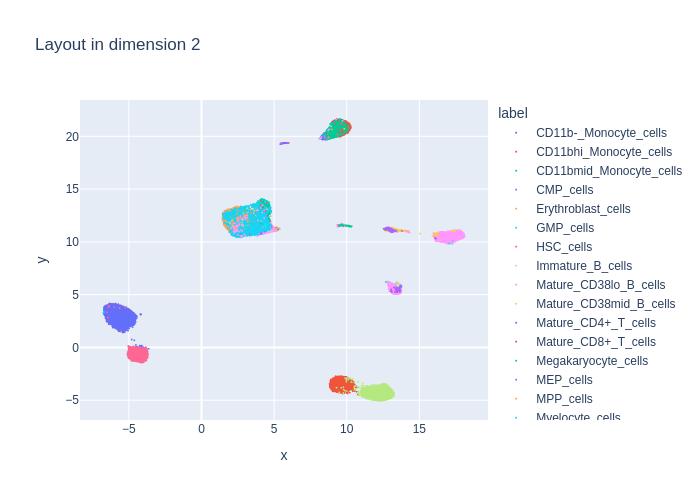

Computing persistence up to dimension 1 and global metrics
done


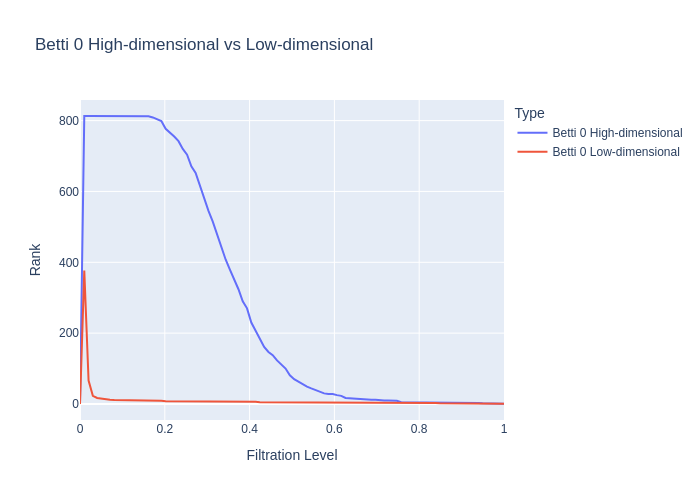

Distance `DTW` for dimension 0: 1.6093493984990337
Distance `TWED` for dimension 0: 0.19482543710448985
Distance `EMD` for dimension 0: 0.0048256255246787935
Distance `Wasserstein` for dimension 0: 0.12802916878193343
Distance `bottleneck` for dimension 0: 5.113533973693848


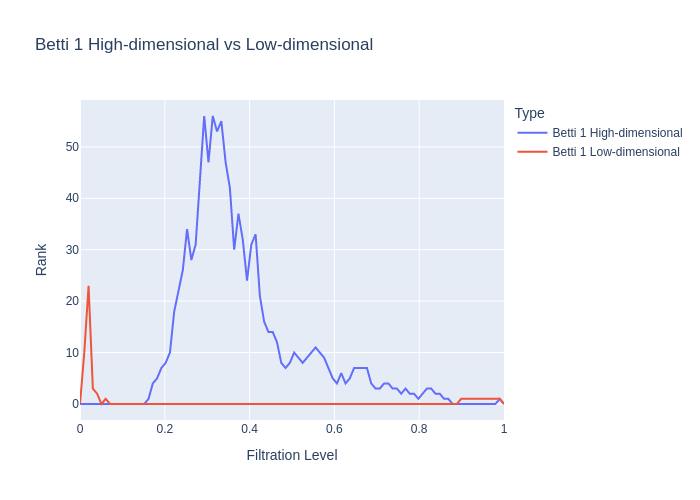

Distance `DTW` for dimension 1: 0.09578827262406278
Distance `TWED` for dimension 1: 0.04546602807863794
Distance `EMD` for dimension 1: 0.008974713552915391
Distance `Wasserstein` for dimension 1: 0.0065277383519314345
Distance `bottleneck` for dimension 1: 0.7767024040222168
Computing kNN graphs and local metrics
done
Embedding stress (scaling adjusted): 4.410533017427087
Neighborhood preservation score (mean, std): [0.00978119857609272, 0.0173808503895998]
Computing context measures
done
Context preservation score (SVM): [0.9543086172344689, 0.8164328657314629, -0.156042430260057]
Context preservation score (kNN): [0.946177370030581, 0.9557186544342507, 0.010033528989577784]


In [75]:
red_l13 = UMAP(n_components=reducer_l13.dimension,
               n_neighbors=reducer_l13.n_neighbors,
               min_dist=reducer_l13.min_dist,
               spread=reducer_l13.spread)
#
viz_benchmark(red_l13,
              features_l13,
              labels=labels_l13,
              dimension=1,
              subsample_threshold=0.1,
              rng_key=random.PRNGKey(42),
              point_size=2)

In [76]:
benchmark = run_benchmark(red_l13,
                          features_l13,
                          labels=labels_l13,
                          dimension=1,
                          subsample_threshold=0.1,
                          rng_key=random.PRNGKey(42),
                          num_trials=1,
                          only_stats=True,)
#
#
#
benchmarks_l13['umap'] =  {
    'Embedding time': benchmark['timing'][0],
    'Embedding stress': benchmark['stress'][0],
    'Neighborhood preservation score': benchmark['neighbor'][0][0],
    'Context preservation score (SVM)': benchmark['svm'][0][2],
    'Context preservation score (kNN)': benchmark['knn'][0][2],
    'Distance DTW for dimension 0': benchmark['dtw'][0][0],
    'Distance TWED for dimension 0': benchmark['twed'][0][0],
    'Distance EMD for dimension 0': benchmark['emd'][0][0],
    'Distance Wasserstein for dimension 0': benchmark['wass'][0][0],
    'Distance bottleneck for dimension 0': benchmark['bott'][0][0],
    'Distance DTW for dimension 1': benchmark['dtw'][0][1],
    'Distance TWED for dimension 1': benchmark['twed'][0][1],
    'Distance EMD for dimension 1': benchmark['emd'][0][1],
    'Distance Wasserstein for dimension 1': benchmark['wass'][0][1],
    'Distance bottleneck for dimension 1': benchmark['bott'][0][1],
    }

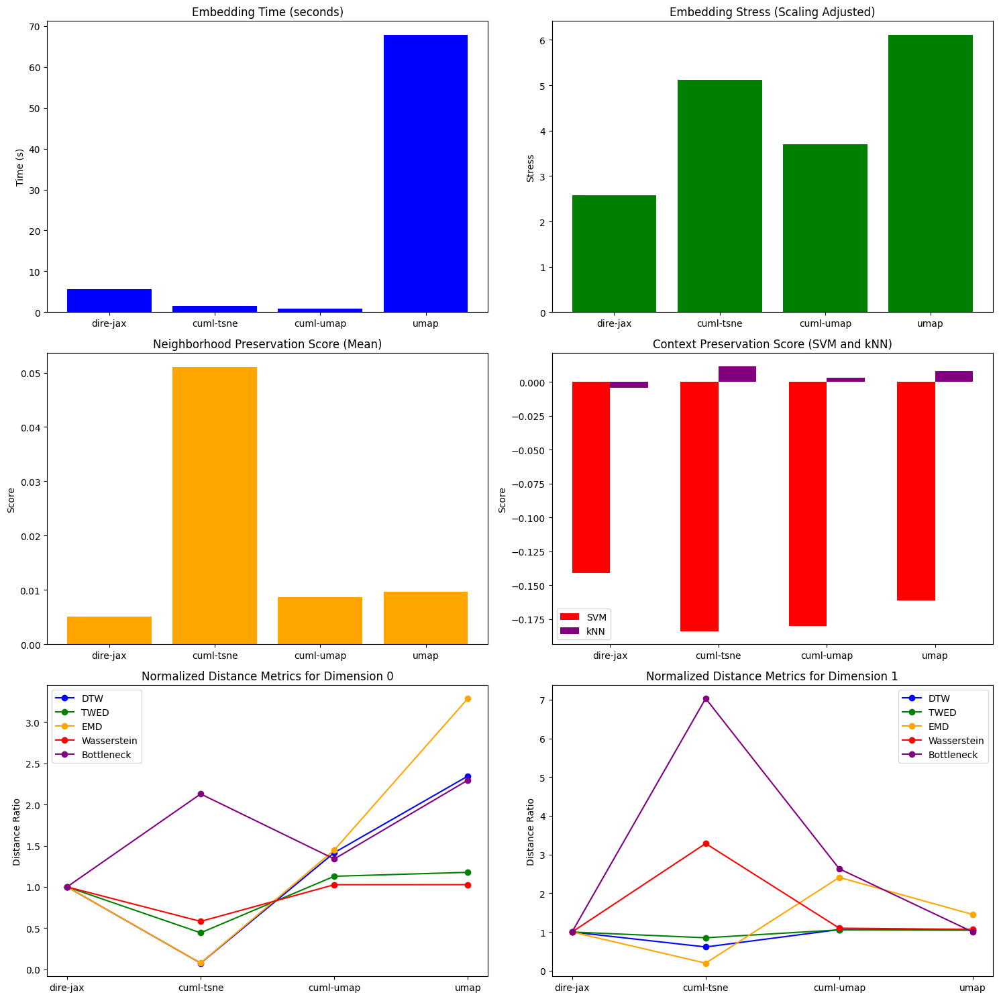

In [77]:
plot_algorithm_comparison(benchmarks_l13)

## Dataset "Levine 32"

In [18]:
exprs_l32 = DataLoader.load_dataset(dataset = "levine32", force_download=True)
exprs_l32.preprocess(arcsinh=True)
##
mask = exprs_l32.cell_types!= 'unassigned'
##
features_l32 = exprs_l32.expression_matrix[mask,:]
labels_l32   = exprs_l32.cell_types[mask]


Download in progress...
This may take quite a while, go grab a coffee or cytomulate it!

Runinng Arcsinh transformation...


### DiRe reducer

In [19]:
reducer_l32 = DiRe(dimension=2,
                   n_neighbors=64,
                   init_embedding_type='random',
                   max_iter_layout=64,
                   min_dist=1e-4,
                   spread=1.0,
                   cutoff=4.0,
                   n_sample_dirs=16,
                   sample_size=16,
                   neg_ratio=16,
                   verbose=False,)

100%|██████████| 64/64 [00:10<00:00,  6.38it/s]


Embedding time: 12.4701 seconds


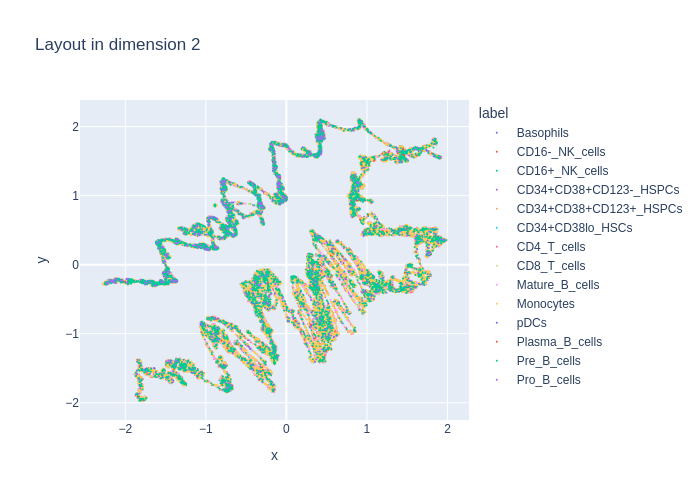

Computing persistence up to dimension 1 and global metrics
done


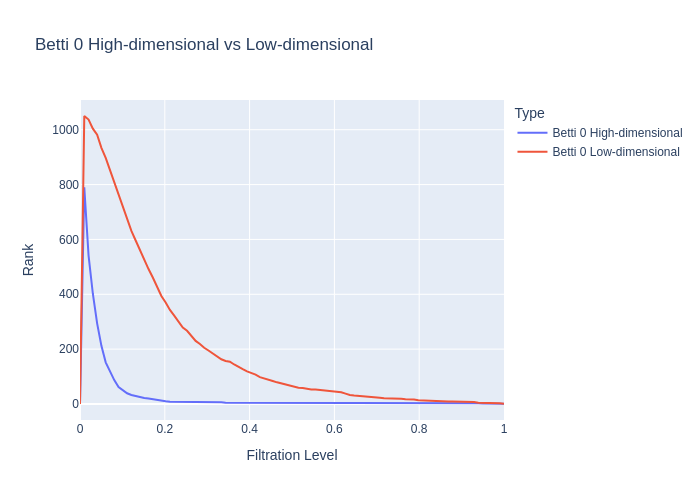

Distance `DTW` for dimension 0: 193.87271992233227
Distance `TWED` for dimension 0: 0.1919011601875656
Distance `EMD` for dimension 0: 2.236412573056049
Distance `Wasserstein` for dimension 0: 102.37868954829185
Distance `bottleneck` for dimension 0: 20301.314453125


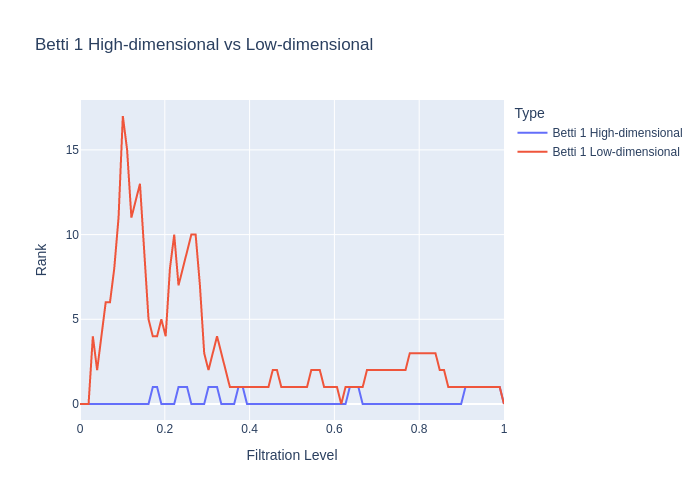

Distance `DTW` for dimension 1: 25.36916422149162
Distance `TWED` for dimension 1: 0.026668775033850685
Distance `EMD` for dimension 1: 4.4494212596575435
Distance `Wasserstein` for dimension 1: 0.08153473825315144
Distance `bottleneck` for dimension 1: 257.005126953125
Computing kNN graphs and local metrics
done
Embedding stress (scaling adjusted): 2.62051953231574
Neighborhood preservation score (mean, std): [0.0444391705095768, 0.06131498143076897]
Computing context measures
done
Context preservation score (SVM): [0.989821882951654, 0.25190839694656486, -1.3684594934838565]
Context preservation score (kNN): [0.9750127975428717, 0.23569874584079856, -1.4198961076666587]


In [20]:
viz_benchmark(reducer_l32,
              features_l32,
              labels=labels_l32,
              dimension=1,
              subsample_threshold=0.1,
              rng_key=random.PRNGKey(42),
              point_size=2,)

In [21]:
benchmarks_l32 = {}

In [22]:
benchmark = run_benchmark(reducer_l32,
                          features_l32,
                          labels=labels_l32,
                          dimension=1,
                          subsample_threshold=0.1,
                          rng_key=random.PRNGKey(42),
                          num_trials=1,
                          only_stats=True,)
#
#
#
benchmarks_l32['dire-jax'] =  {
    'Embedding time': benchmark['timing'][0],
    'Embedding stress': benchmark['stress'][0],
    'Neighborhood preservation score': benchmark['neighbor'][0][0],
    'Context preservation score (SVM)': benchmark['svm'][0][2],
    'Context preservation score (kNN)': benchmark['knn'][0][2],
    'Distance DTW for dimension 0': benchmark['dtw'][0][0],
    'Distance TWED for dimension 0': benchmark['twed'][0][0],
    'Distance EMD for dimension 0': benchmark['emd'][0][0],
    'Distance Wasserstein for dimension 0': benchmark['wass'][0][0],
    'Distance bottleneck for dimension 0': benchmark['bott'][0][0],
    'Distance DTW for dimension 1': benchmark['dtw'][0][1],
    'Distance TWED for dimension 1': benchmark['twed'][0][1],
    'Distance EMD for dimension 1': benchmark['emd'][0][1],
    'Distance Wasserstein for dimension 1': benchmark['wass'][0][1],
    'Distance bottleneck for dimension 1': benchmark['bott'][0][1],
    }

100%|██████████| 64/64 [00:06<00:00,  9.57it/s]


### CuML tSNE reducer

[W] [04:50:22.249992] # of Nearest Neighbors should be at least 3 * perplexity. Your results might be a bit strange...
Embedding time: 3.1435 seconds


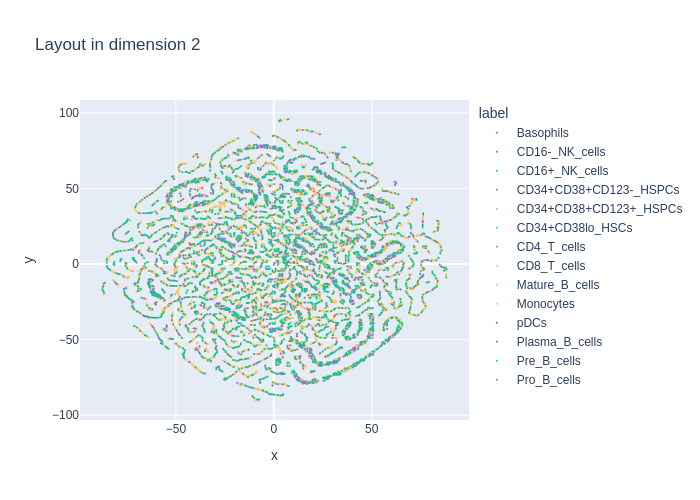

Computing persistence up to dimension 1 and global metrics
done


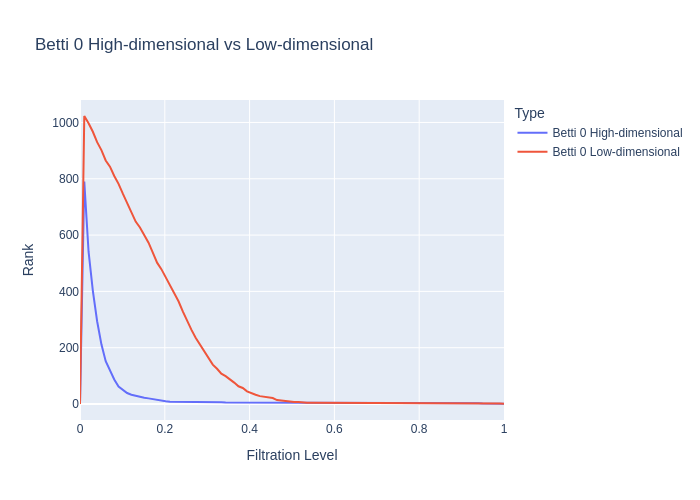

Distance `DTW` for dimension 0: 193.79692845778933
Distance `TWED` for dimension 0: 0.17851497026135116
Distance `EMD` for dimension 0: 2.064724406547537
Distance `Wasserstein` for dimension 0: 102.57599044140912
Distance `bottleneck` for dimension 0: 20301.314453125


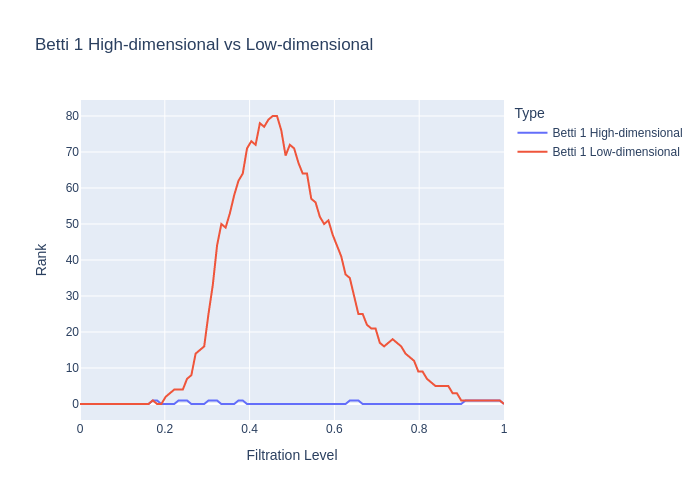

Distance `DTW` for dimension 1: 25.294493037136426
Distance `TWED` for dimension 1: 0.03520054679764298
Distance `EMD` for dimension 1: 33.69319169269918
Distance `Wasserstein` for dimension 1: 0.10777356147205286
Distance `bottleneck` for dimension 1: 257.005126953125
Computing kNN graphs and local metrics
done
Embedding stress (scaling adjusted): 4.9475654414612595
Neighborhood preservation score (mean, std): [0.21375170350074768, 0.16920454800128937]
Computing context measures
done
Context preservation score (SVM): [0.989821882951654, 0.25286259541984735, -1.36467877064395]
Context preservation score (kNN): [0.9774763245456872, 0.23461095469669824, -1.4270454408115525]


In [23]:
tred_l32 = cTSNE(n_components=2,
                  method='fft',
                  perplexity=25,
                  n_neighbors=3*25+1)
#
viz_benchmark(tred_l32,
              features_l32,
              labels=labels_l32,
              dimension=1,
              subsample_threshold=0.1,
              rng_key=random.PRNGKey(42),
              point_size=2)

In [24]:
benchmark = run_benchmark(tred_l32,
                          features_l32,
                          labels=labels_l32,
                          dimension=1,
                          subsample_threshold=0.1,
                          rng_key=random.PRNGKey(42),
                          num_trials=1,
                          only_stats=True,)
#
#
#
benchmarks_l32['cuml-tsne'] =  {
    'Embedding time': benchmark['timing'][0],
    'Embedding stress': benchmark['stress'][0],
    'Neighborhood preservation score': benchmark['neighbor'][0][0],
    'Context preservation score (SVM)': benchmark['svm'][0][2],
    'Context preservation score (kNN)': benchmark['knn'][0][2],
    'Distance DTW for dimension 0': benchmark['dtw'][0][0],
    'Distance TWED for dimension 0': benchmark['twed'][0][0],
    'Distance EMD for dimension 0': benchmark['emd'][0][0],
    'Distance Wasserstein for dimension 0': benchmark['wass'][0][0],
    'Distance bottleneck for dimension 0': benchmark['bott'][0][0],
    'Distance DTW for dimension 1': benchmark['dtw'][0][1],
    'Distance TWED for dimension 1': benchmark['twed'][0][1],
    'Distance EMD for dimension 1': benchmark['emd'][0][1],
    'Distance Wasserstein for dimension 1': benchmark['wass'][0][1],
    'Distance bottleneck for dimension 1': benchmark['bott'][0][1],
    }

[W] [04:52:19.199268] # of Nearest Neighbors should be at least 3 * perplexity. Your results might be a bit strange...


### CuML UMAP reducer

Embedding time: 1.8902 seconds


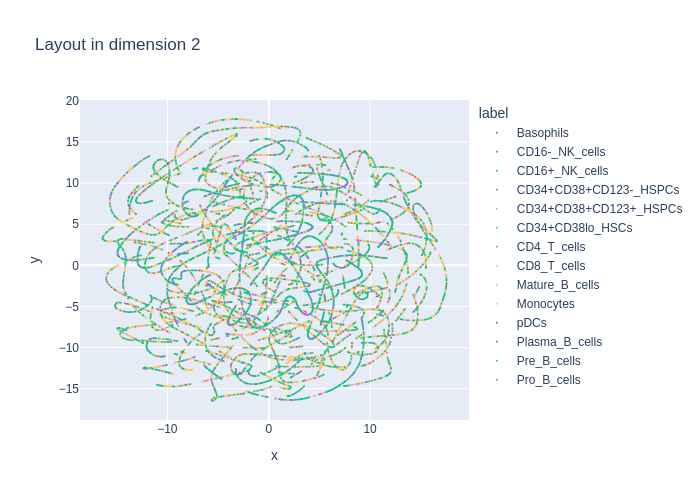

Computing persistence up to dimension 1 and global metrics
done


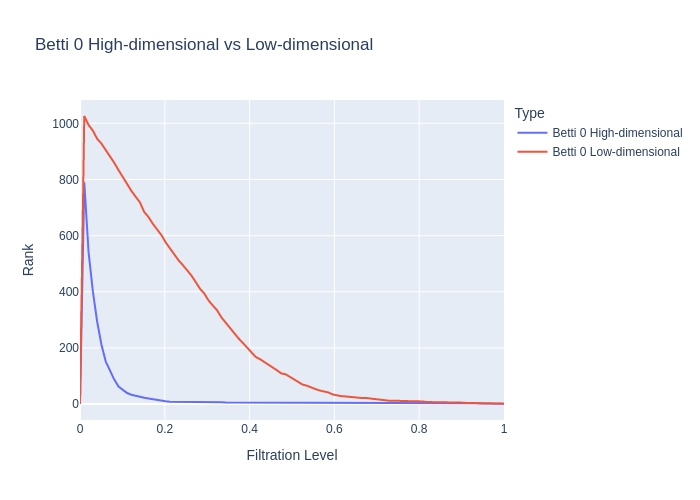

Distance `DTW` for dimension 0: 193.8848685121445
Distance `TWED` for dimension 0: 0.18941803473647165
Distance `EMD` for dimension 0: 2.8099394734828596
Distance `Wasserstein` for dimension 0: 102.4141543920133
Distance `bottleneck` for dimension 0: 20301.314453125


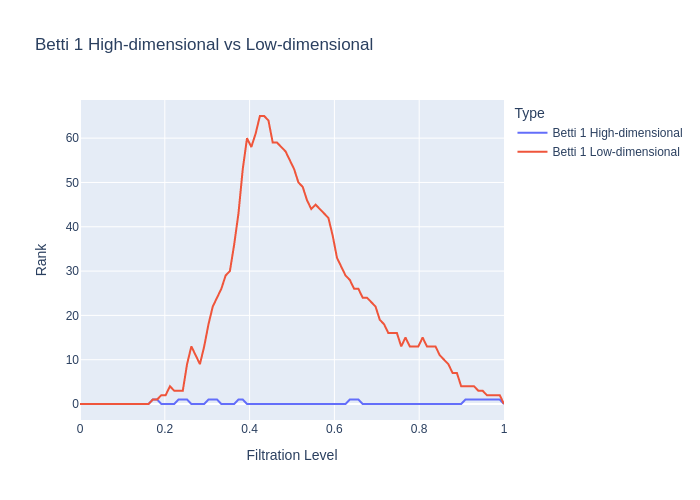

Distance `DTW` for dimension 1: 25.35755114857612
Distance `TWED` for dimension 1: 0.03299012814889679
Distance `EMD` for dimension 1: 28.018218808642843
Distance `Wasserstein` for dimension 1: 0.08602222126002929
Distance `bottleneck` for dimension 1: 257.005126953125
Computing kNN graphs and local metrics
done
Embedding stress (scaling adjusted): 6.334438279781827
Neighborhood preservation score (mean, std): [0.12456746399402618, 0.1503361314535141]
Computing context measures
done
Context preservation score (SVM): [0.989821882951654, 0.25286259541984735, -1.36467877064395]
Context preservation score (kNN): [0.9750127975428717, 0.23310724340926542, -1.430951976780963]


In [25]:
cured_l32 = cUMAP(n_components=reducer_l32.dimension,
                  n_neighbors=reducer_l32.n_neighbors,
                  min_dist=reducer_l32.min_dist,
                  spread=reducer_l32.spread)
#
viz_benchmark(cured_l32,
              features_l32,
              labels=labels_l32,
              dimension=1,
              subsample_threshold=0.1,
              rng_key=random.PRNGKey(42),
              point_size=2)

In [26]:
benchmark = run_benchmark(cured_l32,
                          features_l32,
                          labels=labels_l32,
                          dimension=1,
                          subsample_threshold=0.1,
                          rng_key=random.PRNGKey(42),
                          num_trials=1,
                          only_stats=True,)
#
#
#
benchmarks_l32['cuml-umap'] =  {
    'Embedding time': benchmark['timing'][0],
    'Embedding stress': benchmark['stress'][0],
    'Neighborhood preservation score': benchmark['neighbor'][0][0],
    'Context preservation score (SVM)': benchmark['svm'][0][2],
    'Context preservation score (kNN)': benchmark['knn'][0][2],
    'Distance DTW for dimension 0': benchmark['dtw'][0][0],
    'Distance TWED for dimension 0': benchmark['twed'][0][0],
    'Distance EMD for dimension 0': benchmark['emd'][0][0],
    'Distance Wasserstein for dimension 0': benchmark['wass'][0][0],
    'Distance bottleneck for dimension 0': benchmark['bott'][0][0],
    'Distance DTW for dimension 1': benchmark['dtw'][0][1],
    'Distance TWED for dimension 1': benchmark['twed'][0][1],
    'Distance EMD for dimension 1': benchmark['emd'][0][1],
    'Distance Wasserstein for dimension 1': benchmark['wass'][0][1],
    'Distance bottleneck for dimension 1': benchmark['bott'][0][1],
    }

### Original UMAP reducer

Embedding time: 70.7332 seconds


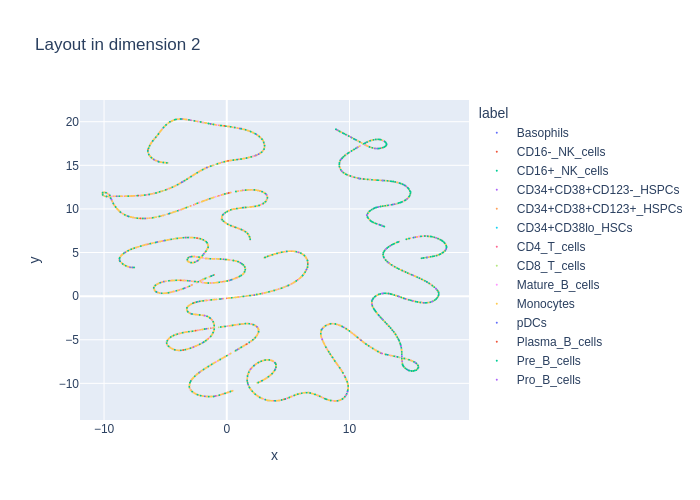

Computing persistence up to dimension 1 and global metrics
done


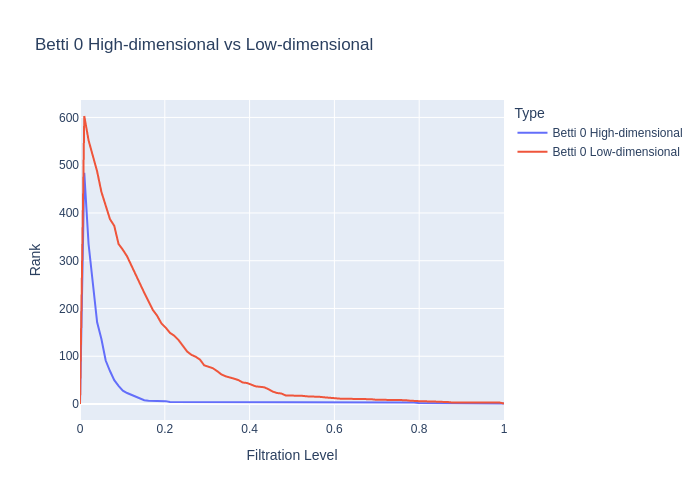

Distance `DTW` for dimension 0: 1244.1054899103196
Distance `TWED` for dimension 0: 0.478322712811424
Distance `EMD` for dimension 0: 11.329528174885269
Distance `Wasserstein` for dimension 0: 394.07171796746485
Distance `bottleneck` for dimension 0: 32520.513671875


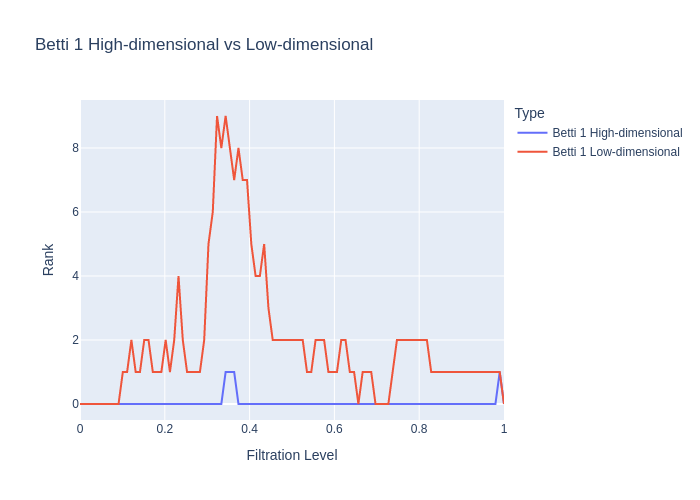

Distance `DTW` for dimension 1: 135.67965823238356
Distance `TWED` for dimension 1: 0.09183719929795094
Distance `EMD` for dimension 1: 67.82860643883411
Distance `Wasserstein` for dimension 1: 0.08869719565883596
Distance `bottleneck` for dimension 1: 61.9501953125
Computing kNN graphs and local metrics
done
Embedding stress (scaling adjusted): 20.32227339893666
Neighborhood preservation score (mean, std): [0.4068012237548828, 0.2859422266483307]
Computing context measures
done
Context preservation score (SVM): [0.9796178343949045, 0.2713375796178344, -1.2837988037962187]
Context preservation score (kNN): [0.9526551503518874, 0.22936660268714013, -1.423931372644334]


In [27]:
features_l32_sub = features_l32[::10]
labels_l32_sub   = labels_l32[::10]
#
red_l32 = UMAP(n_components=reducer_l32.dimension,
               n_neighbors=reducer_l32.n_neighbors,
               min_dist=reducer_l32.min_dist,
               spread=reducer_l32.spread)
#
viz_benchmark(red_l32,
              features_l32_sub,
              labels=labels_l32_sub,
              dimension=1,
              subsample_threshold=0.25,
              rng_key=random.PRNGKey(42),
              point_size=2)

In [28]:
benchmark = run_benchmark(red_l32,
                          features_l32_sub,
                          labels=labels_l32_sub,
                          dimension=1,
                          subsample_threshold=0.25,
                          rng_key=random.PRNGKey(42),
                          num_trials=1,
                          only_stats=True,)
#
#
#
benchmarks_l32['umap'] =  {
    'Embedding time': benchmark['timing'][0],
    'Embedding stress': benchmark['stress'][0],
    'Neighborhood preservation score': benchmark['neighbor'][0][0],
    'Context preservation score (SVM)': benchmark['svm'][0][2],
    'Context preservation score (kNN)': benchmark['knn'][0][2],
    'Distance DTW for dimension 0': benchmark['dtw'][0][0],
    'Distance TWED for dimension 0': benchmark['twed'][0][0],
    'Distance EMD for dimension 0': benchmark['emd'][0][0],
    'Distance Wasserstein for dimension 0': benchmark['wass'][0][0],
    'Distance bottleneck for dimension 0': benchmark['bott'][0][0],
    'Distance DTW for dimension 1': benchmark['dtw'][0][1],
    'Distance TWED for dimension 1': benchmark['twed'][0][1],
    'Distance EMD for dimension 1': benchmark['emd'][0][1],
    'Distance Wasserstein for dimension 1': benchmark['wass'][0][1],
    'Distance bottleneck for dimension 1': benchmark['bott'][0][1],
    }

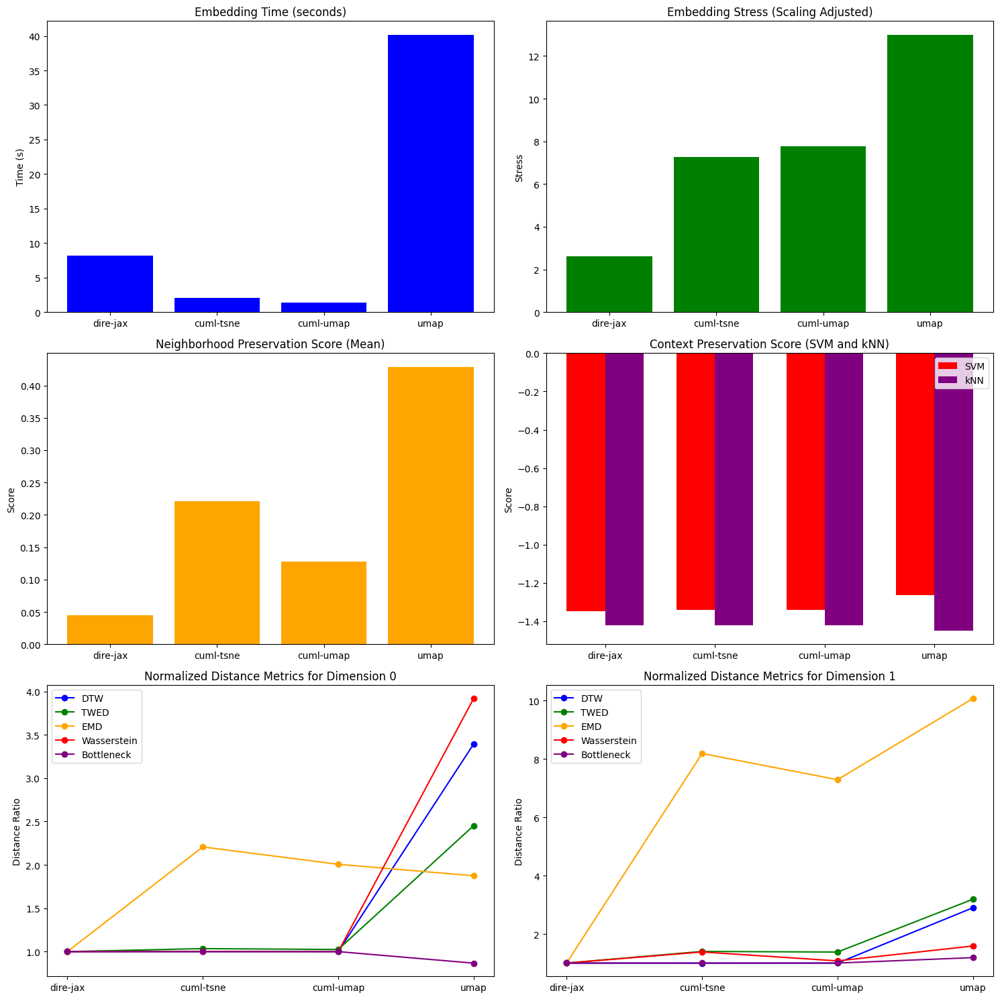

In [29]:
plot_algorithm_comparison(benchmarks_l32)